# ==============================================
# ASSIGNMENT 1: DECONSTRUCTING THE TRANSFORMER
# ==============================================

# Instructions:
## 1. Use Google Colab for all experiments (free GPU tier is sufficient).
## 2. This notebook provides a complementory solution for all parts of the assignment.

# ==============================================
# SUBMISSION INSTRUCTION
# ==============================================

## 1. Please write the name of the file as `Group_(number)_assignemnt_1_solution.ipynb`

##2. Only one member from one group needs to submit the solution, to avoid any duplicasy.

# PART:1

## Tiny Transformer Implementation

You have to complete the code where it's not completed!


"""
Complete the Code
"""

## Imports and Dataset

**We are using language translation dataset for this task (WMT14 DE-EN dataset)**

- Use first 30k samples for training `[You may Increase the training Samples for better results]`

- Use first 5k samples for validation `[You may Increase the validation Samples for better generalization results]`

- Use first 1k samples for testing.

- We have provided the Helping Functions throughout the notebook, you have to complete the Code and Run as per Questions asked in Assignemnt.

- We have Alreday created the `Dataloaders` to get you started quickely and to make sure resulst can be reproduced. Please do not change the Setup and Import Section.

In [1]:
# ============================================
# SETUP AND IMPORTS
# ============================================

# Install required packages
!pip install -q torch matplotlib seaborn numpy
!pip install -q transformers datasets tokenizers
!pip install -q sacrebleu
!pip install bertviz

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import DataLoader, Dataset

import math
import time
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from typing import Tuple, Optional, List, Dict

from datasets import load_dataset
from tokenizers import Tokenizer
from tokenizers.models import WordLevel
from tokenizers.trainers import WordLevelTrainer
from tokenizers.pre_tokenizers import Whitespace

from collections import Counter
import warnings
warnings.filterwarnings('ignore')

# Set random seed for reproducibility
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# ============================================
# DATA LOADING AND PREPROCESSING
# ============================================

# Special tokens
PAD_TOKEN = '<pad>'
SOS_TOKEN = '<sos>'
EOS_TOKEN = '<eos>'
UNK_TOKEN = '<unk>'

# ==============================================================================
#! Change the dataloading samples as asked in the assignemnt.
# ==============================================================================

# ==============================================================================
#! Code Here
# ==============================================================================
# Load WMT14 DE-EN dataset (using a smaller subset)
print("Loading dataset...")
dataset = load_dataset("wmt14", "de-en", split={
    'train': 'train[:30000]',      # Use first ---- samples for training
    'validation': 'validation[:5000]',  # Use first ---- for validation
    'test': 'test[:1000]'          # Use first ---- for testing
})

print(f"Train samples: {len(dataset['train'])}")
print(f"Validation samples: {len(dataset['validation'])}")
print(f"Test samples: {len(dataset['test'])}")

# Example data point
print("\nExample data point:")
print(dataset['train'][0])

# Build tokenizers using Hugging Face tokenizers library
def build_tokenizer(texts: List[str], vocab_size: int = 10000) -> Tokenizer:
    """Build a simple word-level tokenizer"""
    tokenizer = Tokenizer(WordLevel(unk_token=UNK_TOKEN))
    tokenizer.pre_tokenizer = Whitespace()

    trainer = WordLevelTrainer(
        vocab_size=vocab_size,
        special_tokens=[PAD_TOKEN, SOS_TOKEN, EOS_TOKEN, UNK_TOKEN],
        min_frequency=2
    )

    tokenizer.train_from_iterator(texts, trainer)
    return tokenizer

# Extract texts for tokenizer training
print("\nBuilding tokenizers...")
de_texts = [item['translation']['de'] for item in dataset['train']]
en_texts = [item['translation']['en'] for item in dataset['train']]

# Build tokenizers
de_tokenizer = build_tokenizer(de_texts, vocab_size=10000)
en_tokenizer = build_tokenizer(en_texts, vocab_size=10000)

print(f"German vocabulary size: {de_tokenizer.get_vocab_size()}")
print(f"English vocabulary size: {en_tokenizer.get_vocab_size()}")

# Get special token IDs
PAD_IDX = en_tokenizer.token_to_id(PAD_TOKEN)
SOS_IDX = en_tokenizer.token_to_id(SOS_TOKEN)
EOS_IDX = en_tokenizer.token_to_id(EOS_TOKEN)
UNK_IDX = en_tokenizer.token_to_id(UNK_TOKEN)

print(f"\nSpecial token IDs:")
print(f"PAD: {PAD_IDX}, SOS: {SOS_IDX}, EOS: {EOS_IDX}, UNK: {UNK_IDX}")

# ============================================
# DATASET CLASS AND DATA PROCESSING
# ============================================

class TranslationDataset(Dataset):
    """Custom dataset for translation"""

    def __init__(self, data, src_tokenizer, tgt_tokenizer, max_length=100):
        self.data = data
        self.src_tokenizer = src_tokenizer
        self.tgt_tokenizer = tgt_tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        # Get source and target sentences
        src_text = self.data[idx]['translation']['de']
        tgt_text = self.data[idx]['translation']['en']

        # Tokenize
        src_tokens = self.src_tokenizer.encode(src_text)
        tgt_tokens = self.tgt_tokenizer.encode(tgt_text)

        # Truncate if necessary
        src_tokens = src_tokens.ids[:self.max_length-2]  # Leave room for SOS/EOS
        tgt_tokens = tgt_tokens.ids[:self.max_length-2]

        # Add SOS and EOS tokens
        src_tokens = [SOS_IDX] + src_tokens + [EOS_IDX]
        tgt_tokens = [SOS_IDX] + tgt_tokens + [EOS_IDX]

        return torch.tensor(src_tokens), torch.tensor(tgt_tokens)

def collate_fn(batch):
    """Custom collate function to pad sequences"""
    src_batch, tgt_batch = [], []

    for src, tgt in batch:
        src_batch.append(src)
        tgt_batch.append(tgt)

    # Pad sequences
    src_batch = pad_sequence(src_batch, batch_first=True, padding_value=PAD_IDX)
    tgt_batch = pad_sequence(tgt_batch, batch_first=True, padding_value=PAD_IDX)

    return src_batch, tgt_batch

# Create datasets
print("\nCreating datasets...")
train_dataset = TranslationDataset(dataset['train'], de_tokenizer, en_tokenizer)
val_dataset = TranslationDataset(dataset['validation'], de_tokenizer, en_tokenizer)
test_dataset = TranslationDataset(dataset['test'], de_tokenizer, en_tokenizer)

# Create DataLoaders
BATCH_SIZE = 64

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    collate_fn=collate_fn,
    num_workers=2
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    collate_fn=collate_fn,
    num_workers=2
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    collate_fn=collate_fn,
    num_workers=2
)

# Test data loading
print("\nTesting data loading...")
src_batch, tgt_batch = next(iter(train_loader))
print(f"Source batch shape: {src_batch.shape}")
print(f"Target batch shape: {tgt_batch.shape}")

# Show example
print("\nExample tokenized pair:")
src_example = src_batch[0]
tgt_example = tgt_batch[0]

# Decode tokens back to text
src_tokens = [de_tokenizer.id_to_token(idx.item()) for idx in src_example if idx != PAD_IDX]
tgt_tokens = [en_tokenizer.id_to_token(idx.item()) for idx in tgt_example if idx != PAD_IDX]

print(f"Source tokens: {' '.join(src_tokens[:10])}...")
print(f"Target tokens: {' '.join(tgt_tokens[:10])}...")

# Vocabulary mappings for visualization
de_vocab = de_tokenizer.get_vocab()
en_vocab = en_tokenizer.get_vocab()
de_idx2word = {v: k for k, v in de_vocab.items()}
en_idx2word = {v: k for k, v in en_vocab.items()}

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.8/51.8 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.1/104.1 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.5/157.5 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.0/14.0 MB 126.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 57.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.3/85.3 kB 6.5 MB/s eta 0:00:00
Using device: cuda
Loading dataset...


README.md: 0.00B [00:00, ?B/s]

de-en/train-00000-of-00003.parquet:   0%|          | 0.00/280M [00:00<?, ?B/s]

de-en/train-00001-of-00003.parquet:   0%|          | 0.00/265M [00:00<?, ?B/s]

de-en/train-00002-of-00003.parquet:   0%|          | 0.00/273M [00:00<?, ?B/s]

de-en/validation-00000-of-00001.parquet:   0%|          | 0.00/474k [00:00<?, ?B/s]

de-en/test-00000-of-00001.parquet:   0%|          | 0.00/509k [00:00<?, ?B/s]

Generating train split:   0%|          | 0/4508785 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/3000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/3003 [00:00<?, ? examples/s]

Train samples: 30000
Validation samples: 3000
Test samples: 1000

Example data point:
{'translation': {'de': 'Wiederaufnahme der Sitzungsperiode', 'en': 'Resumption of the session'}}

Building tokenizers...
German vocabulary size: 10000
English vocabulary size: 10000

Special token IDs:
PAD: 0, SOS: 1, EOS: 2, UNK: 3

Creating datasets...

Testing data loading...
Source batch shape: torch.Size([64, 62])
Target batch shape: torch.Size([64, 77])

Example tokenized pair:
Source tokens: <sos> Die bisherige Verordnung <unk> mit Ablauf des Jahres 1999...
Target tokens: <sos> The previous regulation expired at the end of 1999...


# PART:1 (A)

- Implement the following.

  - sinusoidal positional encoding

  -  Multi-head attention

  - scaled-dot product attention

  - Feed-forward layer

  - Encoder and Decoder Layer

  - Encoder and Decoder Block

## Solution 1(A)

In [2]:
from tqdm import trange


class PositionalEncoding(nn.Module):
    """
    Add positional encoding to embeddings
    PE(pos, 2i) = sin(pos/10000^(2i/d_model))
    PE(pos, 2i+1) = cos(pos/10000^(2i/d_model))
    """
    def __init__(self, d_model: int, max_len: int = 5000):
        super().__init__()

        # TODO: Implement positional encoding

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0)
        self.register_buffer('pe', pe)


    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        Args:
            x: Tensor of shape (batch_size, seq_len, d_model)
        """
        # TODO: Add positional encoding to input
        return x + self.pe[:, :x.size(1)]

class MultiHeadAttention(nn.Module):
    """
    Multi-Head Attention mechanism
    """
    def __init__(self, d_model: int, n_heads: int, dropout: float = 0.1):
        super().__init__()
        assert d_model % n_heads == 0

        self.d_model = d_model
        self.n_heads = n_heads
        self.d_k = d_model // n_heads

        # TODO: Initialize linear layers for Q, K, V projections and output
        self.fc_q = nn.Linear(d_model, d_model)
        self.fc_k = nn.Linear(d_model, d_model)
        self.fc_v = nn.Linear(d_model, d_model)
        self.fc_o = nn.Linear(d_model, d_model)

        self.dropout = nn.Dropout(dropout)

        # Store attention weights for visualization
        self.attention_weights = None

    def forward(self, query: torch.Tensor, key: torch.Tensor, value: torch.Tensor,
                mask: Optional[torch.Tensor] = None) -> torch.Tensor:
        """
        Args:
            query: (batch_size, seq_len_q, d_model)
            key: (batch_size, seq_len_k, d_model)
            value: (batch_size, seq_len_v, d_model)
            mask: (batch_size, seq_len_q, seq_len_k) or None

        Returns:
            output: (batch_size, seq_len_q, d_model)
        """
        batch_size = query.size(0)

        # TODO: Implement multi-head attention
        Q = self.fc_q(query)
        K = self.fc_k(key)
        V = self.fc_v(value)

        Q = Q.view(batch_size, -1, self.n_heads, self.d_k).transpose(1, 2)
        K = K.view(batch_size, -1, self.n_heads, self.d_k).transpose(1, 2)
        V = V.view(batch_size, -1, self.n_heads, self.d_k).transpose(1, 2)

        x, self.attention_weights = self.scaled_dot_product_attention(Q, K, V, mask)

        x = x.transpose(1, 2).contiguous().view(batch_size, -1, self.d_model)

        output = self.fc_o(x)

        # Attention


        # Store weights for visualization


        #  Concatenate heads


        # Final linear projection


        return output

    def scaled_dot_product_attention(self, Q, K, V, mask=None):
        """
        Calculate scaled dot-product attention
        """
        # TODO: Implement scaled dot-product attention
        # Attention(Q,K,V) = softmax(QK^T/√d_k)V
        scores = torch.matmul(Q, K.transpose(-2, -1)) / math.sqrt(self.d_k)
        if mask is not None:
            scores = scores.masked_fill(mask == 0, -1e9)

        attention_weights = F.softmax(scores, dim=-1)
        output = torch.matmul(self.dropout(attention_weights), V)


        return output, attention_weights

class FeedForward(nn.Module):
    """
    Feed-forward network (FFN)
    FFN(x) = max(0, xW1 + b1)W2 + b2
    """
    def __init__(self, d_model: int, d_ff: int, dropout: float = 0.1):
        super().__init__()

        # TODO: Implement feed-forward network with 2 linear layrers and dropout
        self.fc1 = nn.Linear(d_model, d_ff)
        self.fc2 = nn.Linear(d_ff, d_model)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x: torch.Tensor) -> torch.Tensor:

        # TODO: Implement forward pass
        return self.fc2(self.dropout(F.relu(self.fc1(x))))

class EncoderLayer(nn.Module):
    """
    Single encoder layer consisting of:
    1. Multi-head self-attention
    2. Feed-forward network
    Both with residual connections and layer normalization
    """
    def __init__(self, d_model: int, n_heads: int, d_ff: int, dropout: float = 0.1):
        super().__init__()

        # TODO: Initialize components
        self.self_attn = MultiHeadAttention(d_model, n_heads, dropout)
        self.ff = FeedForward(d_model, d_ff, dropout)
        self.norm1 = nn.LayerNorm(d_model)
        self.norm2 = nn.LayerNorm(d_model)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x: torch.Tensor, mask: Optional[torch.Tensor] = None) -> torch.Tensor:
        # TODO: Implement encoder layer forward pass
        # Remember: residual connections and layer normalization

        # Self-attention block


        # Feed-forward block
        _x = self.self_attn(x, x, x, mask)
        x = self.norm1(x + self.dropout(_x))
        _x = self.ff(x)
        x = self.norm2(x + self.dropout(_x))

        return x

class DecoderLayer(nn.Module):
    """
    Single decoder layer consisting of:
    1. Masked multi-head self-attention
    2. Multi-head cross-attention
    3. Feed-forward network
    All with residual connections and layer normalization
    """
    def __init__(self, d_model: int, n_heads: int, d_ff: int, dropout: float = 0.1):
        super().__init__()

        # TODO: Initialize components
        self.self_attn = MultiHeadAttention(d_model, n_heads, dropout)
        self.cross_attn = MultiHeadAttention(d_model, n_heads, dropout)
        self.ff = FeedForward(d_model, d_ff, dropout)
        self.norm1 = nn.LayerNorm(d_model)
        self.norm2 = nn.LayerNorm(d_model)
        self.norm3 = nn.LayerNorm(d_model)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x: torch.Tensor, encoder_output: torch.Tensor,
                src_mask: Optional[torch.Tensor] = None,
                tgt_mask: Optional[torch.Tensor] = None) -> torch.Tensor:
        # TODO: Implement decoder layer forward pass

        # Masked self-attention block


        # Cross-attention block


        # Feed-forward block
        _x = self.self_attn(x, x, x, tgt_mask)
        x = self.norm1(x + self.dropout(_x))
        _x = self.cross_attn(x, encoder_output, encoder_output, src_mask)
        x = self.norm2(x + self.dropout(_x))
        _x = self.ff(x)
        x = self.norm3(x + self.dropout(_x))

        return x

class Encoder(nn.Module):
    """
    Transformer Encoder consisting of multiple encoder layers
    """
    def __init__(self, n_layers: int, d_model: int, n_heads: int,
                 d_ff: int, dropout: float = 0.1):
        super().__init__()

        # TODO: Create stack of encoder layers with normalization
        self.layers = nn.ModuleList([EncoderLayer(d_model, n_heads, d_ff, dropout) for _ in range(n_layers)])
        self.norm = nn.LayerNorm(d_model)

    def forward(self, x: torch.Tensor, mask: Optional[torch.Tensor] = None) -> torch.Tensor:
        # TODO: Pass input through all encoder layers
        for layer in self.layers:
            x = layer(x, mask)
        return self.norm(x)         #TODO


class Decoder(nn.Module):
    """
    Transformer Decoder consisting of multiple decoder layers
    """
    def __init__(self, n_layers: int, d_model: int, n_heads: int,
                 d_ff: int, dropout: float = 0.1):
        super().__init__()

        # TODO: Create stack of decoder layers with niormlaization
        self.layers = nn.ModuleList([DecoderLayer(d_model, n_heads, d_ff, dropout) for _ in range(n_layers)])
        self.norm = nn.LayerNorm(d_model)

    def forward(self, x: torch.Tensor, encoder_output: torch.Tensor,
                src_mask: Optional[torch.Tensor] = None,
                tgt_mask: Optional[torch.Tensor] = None) -> torch.Tensor:

        # TODO: Pass input through all decoder layers
        for layer in self.layers:
            x = layer(x, encoder_output, src_mask, tgt_mask)
        return self.norm(x) #TODO



## PART - 1(B)

Implement a Tiny Transformer with the following specifications:

    - Embedding dimension: 128

    - Transformer Layers 2

    - Configurable number of attention heads (1,2,4..8 etc)

    - Feed-Forward dim: 512

    - Max-Token Seq Length: 128

## Solution 1(B)

In [3]:
class TinyTransformer(nn.Module):
    """
    Complete Transformer model for translation

    Architecture:
    - Source embedding + positional encoding
    - Target embedding + positional encoding
    - Encoder stack
    - Decoder stack
    - Output projection layer
    """
    def __init__(self, src_vocab_size: int, tgt_vocab_size: int,
                 d_model: int = 256, n_heads: int = 4, n_layers: int = 2,
                 d_ff: int = 1024, max_seq_len: int = 100, dropout: float = 0.1):
        super().__init__()

        # Model parameters
        self.d_model = d_model
        self.n_heads = n_heads

        # TODO: Initialize all components
        # Embeddings

        # Positional encoding

        self.src_embedding = nn.Embedding(src_vocab_size, d_model)
        self.tgt_embedding = nn.Embedding(tgt_vocab_size, d_model)
        self.pos_encoder = PositionalEncoding(d_model, max_seq_len)

        self.encoder = Encoder(n_layers, d_model, n_heads, d_ff, dropout)
        self.decoder = Decoder(n_layers, d_model, n_heads, d_ff, dropout)

        self.fc_out = nn.Linear(d_model, tgt_vocab_size)

        self.dropout = nn.Dropout(dropout)


        # Encoder and Decoder stacks


        # Output projection


        # Dropout


        # Initialize parameters
        self._init_parameters()

    def _init_parameters(self):
        """Initialize parameters with Xavier uniform"""
        for p in self.parameters():
            if p.dim() > 1:
                nn.init.xavier_uniform_(p)

    def create_src_mask(self, src: torch.Tensor) -> torch.Tensor:
        """Create source mask to hide padding tokens"""

        # TODO: Create mask where True indicates valid position

        return (src != PAD_IDX).unsqueeze(1).unsqueeze(2)

    def create_tgt_mask(self, tgt: torch.Tensor) -> torch.Tensor:
        """Create target mask to hide padding tokens and future positions"""
        # TODO: Create mask combining padding mask and causal mask


        # Padding mask


        # Causal mask (lower triangular)
        tgt_pad_mask = (tgt != PAD_IDX).unsqueeze(1).unsqueeze(2)
        tgt_len = tgt.shape[1]
        tgt_sub_mask = torch.tril(torch.ones((tgt_len, tgt_len), device=tgt.device)).bool()
        return tgt_pad_mask & tgt_sub_mask

        # Combine masks


    def encode(self, src: torch.Tensor, src_mask: torch.Tensor) -> torch.Tensor:
        """Encode source sequence"""
        # TODO: Implement encoding
        # 1. Embed source tokens
        # 2. Scale embeddings by sqrt(d_model)
        # 3. Add positional encoding
        # 4. Apply dropout
        # 5. Pass through encoder


        src_emb = self.dropout(self.pos_encoder(self.src_embedding(src) * math.sqrt(self.d_model)))
        return self.encoder(src_emb, src_mask)
        #TODO

    def decode(self, tgt: torch.Tensor, encoder_output: torch.Tensor,
               src_mask: torch.Tensor, tgt_mask: torch.Tensor) -> torch.Tensor:
        """Decode target sequence"""
        # TODO: Implement decoding
        # Similar to encoding but with decoder

        tgt_emb = self.dropout(self.pos_encoder(self.tgt_embedding(tgt) * math.sqrt(self.d_model)))
        # It should call the 'decoder'
        return self.decoder(tgt_emb, encoder_output, src_mask, tgt_mask)


    def forward(self, src: torch.Tensor, tgt: torch.Tensor) -> torch.Tensor:
        """
        Forward pass for training

        Args:
            src: Source sequences (batch_size, src_seq_len)
            tgt: Target sequences (batch_size, tgt_seq_len)

        Returns:
            output: Predicted token logits (batch_size, tgt_seq_len, tgt_vocab_size)
        """
        # TODO: Implement complete forward pass
        # 1. Create masks
        # 2. Encode source
        # 3. Decode target
        # 4. Project to vocabulary
        src_mask = self.create_src_mask(src)
        tgt_mask = self.create_tgt_mask(tgt)

        encoder_output = self.encode(src, src_mask)
        decoder_output = self.decode(tgt, encoder_output, src_mask, tgt_mask)

        return self.fc_out(decoder_output)

    def get_attention_weights(self):
        """
        Extract attention weights from all layers for visualization

        Returns dict with:
        - encoder_self_attention: List of attention weights from encoder layers
        - decoder_self_attention: List of attention weights from decoder self-attention
        - decoder_cross_attention: List of attention weights from decoder cross-attention
        """
        attention_weights = {
            'encoder_self_attention': [],
            'decoder_self_attention': [],
            'decoder_cross_attention': []
        }

        # TODO: Extract attention weights from all layers
        # Encoder self-attention


        # Decoder self-attention and cross-attention
        for layer in self.encoder.layers:
            attention_weights['encoder_self_attention'].append(layer.self_attn.attention_weights)

        for layer in self.decoder.layers:
            attention_weights['decoder_self_attention'].append(layer.self_attn.attention_weights)
            attention_weights['decoder_cross_attention'].append(layer.cross_attn.attention_weights)

        return attention_weights

## PART 1(C-D)

- Train multi head model (4 heads) and single head (1) model, by keeping the number of parameters same, adjust attention head dimension accordingly.

- Implement visualization for different attention types like Encoder self-attention, Decoder self-attention and Decoder cross-attention. Visualize the attentions for multi-head and single-head both for given test sentences.

## Solution 1(C-D)

In [4]:
from tqdm import tqdm, trange

# ============================================
# TODO: WRITE TRAINING FUNCTIONS
# ============================================

def train_epoch(model: nn.Module, dataloader: DataLoader, optimizer: optim.Optimizer,
                criterion: nn.Module, clip: float = 1.0) -> float:
    """Train for one epoch"""
    model.train()

    epoch_loss = 0

    for batch in tqdm(dataloader, desc="Training", leave=False):
        src, tgt = batch
        src = src.to(device)
        tgt = tgt.to(device)
        optimizer.zero_grad()

        output = model(src, tgt[:,:-1])

        output_dim = output.shape[-1]
        output = output.contiguous().view(-1, output_dim)
        tgt_for_loss = tgt[:,1:].contiguous().view(-1)

        loss = criterion(output, tgt_for_loss)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), clip)
        optimizer.step()

        epoch_loss += loss.item()
    return epoch_loss / len(dataloader)

def evaluate(model: nn.Module, dataloader: DataLoader, criterion: nn.Module) -> float:
    """Evaluate model"""
    model.eval()
    epoch_loss = 0
    with torch.no_grad():
        for batch in tqdm(dataloader, desc="Evaluating", leave=False):
            src, tgt = batch
            src = src.to(device)
            tgt = tgt.to(device)
            output = model(src, tgt[:,:-1])

            output_dim = output.shape[-1]
            output = output.contiguous().view(-1, output_dim)
            tgt_for_loss = tgt[:,1:].contiguous().view(-1)

            loss = criterion(output, tgt_for_loss)
            epoch_loss += loss.item()
    return epoch_loss / len(dataloader)

# ============================================
# TODO: WRITE TRANSLATING SENTENCE FUNCTION
# ============================================

def translate_sentence(model: nn.Module, src_sentence: str, max_length: int = 50):
    """Translate a single sentence"""
    model.eval()
    src_tokens = [SOS_IDX] + de_tokenizer.encode(src_sentence).ids + [EOS_IDX]
    src_tensor = torch.LongTensor(src_tokens).unsqueeze(0).to(device)

    tgt_indices = [SOS_IDX]

    for i in range(max_length):
        tgt_tensor = torch.LongTensor(tgt_indices).unsqueeze(0).to(device)
        with torch.no_grad():
            output = model(src_tensor, tgt_tensor)

        pred_token = output.argmax(2)[:,-1].item()
        tgt_indices.append(pred_token)

        if pred_token == EOS_IDX:
            break

    translation_tokens = [en_tokenizer.id_to_token(i) for i in tgt_indices]
    translation = " ".join(translation_tokens)
    return translation, tgt_indices

# ============================================
# TODO: WRITE ATTENTION VISUALIZATION FUNCTION
# ============================================
def plot_attention_matrix(attention, x_labels, y_labels, title):
    fig, ax = plt.subplots(figsize=(8, 8))
    cax = ax.matshow(attention.cpu().numpy(), cmap='bone')
    fig.colorbar(cax)
    ax.set_xticks(range(len(x_labels)))
    ax.set_yticks(range(len(y_labels)))
    ax.set_xticklabels(x_labels, rotation=90)
    ax.set_yticklabels(y_labels)
    ax.set_title(title)
    plt.tight_layout()
    plt.show()


# ========================================================================
# TODO: YOU CAN USE THE ATTENTION VISUALIZATION TOOLS : ADD THE PLOTS HERE
# ========================================================================

def visualize_attention(model: nn.Module, src_sentence: str, tgt_sentence: str = None):
    """
    Visualize attention weights for all heads in all layers
    """
    model.eval()
    translation, tgt_indices = translate_sentence(model, src_sentence)

    src_tokens = [SOS_IDX] + de_tokenizer.encode(src_sentence).ids + [EOS_IDX]
    src_tokens_str = [de_tokenizer.id_to_token(i) for i in src_tokens]
    tgt_tokens_str = [en_tokenizer.id_to_token(i) for i in tgt_indices]

    # Get attention weights
    attention_weights = model.get_attention_weights()

    # 1. Encoder self-attention
    print("--- Encoder Self-Attention ---")
    for layer_idx, attn in enumerate(attention_weights['encoder_self_attention']):
        # We'll visualize the attention for the first head of the first item in the batch
        plot_attention_matrix(attn[0, 0, :, :], src_tokens_str, src_tokens_str, f'Encoder Layer {layer_idx+1}, Head 1')

    # 2. Decoder self-attention
    print("--- Decoder Self-Attention ---")
    for layer_idx, attn in enumerate(attention_weights['decoder_self_attention']):
        plot_attention_matrix(attn[0, 0, :, :], tgt_tokens_str, tgt_tokens_str, f'Decoder Layer {layer_idx+1}, Head 1 (Self)')

    # 3. Decoder cross-attention
    print("--- Decoder Cross-Attention ---")
    for layer_idx, attn in enumerate(attention_weights['decoder_cross_attention']):
        plot_attention_matrix(attn[0, 0, :, :], src_tokens_str, tgt_tokens_str, f'Decoder Layer {layer_idx+1}, Head 1 (Cross)')
    # TODO: Implement visualization for different attention types
    # 1. Encoder self-attention
    # 2. Decoder self-attention
    # 3. Decoder cross-attention



# ===================================================
# TODO: WRITE ATTENTION COMPARISON PATTERNS FUNCTION
# ===================================================

def compare_attention_patterns(model_multi: nn.Module, model_single: nn.Module,
                             src_sentence: str):
    """
    Compare attention patterns between multi-head and single-head models
    """
    print("\n=== COMPARING MULTI-HEAD vs SINGLE-HEAD ATTENTION ===")

  # TODO
    translation_multi, tgt_indices_multi = translate_sentence(model_multi, src_sentence)
    translation_single, tgt_indices_single = translate_sentence(model_single, src_sentence)

    src_tokens = [SOS_IDX] + de_tokenizer.encode(src_sentence).ids + [EOS_IDX]
    src_tokens_str = [de_tokenizer.id_to_token(i) for i in src_tokens]
    tgt_tokens_str_multi = [en_tokenizer.id_to_token(i) for i in tgt_indices_multi]
    tgt_tokens_str_single = [en_tokenizer.id_to_token(i) for i in tgt_indices_single]

    attn_multi = model_multi.get_attention_weights()['decoder_cross_attention'][-1][0] # Last layer, first batch item
    attn_single = model_single.get_attention_weights()['decoder_cross_attention'][-1][0]

    # Plot Multi-head (sum of heads)
    plot_attention_matrix(attn_multi.sum(dim=0), src_tokens_str, tgt_tokens_str_multi, "Multi-Head Cross-Attention (Sum of Heads)")

    # Plot Single-head
    plot_attention_matrix(attn_single[0], src_tokens_str, tgt_tokens_str_single, "Single-Head Cross-Attention")




# ============================================
# TODO: WRITE MAIN TRAINING SCRIPT
# ============================================

def count_parameters(model):
    """Count trainable parameters"""
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

# Model configurations
MODEL_CONFIGS = {
    'multi_head': {
        'd_model': 128,
        'n_heads': 4,
        'n_layers': 2,
        'd_ff': 512,
        'dropout': 0.1
    },
    'single_head': {
        'd_model': 128,
        'n_heads': 1,
        'n_layers': 2,
        'd_ff': 512,
        'dropout': 0.1
    }
}

# Initialize models
print("Initializing models...")

model_multi = TinyTransformer(
    src_vocab_size=len(de_vocab),
    tgt_vocab_size=len(en_vocab),
    **MODEL_CONFIGS['multi_head']
).to(device)

model_single = TinyTransformer(
    src_vocab_size=len(de_vocab),
    tgt_vocab_size=len(en_vocab),
    **MODEL_CONFIGS['single_head']
).to(device)

print(f"Multi-head model parameters: {count_parameters(model_multi):,}")
print(f"Single-head model parameters: {count_parameters(model_single):,}")

# Training settings
LEARNING_RATE = 0.0001 # YOU CAN CHOOSE AS PER TRAINING AND VALIDATION PLOTS
N_EPOCHS = 100# TODO

# Loss function - ignore padding token
criterion = nn.CrossEntropyLoss(ignore_index=PAD_IDX)

# ============================================
# TRAINING LOOP FOR MULTI-HEAD MODEL
# ============================================



# Training history


# ============================================
# TODO: TRAINING LOOP FOR SINGLE-HEAD MODEL
# ============================================



    # Evaluate




    # Save best model


# Load best model
# TODO

# ============================================
# TODO: PLOT TRAINING CURVES
# ============================================


# ============================================
# TODO: EVALUATION AND VISUALIZATION
# ============================================




Initializing models...
Multi-head model parameters: 4,776,208
Single-head model parameters: 4,776,208


In [ ]:
print("\n" + "="*50)
print("TRAINING MULTI-HEAD MODEL (4 heads)")
print("="*50)

optimizer_multi = optim.Adam(model_multi.parameters(), lr=LEARNING_RATE)
train_losses_multi = []
val_losses_multi = []

best_val_loss = float('inf')

for epoch in trange(N_EPOCHS, desc="Epochs"):
    start_time = time.time()

    # Train
    train_loss = train_epoch(model_multi, train_loader, optimizer_multi, criterion)

    # Evaluate
    val_loss = evaluate(model_multi, val_loader, criterion)

    end_time = time.time()
    epoch_mins, epoch_secs = divmod(end_time - start_time, 60)

    train_losses_multi.append(train_loss)
    val_losses_multi.append(val_loss)

    # Save best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model_multi.state_dict(), 'tiny_transformer_multi.pt')

    print(f'Epoch: {epoch+1:02} | Time: {epoch_mins:.0f}m {epoch_secs:.0f}s')
    print(f'\tTrain Loss: {train_loss:.3f} | Val Loss: {val_loss:.3f}')

# Load best model
model_multi.load_state_dict(torch.load('tiny_transformer_multi.pt'))
checkpoint = {
    'model_state_dict': model_multi.state_dict(),
    'val_losses': val_losses_multi, # The validation loss list
    'train_losses': train_losses_multi # You can also save the training loss
}

# 3. Save the dictionary to a single .pt file
torch.save(checkpoint, 'model_multi_checkpoint.pt')


TRAINING MULTI-HEAD MODEL (4 heads)


Training: 100%|██████████| 469/469 [00:23<00:00, 22.32it/s]
                                                           
Epochs:   1%|          | 1/100 [00:25<41:28, 25.13s/it]

Epoch: 01 | Time: 0m 25s
	Train Loss: 6.973 | Val Loss: 6.024



Training: 100%|█████████▉| 468/469 [00:22<00:00, 18.56it/s]
                                                           
Epochs:   2%|▏         | 2/100 [00:49<39:52, 24.42s/it]

Epoch: 02 | Time: 0m 24s
	Train Loss: 5.636 | Val Loss: 5.489



Training: 100%|█████████▉| 467/469 [00:22<00:00, 18.67it/s]
                                                           
Epochs:   3%|▎         | 3/100 [01:13<39:30, 24.44s/it]

Epoch: 03 | Time: 0m 24s
	Train Loss: 5.133 | Val Loss: 5.256



Training: 100%|█████████▉| 467/469 [00:22<00:00, 18.88it/s]
                                                           
Epochs:   4%|▍         | 4/100 [01:38<39:19, 24.58s/it]

Epoch: 04 | Time: 0m 25s
	Train Loss: 4.882 | Val Loss: 5.075



Training: 100%|█████████▉| 468/469 [00:22<00:00, 21.39it/s]
                                                           
Epochs:   5%|▌         | 5/100 [02:02<38:43, 24.46s/it]

Epoch: 05 | Time: 0m 24s
	Train Loss: 4.695 | Val Loss: 4.962



Training: 100%|█████████▉| 467/469 [00:22<00:00, 21.25it/s]
                                                           
Epochs:   6%|▌         | 6/100 [02:26<38:11, 24.38s/it]

Epoch: 06 | Time: 0m 24s
	Train Loss: 4.543 | Val Loss: 4.850



Training: 100%|█████████▉| 467/469 [00:23<00:00, 21.12it/s]
                                                           
Epochs:   7%|▋         | 7/100 [02:51<37:55, 24.46s/it]

Epoch: 07 | Time: 0m 25s
	Train Loss: 4.412 | Val Loss: 4.777



Training: 100%|██████████| 469/469 [00:23<00:00, 21.80it/s]
                                                           
Epochs:   8%|▊         | 8/100 [03:16<37:39, 24.56s/it]

Epoch: 08 | Time: 0m 25s
	Train Loss: 4.296 | Val Loss: 4.703



Training: 100%|██████████| 469/469 [00:23<00:00, 21.46it/s]
                                                           
Epochs:   9%|▉         | 9/100 [03:40<37:20, 24.62s/it]

Epoch: 09 | Time: 0m 25s
	Train Loss: 4.190 | Val Loss: 4.645



Training: 100%|██████████| 469/469 [00:23<00:00, 22.82it/s]
                                                           
Epochs:  10%|█         | 10/100 [04:05<37:00, 24.68s/it]

Epoch: 10 | Time: 0m 25s
	Train Loss: 4.093 | Val Loss: 4.588



Training: 100%|█████████▉| 467/469 [00:23<00:00, 20.89it/s]
                                                           
Epochs:  11%|█         | 11/100 [04:30<36:35, 24.67s/it]

Epoch: 11 | Time: 0m 25s
	Train Loss: 4.002 | Val Loss: 4.550



Training: 100%|█████████▉| 468/469 [00:23<00:00, 20.97it/s]
                                                           
Epochs:  12%|█▏        | 12/100 [04:55<36:19, 24.76s/it]

Epoch: 12 | Time: 0m 25s
	Train Loss: 3.920 | Val Loss: 4.507



Training: 100%|██████████| 469/469 [00:23<00:00, 20.93it/s]
                                                           
Epochs:  13%|█▎        | 13/100 [05:20<36:08, 24.92s/it]

Epoch: 13 | Time: 0m 25s
	Train Loss: 3.843 | Val Loss: 4.477



Training: 100%|██████████| 469/469 [00:23<00:00, 22.15it/s]
                                                           
Epochs:  14%|█▍        | 14/100 [05:45<35:49, 25.00s/it]

Epoch: 14 | Time: 0m 25s
	Train Loss: 3.769 | Val Loss: 4.471



Training: 100%|█████████▉| 467/469 [00:23<00:00, 20.13it/s]
                                                           
Epochs:  15%|█▌        | 15/100 [06:11<35:34, 25.11s/it]

Epoch: 15 | Time: 0m 25s
	Train Loss: 3.703 | Val Loss: 4.421



Training: 100%|█████████▉| 467/469 [00:23<00:00, 20.13it/s]
                                                           
Epochs:  16%|█▌        | 16/100 [06:36<35:11, 25.14s/it]

Epoch: 16 | Time: 0m 25s
	Train Loss: 3.636 | Val Loss: 4.403



Training: 100%|█████████▉| 467/469 [00:23<00:00, 20.07it/s]
                                                           
Epochs:  17%|█▋        | 17/100 [07:01<34:52, 25.21s/it]

Epoch: 17 | Time: 0m 25s
	Train Loss: 3.574 | Val Loss: 4.384



Training: 100%|██████████| 469/469 [00:24<00:00, 19.70it/s]
                                                           
Epochs:  18%|█▊        | 18/100 [07:27<34:32, 25.28s/it]

Epoch: 18 | Time: 0m 25s
	Train Loss: 3.516 | Val Loss: 4.366



Training: 100%|█████████▉| 468/469 [00:23<00:00, 17.73it/s]
                                                           
Epochs:  19%|█▉        | 19/100 [07:52<34:05, 25.25s/it]

Epoch: 19 | Time: 0m 25s
	Train Loss: 3.460 | Val Loss: 4.381



Training: 100%|█████████▉| 468/469 [00:23<00:00, 17.45it/s]
                                                           
Epochs:  20%|██        | 20/100 [08:17<33:40, 25.26s/it]

Epoch: 20 | Time: 0m 25s
	Train Loss: 3.405 | Val Loss: 4.331



Training: 100%|█████████▉| 468/469 [00:23<00:00, 18.69it/s]
                                                           
Epochs:  21%|██        | 21/100 [08:42<33:14, 25.25s/it]

Epoch: 21 | Time: 0m 25s
	Train Loss: 3.353 | Val Loss: 4.334



Training: 100%|█████████▉| 468/469 [00:23<00:00, 21.91it/s]
                                                           
Epochs:  22%|██▏       | 22/100 [09:08<32:46, 25.21s/it]

Epoch: 22 | Time: 0m 25s
	Train Loss: 3.303 | Val Loss: 4.314



Training: 100%|██████████| 469/469 [00:23<00:00, 22.41it/s]
                                                           
Epochs:  23%|██▎       | 23/100 [09:33<32:24, 25.25s/it]

Epoch: 23 | Time: 0m 25s
	Train Loss: 3.253 | Val Loss: 4.302



Training: 100%|█████████▉| 468/469 [00:23<00:00, 20.43it/s]
                                                           
Epochs:  24%|██▍       | 24/100 [09:58<31:58, 25.24s/it]

Epoch: 24 | Time: 0m 25s
	Train Loss: 3.207 | Val Loss: 4.324



Training: 100%|█████████▉| 467/469 [00:23<00:00, 20.89it/s]
                                                           
Epochs:  25%|██▌       | 25/100 [10:23<31:35, 25.27s/it]

Epoch: 25 | Time: 0m 25s
	Train Loss: 3.161 | Val Loss: 4.295



Training: 100%|██████████| 469/469 [00:23<00:00, 21.74it/s]
                                                           
Epochs:  26%|██▌       | 26/100 [10:49<31:06, 25.22s/it]

Epoch: 26 | Time: 0m 25s
	Train Loss: 3.118 | Val Loss: 4.295



Training: 100%|██████████| 469/469 [00:23<00:00, 21.08it/s]
                                                           
Epochs:  27%|██▋       | 27/100 [11:14<30:43, 25.25s/it]

Epoch: 27 | Time: 0m 25s
	Train Loss: 3.076 | Val Loss: 4.282



Training: 100%|█████████▉| 468/469 [00:24<00:00, 21.42it/s]
                                                           
Epochs:  28%|██▊       | 28/100 [11:40<30:27, 25.39s/it]

Epoch: 28 | Time: 0m 26s
	Train Loss: 3.034 | Val Loss: 4.282



Training: 100%|█████████▉| 467/469 [00:24<00:00, 20.34it/s]
                                                           
Epochs:  29%|██▉       | 29/100 [12:05<30:05, 25.43s/it]

Epoch: 29 | Time: 0m 25s
	Train Loss: 2.994 | Val Loss: 4.264



Training: 100%|█████████▉| 467/469 [00:24<00:00, 21.43it/s]
                                                           
Epochs:  30%|███       | 30/100 [12:31<29:47, 25.53s/it]

Epoch: 30 | Time: 0m 26s
	Train Loss: 2.956 | Val Loss: 4.260



Training: 100%|██████████| 469/469 [00:24<00:00, 20.93it/s]
                                                           
Epochs:  31%|███       | 31/100 [12:57<29:27, 25.61s/it]

Epoch: 31 | Time: 0m 26s
	Train Loss: 2.920 | Val Loss: 4.252



Training: 100%|█████████▉| 468/469 [00:24<00:00, 20.88it/s]
                                                           
Epochs:  32%|███▏      | 32/100 [13:23<29:07, 25.70s/it]

Epoch: 32 | Time: 0m 26s
	Train Loss: 2.885 | Val Loss: 4.258



Training: 100%|█████████▉| 468/469 [00:24<00:00, 19.77it/s]
                                                           
Epochs:  33%|███▎      | 33/100 [13:49<28:48, 25.79s/it]

Epoch: 33 | Time: 0m 26s
	Train Loss: 2.849 | Val Loss: 4.256



Training: 100%|█████████▉| 467/469 [00:24<00:00, 17.94it/s]
                                                           
Epochs:  34%|███▍      | 34/100 [14:14<28:23, 25.81s/it]

Epoch: 34 | Time: 0m 26s
	Train Loss: 2.816 | Val Loss: 4.256



Training: 100%|█████████▉| 468/469 [00:24<00:00, 17.75it/s]
                                                           
Epochs:  35%|███▌      | 35/100 [14:40<27:58, 25.82s/it]

Epoch: 35 | Time: 0m 26s
	Train Loss: 2.782 | Val Loss: 4.248



Training: 100%|█████████▉| 468/469 [00:24<00:00, 19.08it/s]
                                                           
Epochs:  36%|███▌      | 36/100 [15:06<27:37, 25.89s/it]

Epoch: 36 | Time: 0m 26s
	Train Loss: 2.753 | Val Loss: 4.261



Training: 100%|██████████| 469/469 [00:24<00:00, 19.81it/s]
                                                           
Epochs:  37%|███▋      | 37/100 [15:33<27:17, 25.98s/it]

Epoch: 37 | Time: 0m 26s
	Train Loss: 2.721 | Val Loss: 4.240



Training: 100%|██████████| 469/469 [00:24<00:00, 18.74it/s]
                                                           
Epochs:  38%|███▊      | 38/100 [15:59<26:58, 26.11s/it]

Epoch: 38 | Time: 0m 26s
	Train Loss: 2.692 | Val Loss: 4.257



Training: 100%|█████████▉| 467/469 [00:24<00:00, 21.16it/s]
                                                           
Epochs:  39%|███▉      | 39/100 [16:25<26:32, 26.10s/it]

Epoch: 39 | Time: 0m 26s
	Train Loss: 2.664 | Val Loss: 4.282



Training: 100%|██████████| 469/469 [00:24<00:00, 22.72it/s]
                                                           
Epochs:  40%|████      | 40/100 [16:51<26:08, 26.15s/it]

Epoch: 40 | Time: 0m 26s
	Train Loss: 2.635 | Val Loss: 4.267



Training: 100%|█████████▉| 467/469 [00:24<00:00, 20.41it/s]
                                                           
Epochs:  41%|████      | 41/100 [17:18<25:44, 26.18s/it]

Epoch: 41 | Time: 0m 26s
	Train Loss: 2.608 | Val Loss: 4.259



Training: 100%|█████████▉| 468/469 [00:24<00:00, 20.14it/s]
                                                           
Epochs:  42%|████▏     | 42/100 [17:44<25:16, 26.15s/it]

Epoch: 42 | Time: 0m 26s
	Train Loss: 2.581 | Val Loss: 4.261



Training: 100%|█████████▉| 467/469 [00:25<00:00, 20.97it/s]
                                                           
Epochs:  43%|████▎     | 43/100 [18:10<24:56, 26.25s/it]

Epoch: 43 | Time: 0m 26s
	Train Loss: 2.556 | Val Loss: 4.274



Training: 100%|██████████| 469/469 [00:24<00:00, 22.01it/s]
                                                           
Epochs:  44%|████▍     | 44/100 [18:36<24:28, 26.23s/it]

Epoch: 44 | Time: 0m 26s
	Train Loss: 2.532 | Val Loss: 4.259



Training: 100%|██████████| 469/469 [00:25<00:00, 20.87it/s]
                                                           
Epochs:  45%|████▌     | 45/100 [19:03<24:08, 26.34s/it]

Epoch: 45 | Time: 0m 27s
	Train Loss: 2.507 | Val Loss: 4.271



Training: 100%|█████████▉| 468/469 [00:24<00:00, 20.94it/s]
                                                           
Epochs:  46%|████▌     | 46/100 [19:29<23:39, 26.29s/it]

Epoch: 46 | Time: 0m 26s
	Train Loss: 2.485 | Val Loss: 4.292



Training: 100%|██████████| 469/469 [00:25<00:00, 20.59it/s]
                                                           
Epochs:  47%|████▋     | 47/100 [19:56<23:18, 26.38s/it]

Epoch: 47 | Time: 0m 27s
	Train Loss: 2.462 | Val Loss: 4.308



Training: 100%|██████████| 469/469 [00:25<00:00, 21.64it/s]
                                                           
Epochs:  48%|████▊     | 48/100 [20:22<22:55, 26.45s/it]

Epoch: 48 | Time: 0m 27s
	Train Loss: 2.438 | Val Loss: 4.298



Training: 100%|██████████| 469/469 [00:24<00:00, 20.80it/s]
                                                           
Epochs:  49%|████▉     | 49/100 [20:49<22:26, 26.41s/it]

Epoch: 49 | Time: 0m 26s
	Train Loss: 2.417 | Val Loss: 4.314



Training: 100%|█████████▉| 467/469 [00:24<00:00, 20.18it/s]
                                                           
Epochs:  50%|█████     | 50/100 [21:15<21:59, 26.39s/it]

Epoch: 50 | Time: 0m 26s
	Train Loss: 2.398 | Val Loss: 4.326



Training: 100%|█████████▉| 468/469 [00:24<00:00, 20.30it/s]
                                                           
Epochs:  51%|█████     | 51/100 [21:41<21:29, 26.31s/it]

Epoch: 51 | Time: 0m 26s
	Train Loss: 2.376 | Val Loss: 4.324



Training: 100%|█████████▉| 467/469 [00:24<00:00, 17.72it/s]
                                                           
Epochs:  52%|█████▏    | 52/100 [22:07<20:59, 26.25s/it]

Epoch: 52 | Time: 0m 26s
	Train Loss: 2.356 | Val Loss: 4.330



Training: 100%|█████████▉| 468/469 [00:24<00:00, 18.36it/s]
                                                           
Epochs:  53%|█████▎    | 53/100 [22:34<20:35, 26.29s/it]

Epoch: 53 | Time: 0m 26s
	Train Loss: 2.336 | Val Loss: 4.331



Training: 100%|██████████| 469/469 [00:24<00:00, 18.27it/s]
                                                           
Epochs:  54%|█████▍    | 54/100 [23:00<20:12, 26.37s/it]

Epoch: 54 | Time: 0m 27s
	Train Loss: 2.318 | Val Loss: 4.362



Training: 100%|█████████▉| 467/469 [00:24<00:00, 20.94it/s]
                                                           
Epochs:  55%|█████▌    | 55/100 [23:26<19:45, 26.35s/it]

Epoch: 55 | Time: 0m 26s
	Train Loss: 2.297 | Val Loss: 4.364



Training: 100%|██████████| 469/469 [00:24<00:00, 21.37it/s]
                                                           
Epochs:  56%|█████▌    | 56/100 [23:53<19:17, 26.30s/it]

Epoch: 56 | Time: 0m 26s
	Train Loss: 2.280 | Val Loss: 4.358



Training: 100%|█████████▉| 468/469 [00:25<00:00, 21.24it/s]
                                                           
Epochs:  57%|█████▋    | 57/100 [24:19<18:55, 26.40s/it]

Epoch: 57 | Time: 0m 27s
	Train Loss: 2.263 | Val Loss: 4.368



Training: 100%|█████████▉| 468/469 [00:25<00:00, 20.93it/s]
                                                           
Epochs:  58%|█████▊    | 58/100 [24:46<18:29, 26.42s/it]

Epoch: 58 | Time: 0m 26s
	Train Loss: 2.245 | Val Loss: 4.391



Training: 100%|█████████▉| 468/469 [00:25<00:00, 21.80it/s]
                                                           
Epochs:  59%|█████▉    | 59/100 [25:12<18:08, 26.54s/it]

Epoch: 59 | Time: 0m 27s
	Train Loss: 2.229 | Val Loss: 4.385



Training: 100%|█████████▉| 468/469 [00:25<00:00, 19.76it/s]
                                                           
Epochs:  60%|██████    | 60/100 [25:39<17:44, 26.61s/it]

Epoch: 60 | Time: 0m 27s
	Train Loss: 2.214 | Val Loss: 4.408



Training: 100%|█████████▉| 468/469 [00:25<00:00, 21.12it/s]
                                                           
Epochs:  61%|██████    | 61/100 [26:06<17:18, 26.64s/it]

Epoch: 61 | Time: 0m 27s
	Train Loss: 2.195 | Val Loss: 4.416



Training: 100%|█████████▉| 468/469 [00:25<00:00, 20.97it/s]
                                                           
Epochs:  62%|██████▏   | 62/100 [26:33<16:52, 26.64s/it]

Epoch: 62 | Time: 0m 27s
	Train Loss: 2.179 | Val Loss: 4.423



Training: 100%|██████████| 469/469 [00:25<00:00, 19.48it/s]
                                                           
Epochs:  63%|██████▎   | 63/100 [27:00<16:29, 26.73s/it]

Epoch: 63 | Time: 0m 27s
	Train Loss: 2.165 | Val Loss: 4.442



Training: 100%|█████████▉| 468/469 [00:25<00:00, 19.48it/s]
                                                           
Epochs:  64%|██████▍   | 64/100 [27:27<16:08, 26.89s/it]

Epoch: 64 | Time: 0m 27s
	Train Loss: 2.150 | Val Loss: 4.432



Training: 100%|█████████▉| 468/469 [00:26<00:00, 17.12it/s]
                                                           
Epochs:  65%|██████▌   | 65/100 [27:54<15:48, 27.10s/it]

Epoch: 65 | Time: 0m 28s
	Train Loss: 2.137 | Val Loss: 4.464



Training: 100%|█████████▉| 468/469 [00:25<00:00, 18.49it/s]
                                                           
Epochs:  66%|██████▌   | 66/100 [28:22<15:25, 27.23s/it]

Epoch: 66 | Time: 0m 28s
	Train Loss: 2.121 | Val Loss: 4.447



Training: 100%|██████████| 469/469 [00:25<00:00, 19.73it/s]
                                                           
Epochs:  67%|██████▋   | 67/100 [28:49<14:59, 27.26s/it]

Epoch: 67 | Time: 0m 27s
	Train Loss: 2.105 | Val Loss: 4.466



Training: 100%|█████████▉| 468/469 [00:25<00:00, 18.59it/s]
                                                           
Epochs:  68%|██████▊   | 68/100 [29:16<14:31, 27.22s/it]

Epoch: 68 | Time: 0m 27s
	Train Loss: 2.091 | Val Loss: 4.486



Training: 100%|██████████| 469/469 [00:25<00:00, 18.96it/s]
                                                           
Epochs:  69%|██████▉   | 69/100 [29:44<14:08, 27.37s/it]

Epoch: 69 | Time: 0m 28s
	Train Loss: 2.077 | Val Loss: 4.501



Training: 100%|█████████▉| 468/469 [00:25<00:00, 16.88it/s]
                                                           
Epochs:  70%|███████   | 70/100 [30:12<13:42, 27.42s/it]

Epoch: 70 | Time: 0m 28s
	Train Loss: 2.065 | Val Loss: 4.504



Training: 100%|█████████▉| 468/469 [00:25<00:00, 18.57it/s]
                                                           
Epochs:  71%|███████   | 71/100 [30:39<13:15, 27.44s/it]

Epoch: 71 | Time: 0m 27s
	Train Loss: 2.051 | Val Loss: 4.513



Training: 100%|█████████▉| 467/469 [00:25<00:00, 18.59it/s]
                                                           
Epochs:  72%|███████▏  | 72/100 [31:07<12:50, 27.50s/it]

Epoch: 72 | Time: 0m 28s
	Train Loss: 2.038 | Val Loss: 4.526



Training: 100%|█████████▉| 467/469 [00:25<00:00, 19.06it/s]
                                                           
Epochs:  73%|███████▎  | 73/100 [31:34<12:20, 27.43s/it]

Epoch: 73 | Time: 0m 27s
	Train Loss: 2.029 | Val Loss: 4.548



Training: 100%|█████████▉| 468/469 [00:26<00:00, 21.37it/s]
                                                           
Epochs:  74%|███████▍  | 74/100 [32:02<11:56, 27.55s/it]

Epoch: 74 | Time: 0m 28s
	Train Loss: 2.013 | Val Loss: 4.547



Training: 100%|██████████| 469/469 [00:26<00:00, 20.81it/s]
                                                           
Epochs:  75%|███████▌  | 75/100 [32:30<11:31, 27.65s/it]

Epoch: 75 | Time: 0m 28s
	Train Loss: 2.003 | Val Loss: 4.568



Training: 100%|█████████▉| 468/469 [00:26<00:00, 19.58it/s]
                                                           
Epochs:  76%|███████▌  | 76/100 [32:58<11:05, 27.74s/it]

Epoch: 76 | Time: 0m 28s
	Train Loss: 1.989 | Val Loss: 4.558



Training: 100%|█████████▉| 467/469 [00:26<00:00, 20.30it/s]
                                                           
Epochs:  77%|███████▋  | 77/100 [33:26<10:43, 27.97s/it]

Epoch: 77 | Time: 0m 29s
	Train Loss: 1.976 | Val Loss: 4.599



Training: 100%|█████████▉| 467/469 [00:26<00:00, 19.30it/s]
                                                           
Epochs:  78%|███████▊  | 78/100 [33:54<10:14, 27.94s/it]

Epoch: 78 | Time: 0m 28s
	Train Loss: 1.965 | Val Loss: 4.591



Training: 100%|█████████▉| 468/469 [00:26<00:00, 18.95it/s]
                                                           
Epochs:  79%|███████▉  | 79/100 [34:23<09:50, 28.11s/it]

Epoch: 79 | Time: 0m 28s
	Train Loss: 1.953 | Val Loss: 4.608



Training: 100%|██████████| 469/469 [00:27<00:00, 20.99it/s]
                                                           
Epochs:  80%|████████  | 80/100 [34:51<09:26, 28.32s/it]

Epoch: 80 | Time: 0m 29s
	Train Loss: 1.945 | Val Loss: 4.610



Training: 100%|█████████▉| 467/469 [00:27<00:00, 18.98it/s]
                                                           
Epochs:  81%|████████  | 81/100 [35:20<09:02, 28.53s/it]

Epoch: 81 | Time: 0m 29s
	Train Loss: 1.932 | Val Loss: 4.620



Training: 100%|██████████| 469/469 [00:27<00:00, 19.84it/s]
                                                           
Epochs:  82%|████████▏ | 82/100 [35:49<08:36, 28.67s/it]

Epoch: 82 | Time: 0m 29s
	Train Loss: 1.923 | Val Loss: 4.640



Training: 100%|█████████▉| 467/469 [00:26<00:00, 16.49it/s]
                                                           
Epochs:  83%|████████▎ | 83/100 [36:18<08:07, 28.70s/it]

Epoch: 83 | Time: 0m 29s
	Train Loss: 1.910 | Val Loss: 4.650



Training: 100%|█████████▉| 468/469 [00:26<00:00, 16.89it/s]
                                                           
Epochs:  84%|████████▍ | 84/100 [36:47<07:38, 28.65s/it]

Epoch: 84 | Time: 0m 29s
	Train Loss: 1.900 | Val Loss: 4.664



Training: 100%|█████████▉| 468/469 [00:25<00:00, 18.01it/s]
                                                           
Epochs:  85%|████████▌ | 85/100 [37:15<07:07, 28.48s/it]

Epoch: 85 | Time: 0m 28s
	Train Loss: 1.891 | Val Loss: 4.677



Training: 100%|█████████▉| 467/469 [00:26<00:00, 15.99it/s]
                                                           
Epochs:  86%|████████▌ | 86/100 [37:44<06:40, 28.63s/it]

Epoch: 86 | Time: 0m 29s
	Train Loss: 1.881 | Val Loss: 4.678



Training: 100%|██████████| 469/469 [00:27<00:00, 17.00it/s]
                                                           
Epochs:  87%|████████▋ | 87/100 [38:13<06:14, 28.78s/it]

Epoch: 87 | Time: 0m 29s
	Train Loss: 1.870 | Val Loss: 4.693



Training: 100%|█████████▉| 467/469 [00:27<00:00, 16.28it/s]
                                                           
Epochs:  88%|████████▊ | 88/100 [38:42<05:47, 28.92s/it]

Epoch: 88 | Time: 0m 29s
	Train Loss: 1.861 | Val Loss: 4.717



Training: 100%|█████████▉| 467/469 [00:27<00:00, 18.14it/s]
                                                           
Epochs:  89%|████████▉ | 89/100 [39:12<05:20, 29.14s/it]

Epoch: 89 | Time: 0m 30s
	Train Loss: 1.850 | Val Loss: 4.717



Training: 100%|█████████▉| 468/469 [00:27<00:00, 19.37it/s]
                                                           
Epochs:  90%|█████████ | 90/100 [39:41<04:51, 29.18s/it]

Epoch: 90 | Time: 0m 29s
	Train Loss: 1.840 | Val Loss: 4.732



Training: 100%|█████████▉| 468/469 [00:27<00:00, 18.83it/s]
                                                           
Epochs:  91%|█████████ | 91/100 [40:11<04:23, 29.27s/it]

Epoch: 91 | Time: 0m 29s
	Train Loss: 1.836 | Val Loss: 4.745



Training: 100%|█████████▉| 467/469 [00:27<00:00, 18.38it/s]
                                                           
Epochs:  92%|█████████▏| 92/100 [40:40<03:53, 29.19s/it]

Epoch: 92 | Time: 0m 29s
	Train Loss: 1.825 | Val Loss: 4.741



Training: 100%|█████████▉| 467/469 [00:27<00:00, 17.94it/s]
                                                           
Epochs:  93%|█████████▎| 93/100 [41:09<03:25, 29.33s/it]

Epoch: 93 | Time: 0m 30s
	Train Loss: 1.814 | Val Loss: 4.757



Training: 100%|█████████▉| 468/469 [00:27<00:00, 18.44it/s]
                                                           
Epochs:  94%|█████████▍| 94/100 [41:39<02:56, 29.41s/it]

Epoch: 94 | Time: 0m 30s
	Train Loss: 1.808 | Val Loss: 4.774



Training: 100%|█████████▉| 468/469 [00:28<00:00, 19.26it/s]
                                                           
Epochs:  95%|█████████▌| 95/100 [42:09<02:27, 29.57s/it]

Epoch: 95 | Time: 0m 30s
	Train Loss: 1.797 | Val Loss: 4.787



Training: 100%|█████████▉| 467/469 [00:27<00:00, 19.75it/s]
                                                           
Epochs:  96%|█████████▌| 96/100 [42:38<01:58, 29.52s/it]

Epoch: 96 | Time: 0m 29s
	Train Loss: 1.790 | Val Loss: 4.779



Training: 100%|█████████▉| 468/469 [00:27<00:00, 19.49it/s]
                                                           
Epochs:  97%|█████████▋| 97/100 [43:08<01:28, 29.62s/it]

Epoch: 97 | Time: 0m 30s
	Train Loss: 1.783 | Val Loss: 4.793



Training: 100%|█████████▉| 468/469 [00:27<00:00, 17.53it/s]
                                                           
Epochs:  98%|█████████▊| 98/100 [43:38<00:59, 29.65s/it]

Epoch: 98 | Time: 0m 30s
	Train Loss: 1.773 | Val Loss: 4.809



Training: 100%|█████████▉| 468/469 [00:27<00:00, 17.93it/s]
                                                           
Epochs:  99%|█████████▉| 99/100 [44:08<00:29, 29.72s/it]

Epoch: 99 | Time: 0m 30s
	Train Loss: 1.764 | Val Loss: 4.819



Training: 100%|██████████| 469/469 [00:27<00:00, 19.20it/s]
                                                           
Epochs: 100%|██████████| 100/100 [44:38<00:00, 26.78s/it]


Epoch: 100 | Time: 0m 30s
	Train Loss: 1.757 | Val Loss: 4.835


In [5]:
checkpoint = torch.load('model_multi_checkpoint.pt')

# 3. Load the parameters into the model instance
model_multi.load_state_dict(checkpoint['model_state_dict'])

# 4. Retrieve the validation loss list
loaded_val_losses = checkpoint['val_losses']

In [ ]:
print("\n" + "="*50)
print("TRAINING SINGLE-HEAD MODEL")
print("="*50)

optimizer_single = optim.Adam(model_single.parameters(), lr=LEARNING_RATE)

# Training history
train_losses_single = []
val_losses_single = []

best_val_loss = float('inf')# TODO

for epoch in trange(N_EPOCHS):
    start_time = time.time()

    # Train
    train_loss = train_epoch(model_single, train_loader, optimizer_single, criterion)
    val_loss = evaluate(model_single, val_loader, criterion)
    end_time = time.time()
    epoch_mins, epoch_secs = divmod(end_time - start_time, 60)

    train_losses_single.append(train_loss)
    val_losses_single.append(val_loss)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model_single.state_dict(), 'tiny_transformer_single.pt')
    print(f'Epoch: {epoch+1:02} | Time: {epoch_mins:.0f}m {epoch_secs:.0f}s')
    print(f'\tTrain Loss: {train_loss:.3f} | Val Loss: {val_loss:.3f}')

# Load best model
# TODO

model_single.load_state_dict(torch.load('tiny_transformer_single.pt'))


TRAINING SINGLE-HEAD MODEL


Training: 100%|██████████| 469/469 [00:21<00:00, 24.87it/s]
                                                           
  1%|          | 1/100 [00:23<38:01, 23.05s/it]

Epoch: 01 | Time: 0m 23s
	Train Loss: 6.988 | Val Loss: 6.034



Training: 100%|█████████▉| 467/469 [00:21<00:00, 23.52it/s]
                                                           
  2%|▏         | 2/100 [00:45<37:02, 22.68s/it]

Epoch: 02 | Time: 0m 22s
	Train Loss: 5.645 | Val Loss: 5.474



Training: 100%|█████████▉| 468/469 [00:21<00:00, 19.65it/s]
                                                           
  3%|▎         | 3/100 [01:08<36:35, 22.64s/it]

Epoch: 03 | Time: 0m 23s
	Train Loss: 5.122 | Val Loss: 5.245



Training: 100%|██████████| 469/469 [00:20<00:00, 24.84it/s]
                                                           
  4%|▍         | 4/100 [01:29<35:41, 22.31s/it]

Epoch: 04 | Time: 0m 22s
	Train Loss: 4.857 | Val Loss: 5.049



Training: 100%|█████████▉| 467/469 [00:25<00:00, 18.39it/s]
                                                           
  5%|▌         | 5/100 [01:58<38:45, 24.48s/it]

Epoch: 05 | Time: 0m 28s
	Train Loss: 4.666 | Val Loss: 4.925



Training: 100%|█████████▉| 467/469 [00:21<00:00, 23.40it/s]
                                                           
  6%|▌         | 6/100 [02:21<37:33, 23.98s/it]

Epoch: 06 | Time: 0m 23s
	Train Loss: 4.514 | Val Loss: 4.815



Training: 100%|█████████▉| 467/469 [00:21<00:00, 23.28it/s]
                                                           
  7%|▋         | 7/100 [02:43<36:22, 23.46s/it]

Epoch: 07 | Time: 0m 22s
	Train Loss: 4.387 | Val Loss: 4.748



Training: 100%|██████████| 469/469 [00:21<00:00, 24.44it/s]
                                                           
  8%|▊         | 8/100 [03:06<35:47, 23.34s/it]

Epoch: 08 | Time: 0m 23s
	Train Loss: 4.271 | Val Loss: 4.679



Training: 100%|█████████▉| 468/469 [00:21<00:00, 23.48it/s]
                                                           
  9%|▉         | 9/100 [03:29<35:09, 23.18s/it]

Epoch: 09 | Time: 0m 23s
	Train Loss: 4.169 | Val Loss: 4.612



Training: 100%|█████████▉| 468/469 [00:20<00:00, 20.66it/s]
                                                           
 10%|█         | 10/100 [03:52<34:33, 23.04s/it]

Epoch: 10 | Time: 0m 23s
	Train Loss: 4.077 | Val Loss: 4.557



Training: 100%|█████████▉| 467/469 [00:20<00:00, 22.91it/s]
                                                           
 11%|█         | 11/100 [04:14<33:49, 22.80s/it]

Epoch: 11 | Time: 0m 22s
	Train Loss: 3.989 | Val Loss: 4.532



Training: 100%|█████████▉| 468/469 [00:21<00:00, 23.24it/s]
                                                           
 12%|█▏        | 12/100 [04:37<33:25, 22.79s/it]

Epoch: 12 | Time: 0m 23s
	Train Loss: 3.910 | Val Loss: 4.489



Training: 100%|█████████▉| 467/469 [00:21<00:00, 23.47it/s]
                                                           
 13%|█▎        | 13/100 [04:59<33:00, 22.76s/it]

Epoch: 13 | Time: 0m 23s
	Train Loss: 3.837 | Val Loss: 4.453



Training: 100%|█████████▉| 467/469 [00:21<00:00, 19.55it/s]
                                                           
 14%|█▍        | 14/100 [05:22<32:44, 22.84s/it]

Epoch: 14 | Time: 0m 23s
	Train Loss: 3.765 | Val Loss: 4.432



Training: 100%|██████████| 469/469 [00:20<00:00, 23.54it/s]
                                                           
 15%|█▌        | 15/100 [05:45<32:08, 22.69s/it]

Epoch: 15 | Time: 0m 22s
	Train Loss: 3.698 | Val Loss: 4.410



Training: 100%|█████████▉| 468/469 [00:21<00:00, 23.26it/s]
                                                           
 16%|█▌        | 16/100 [06:08<31:46, 22.69s/it]

Epoch: 16 | Time: 0m 23s
	Train Loss: 3.632 | Val Loss: 4.372



Training: 100%|█████████▉| 468/469 [00:21<00:00, 22.97it/s]
                                                           
 17%|█▋        | 17/100 [06:31<31:39, 22.89s/it]

Epoch: 17 | Time: 0m 23s
	Train Loss: 3.571 | Val Loss: 4.341



Training: 100%|█████████▉| 468/469 [00:21<00:00, 23.83it/s]
                                                           
 18%|█▊        | 18/100 [06:54<31:19, 22.93s/it]

Epoch: 18 | Time: 0m 23s
	Train Loss: 3.512 | Val Loss: 4.318



Training: 100%|██████████| 469/469 [00:21<00:00, 22.11it/s]
                                                           
 19%|█▉        | 19/100 [07:17<31:00, 22.97s/it]

Epoch: 19 | Time: 0m 23s
	Train Loss: 3.456 | Val Loss: 4.314



Training: 100%|██████████| 469/469 [00:21<00:00, 24.38it/s]
                                                           
 20%|██        | 20/100 [07:39<30:24, 22.80s/it]

Epoch: 20 | Time: 0m 22s
	Train Loss: 3.399 | Val Loss: 4.273



Training: 100%|█████████▉| 468/469 [00:21<00:00, 23.50it/s]
                                                           
 21%|██        | 21/100 [08:02<30:09, 22.90s/it]

Epoch: 21 | Time: 0m 23s
	Train Loss: 3.345 | Val Loss: 4.263



Training: 100%|██████████| 469/469 [00:21<00:00, 25.00it/s]
                                                           
 22%|██▏       | 22/100 [08:26<29:50, 22.96s/it]

Epoch: 22 | Time: 0m 23s
	Train Loss: 3.295 | Val Loss: 4.241



Training: 100%|█████████▉| 467/469 [00:21<00:00, 18.86it/s]
                                                           
 23%|██▎       | 23/100 [08:49<29:32, 23.01s/it]

Epoch: 23 | Time: 0m 23s
	Train Loss: 3.243 | Val Loss: 4.232



Training: 100%|█████████▉| 468/469 [00:21<00:00, 22.78it/s]
                                                           
 24%|██▍       | 24/100 [09:11<28:59, 22.88s/it]

Epoch: 24 | Time: 0m 23s
	Train Loss: 3.196 | Val Loss: 4.240



Training: 100%|█████████▉| 468/469 [00:22<00:00, 23.53it/s]
                                                           
 25%|██▌       | 25/100 [09:35<28:47, 23.04s/it]

Epoch: 25 | Time: 0m 23s
	Train Loss: 3.149 | Val Loss: 4.220



Training: 100%|█████████▉| 467/469 [00:21<00:00, 23.12it/s]
                                                           
 26%|██▌       | 26/100 [09:58<28:28, 23.09s/it]

Epoch: 26 | Time: 0m 23s
	Train Loss: 3.106 | Val Loss: 4.200



Training: 100%|██████████| 469/469 [00:21<00:00, 19.44it/s]
                                                           
 27%|██▋       | 27/100 [10:21<28:09, 23.14s/it]

Epoch: 27 | Time: 0m 23s
	Train Loss: 3.063 | Val Loss: 4.187



Training: 100%|█████████▉| 468/469 [00:21<00:00, 24.34it/s]
                                                           
 28%|██▊       | 28/100 [10:44<27:43, 23.10s/it]

Epoch: 28 | Time: 0m 23s
	Train Loss: 3.021 | Val Loss: 4.181



Training: 100%|█████████▉| 467/469 [00:21<00:00, 23.18it/s]
                                                           
 29%|██▉       | 29/100 [11:07<27:20, 23.10s/it]

Epoch: 29 | Time: 0m 23s
	Train Loss: 2.983 | Val Loss: 4.186



Training: 100%|█████████▉| 467/469 [00:21<00:00, 22.85it/s]
                                                           
 30%|███       | 30/100 [11:31<27:02, 23.19s/it]

Epoch: 30 | Time: 0m 23s
	Train Loss: 2.945 | Val Loss: 4.166



Training: 100%|██████████| 469/469 [00:21<00:00, 23.15it/s]
                                                           
 31%|███       | 31/100 [11:54<26:43, 23.23s/it]

Epoch: 31 | Time: 0m 23s
	Train Loss: 2.908 | Val Loss: 4.152



Training: 100%|█████████▉| 467/469 [00:21<00:00, 19.36it/s]
                                                           
 32%|███▏      | 32/100 [12:17<26:24, 23.30s/it]

Epoch: 32 | Time: 0m 23s
	Train Loss: 2.873 | Val Loss: 4.167



Training: 100%|█████████▉| 467/469 [00:21<00:00, 22.12it/s]
                                                           
 33%|███▎      | 33/100 [12:40<25:54, 23.20s/it]

Epoch: 33 | Time: 0m 23s
	Train Loss: 2.837 | Val Loss: 4.158



Training: 100%|██████████| 469/469 [00:22<00:00, 23.86it/s]
                                                           
 34%|███▍      | 34/100 [13:04<25:35, 23.26s/it]

Epoch: 34 | Time: 0m 23s
	Train Loss: 2.802 | Val Loss: 4.163



Training: 100%|█████████▉| 467/469 [00:22<00:00, 23.56it/s]
                                                           
 35%|███▌      | 35/100 [13:27<25:15, 23.31s/it]

Epoch: 35 | Time: 0m 23s
	Train Loss: 2.773 | Val Loss: 4.160



Training:  99%|█████████▉| 466/469 [00:22<00:00, 17.61it/s]
                                                           
 36%|███▌      | 36/100 [13:51<25:05, 23.52s/it]

Epoch: 36 | Time: 0m 24s
	Train Loss: 2.742 | Val Loss: 4.144



Training: 100%|██████████| 469/469 [00:21<00:00, 24.74it/s]
                                                           
 37%|███▋      | 37/100 [14:15<24:36, 23.44s/it]

Epoch: 37 | Time: 0m 23s
	Train Loss: 2.712 | Val Loss: 4.149



Training: 100%|█████████▉| 468/469 [00:22<00:00, 22.91it/s]
                                                           
 38%|███▊      | 38/100 [14:38<24:22, 23.59s/it]

Epoch: 38 | Time: 0m 24s
	Train Loss: 2.682 | Val Loss: 4.158



Training: 100%|█████████▉| 467/469 [00:22<00:00, 23.30it/s]
                                                           
 39%|███▉      | 39/100 [15:02<24:01, 23.62s/it]

Epoch: 39 | Time: 0m 24s
	Train Loss: 2.655 | Val Loss: 4.173



Training: 100%|█████████▉| 468/469 [00:22<00:00, 24.01it/s]
                                                           
 40%|████      | 40/100 [15:26<23:39, 23.66s/it]

Epoch: 40 | Time: 0m 24s
	Train Loss: 2.628 | Val Loss: 4.154



Training: 100%|█████████▉| 467/469 [00:21<00:00, 21.09it/s]
                                                           
 41%|████      | 41/100 [15:49<23:14, 23.63s/it]

Epoch: 41 | Time: 0m 24s
	Train Loss: 2.602 | Val Loss: 4.159



Training: 100%|█████████▉| 468/469 [00:22<00:00, 21.91it/s]
                                                           
 42%|████▏     | 42/100 [16:13<22:48, 23.60s/it]

Epoch: 42 | Time: 0m 24s
	Train Loss: 2.576 | Val Loss: 4.170



Training: 100%|█████████▉| 468/469 [00:22<00:00, 23.38it/s]
                                                           
 43%|████▎     | 43/100 [16:37<22:32, 23.73s/it]

Epoch: 43 | Time: 0m 24s
	Train Loss: 2.552 | Val Loss: 4.178



Training: 100%|██████████| 469/469 [00:22<00:00, 23.85it/s]
                                                           
 44%|████▍     | 44/100 [17:01<22:16, 23.87s/it]

Epoch: 44 | Time: 0m 24s
	Train Loss: 2.528 | Val Loss: 4.162



Training: 100%|██████████| 469/469 [00:22<00:00, 20.22it/s]
                                                           
 45%|████▌     | 45/100 [17:25<21:56, 23.94s/it]

Epoch: 45 | Time: 0m 24s
	Train Loss: 2.505 | Val Loss: 4.169



Training: 100%|██████████| 469/469 [00:21<00:00, 23.98it/s]
                                                           
 46%|████▌     | 46/100 [17:49<21:28, 23.86s/it]

Epoch: 46 | Time: 0m 24s
	Train Loss: 2.482 | Val Loss: 4.201



Training: 100%|██████████| 469/469 [00:22<00:00, 22.95it/s]
                                                           
 47%|████▋     | 47/100 [18:13<21:05, 23.87s/it]

Epoch: 47 | Time: 0m 24s
	Train Loss: 2.457 | Val Loss: 4.193



Training: 100%|█████████▉| 468/469 [00:22<00:00, 23.68it/s]
                                                           
 48%|████▊     | 48/100 [18:37<20:45, 23.95s/it]

Epoch: 48 | Time: 0m 24s
	Train Loss: 2.436 | Val Loss: 4.202



Training: 100%|█████████▉| 467/469 [00:22<00:00, 22.41it/s]
                                                           
 49%|████▉     | 49/100 [19:01<20:23, 23.99s/it]

Epoch: 49 | Time: 0m 24s
	Train Loss: 2.418 | Val Loss: 4.202



Training: 100%|██████████| 469/469 [00:22<00:00, 19.63it/s]
                                                           
 50%|█████     | 50/100 [19:25<20:02, 24.05s/it]

Epoch: 50 | Time: 0m 24s
	Train Loss: 2.396 | Val Loss: 4.218



Training: 100%|█████████▉| 468/469 [00:22<00:00, 23.04it/s]
                                                           
 51%|█████     | 51/100 [19:49<19:32, 23.92s/it]

Epoch: 51 | Time: 0m 24s
	Train Loss: 2.376 | Val Loss: 4.211



Training: 100%|██████████| 469/469 [00:23<00:00, 21.88it/s]
                                                           
 52%|█████▏    | 52/100 [20:13<19:16, 24.08s/it]

Epoch: 52 | Time: 0m 24s
	Train Loss: 2.356 | Val Loss: 4.220



Training: 100%|█████████▉| 468/469 [00:22<00:00, 22.57it/s]
                                                           
 53%|█████▎    | 53/100 [20:38<18:54, 24.14s/it]

Epoch: 53 | Time: 0m 24s
	Train Loss: 2.337 | Val Loss: 4.229



Training: 100%|█████████▉| 468/469 [00:22<00:00, 19.72it/s]
                                                           
 54%|█████▍    | 54/100 [21:02<18:35, 24.24s/it]

Epoch: 54 | Time: 0m 24s
	Train Loss: 2.320 | Val Loss: 4.259



Training: 100%|██████████| 469/469 [00:22<00:00, 24.40it/s]
                                                           
 55%|█████▌    | 55/100 [21:26<18:05, 24.13s/it]

Epoch: 55 | Time: 0m 24s
	Train Loss: 2.303 | Val Loss: 4.255



Training: 100%|█████████▉| 468/469 [00:22<00:00, 22.93it/s]
                                                           
 56%|█████▌    | 56/100 [21:50<17:41, 24.14s/it]

Epoch: 56 | Time: 0m 24s
	Train Loss: 2.285 | Val Loss: 4.261



Training: 100%|█████████▉| 468/469 [00:23<00:00, 22.76it/s]
                                                           
 57%|█████▋    | 57/100 [22:15<17:26, 24.33s/it]

Epoch: 57 | Time: 0m 25s
	Train Loss: 2.268 | Val Loss: 4.267



Training: 100%|█████████▉| 468/469 [00:23<00:00, 22.21it/s]
                                                           
 58%|█████▊    | 58/100 [22:40<17:08, 24.49s/it]

Epoch: 58 | Time: 0m 25s
	Train Loss: 2.250 | Val Loss: 4.282



Training: 100%|██████████| 469/469 [00:23<00:00, 19.40it/s]
                                                           
 59%|█████▉    | 59/100 [23:05<16:52, 24.70s/it]

Epoch: 59 | Time: 0m 25s
	Train Loss: 2.235 | Val Loss: 4.295



Training: 100%|██████████| 469/469 [00:22<00:00, 22.24it/s]
                                                           
 60%|██████    | 60/100 [23:29<16:21, 24.54s/it]

Epoch: 60 | Time: 0m 24s
	Train Loss: 2.218 | Val Loss: 4.304



Training: 100%|█████████▉| 467/469 [00:23<00:00, 22.88it/s]
                                                           
 61%|██████    | 61/100 [23:54<15:59, 24.60s/it]

Epoch: 61 | Time: 0m 25s
	Train Loss: 2.205 | Val Loss: 4.305



Training: 100%|█████████▉| 467/469 [00:23<00:00, 22.58it/s]
                                                           
 62%|██████▏   | 62/100 [24:19<15:40, 24.75s/it]

Epoch: 62 | Time: 0m 25s
	Train Loss: 2.189 | Val Loss: 4.323



Training: 100%|██████████| 469/469 [00:23<00:00, 20.92it/s]
                                                           
 63%|██████▎   | 63/100 [24:44<15:18, 24.84s/it]

Epoch: 63 | Time: 0m 25s
	Train Loss: 2.173 | Val Loss: 4.344



Training: 100%|█████████▉| 468/469 [00:22<00:00, 20.41it/s]
                                                           
 64%|██████▍   | 64/100 [25:09<14:52, 24.78s/it]

Epoch: 64 | Time: 0m 25s
	Train Loss: 2.158 | Val Loss: 4.346



Training: 100%|██████████| 469/469 [00:23<00:00, 24.05it/s]
                                                           
 65%|██████▌   | 65/100 [25:33<14:25, 24.72s/it]

Epoch: 65 | Time: 0m 25s
	Train Loss: 2.143 | Val Loss: 4.347



Training: 100%|█████████▉| 468/469 [00:23<00:00, 23.13it/s]
                                                           
 66%|██████▌   | 66/100 [25:59<14:06, 24.88s/it]

Epoch: 66 | Time: 0m 25s
	Train Loss: 2.131 | Val Loss: 4.351



Training: 100%|█████████▉| 468/469 [00:23<00:00, 22.90it/s]
                                                           
 67%|██████▋   | 67/100 [26:24<13:43, 24.96s/it]

Epoch: 67 | Time: 0m 25s
	Train Loss: 2.118 | Val Loss: 4.362



Training: 100%|█████████▉| 467/469 [00:23<00:00, 19.28it/s]
                                                           
 68%|██████▊   | 68/100 [26:49<13:20, 25.01s/it]

Epoch: 68 | Time: 0m 25s
	Train Loss: 2.102 | Val Loss: 4.386



Training: 100%|█████████▉| 467/469 [00:22<00:00, 22.65it/s]
                                                           
 69%|██████▉   | 69/100 [27:13<12:51, 24.87s/it]

Epoch: 69 | Time: 0m 25s
	Train Loss: 2.089 | Val Loss: 4.397



Training: 100%|██████████| 469/469 [00:23<00:00, 22.92it/s]
                                                           
 70%|███████   | 70/100 [27:38<12:26, 24.90s/it]

Epoch: 70 | Time: 0m 25s
	Train Loss: 2.078 | Val Loss: 4.406



Training: 100%|█████████▉| 467/469 [00:23<00:00, 21.98it/s]
                                                           
 71%|███████   | 71/100 [28:04<12:06, 25.05s/it]

Epoch: 71 | Time: 0m 25s
	Train Loss: 2.063 | Val Loss: 4.420



Training: 100%|█████████▉| 468/469 [00:23<00:00, 21.54it/s]
                                                           
 72%|███████▏  | 72/100 [28:29<11:43, 25.12s/it]

Epoch: 72 | Time: 0m 25s
	Train Loss: 2.053 | Val Loss: 4.424



Training: 100%|██████████| 469/469 [00:23<00:00, 19.29it/s]
                                                           
 73%|███████▎  | 73/100 [28:54<11:20, 25.21s/it]

Epoch: 73 | Time: 0m 25s
	Train Loss: 2.040 | Val Loss: 4.433



Training: 100%|█████████▉| 467/469 [00:23<00:00, 22.25it/s]
                                                           
 74%|███████▍  | 74/100 [29:19<10:51, 25.07s/it]

Epoch: 74 | Time: 0m 25s
	Train Loss: 2.029 | Val Loss: 4.440



Training: 100%|█████████▉| 468/469 [00:23<00:00, 21.66it/s]
                                                           
 75%|███████▌  | 75/100 [29:44<10:28, 25.14s/it]

Epoch: 75 | Time: 0m 25s
	Train Loss: 2.018 | Val Loss: 4.459



Training: 100%|██████████| 469/469 [00:24<00:00, 22.56it/s]
                                                           
 76%|███████▌  | 76/100 [30:10<10:07, 25.30s/it]

Epoch: 76 | Time: 0m 26s
	Train Loss: 2.005 | Val Loss: 4.460



Training: 100%|█████████▉| 468/469 [00:23<00:00, 22.87it/s]
                                                           
 77%|███████▋  | 77/100 [30:36<09:43, 25.36s/it]

Epoch: 77 | Time: 0m 25s
	Train Loss: 1.994 | Val Loss: 4.472



Training: 100%|██████████| 469/469 [00:23<00:00, 18.40it/s]
                                                           
 78%|███████▊  | 78/100 [31:01<09:20, 25.47s/it]

Epoch: 78 | Time: 0m 26s
	Train Loss: 1.982 | Val Loss: 4.481



Training: 100%|█████████▉| 468/469 [00:23<00:00, 22.55it/s]
                                                           
 79%|███████▉  | 79/100 [31:27<08:53, 25.39s/it]

Epoch: 79 | Time: 0m 25s
	Train Loss: 1.973 | Val Loss: 4.500



Training: 100%|█████████▉| 467/469 [00:23<00:00, 22.41it/s]
                                                           
 80%|████████  | 80/100 [31:52<08:26, 25.35s/it]

Epoch: 80 | Time: 0m 25s
	Train Loss: 1.962 | Val Loss: 4.495



Training: 100%|█████████▉| 468/469 [00:24<00:00, 22.51it/s]
                                                           
 81%|████████  | 81/100 [32:18<08:04, 25.51s/it]

Epoch: 81 | Time: 0m 26s
	Train Loss: 1.952 | Val Loss: 4.512



Training: 100%|██████████| 469/469 [00:24<00:00, 22.46it/s]
                                                           
 82%|████████▏ | 82/100 [32:44<07:41, 25.66s/it]

Epoch: 82 | Time: 0m 26s
	Train Loss: 1.943 | Val Loss: 4.523



Training: 100%|█████████▉| 468/469 [00:24<00:00, 18.58it/s]
                                                           
 83%|████████▎ | 83/100 [33:10<07:17, 25.76s/it]

Epoch: 83 | Time: 0m 26s
	Train Loss: 1.931 | Val Loss: 4.527



Training: 100%|█████████▉| 468/469 [00:23<00:00, 20.36it/s]
                                                           
 84%|████████▍ | 84/100 [33:35<06:50, 25.68s/it]

Epoch: 84 | Time: 0m 25s
	Train Loss: 1.924 | Val Loss: 4.536



Training: 100%|██████████| 469/469 [00:23<00:00, 22.84it/s]
                                                           
 85%|████████▌ | 85/100 [34:00<06:22, 25.52s/it]

Epoch: 85 | Time: 0m 25s
	Train Loss: 1.913 | Val Loss: 4.551



Training: 100%|██████████| 469/469 [00:24<00:00, 21.83it/s]
                                                           
 86%|████████▌ | 86/100 [34:27<05:59, 25.71s/it]

Epoch: 86 | Time: 0m 26s
	Train Loss: 1.903 | Val Loss: 4.565



Training: 100%|█████████▉| 468/469 [00:24<00:00, 22.60it/s]
                                                           
 87%|████████▋ | 87/100 [34:53<05:35, 25.80s/it]

Epoch: 87 | Time: 0m 26s
	Train Loss: 1.894 | Val Loss: 4.582



Training: 100%|█████████▉| 467/469 [00:24<00:00, 21.63it/s]
                                                           
 88%|████████▊ | 88/100 [35:19<05:11, 25.94s/it]

Epoch: 88 | Time: 0m 26s
	Train Loss: 1.885 | Val Loss: 4.583



Training: 100%|██████████| 469/469 [00:24<00:00, 21.01it/s]
                                                           
 89%|████████▉ | 89/100 [35:45<04:46, 26.05s/it]

Epoch: 89 | Time: 0m 26s
	Train Loss: 1.876 | Val Loss: 4.592



Training: 100%|█████████▉| 468/469 [00:24<00:00, 18.56it/s]
                                                           
 90%|█████████ | 90/100 [36:11<04:20, 26.06s/it]

Epoch: 90 | Time: 0m 26s
	Train Loss: 1.867 | Val Loss: 4.603



Training: 100%|██████████| 469/469 [00:23<00:00, 20.02it/s]
                                                           
 91%|█████████ | 91/100 [36:37<03:53, 26.00s/it]

Epoch: 91 | Time: 0m 26s
	Train Loss: 1.861 | Val Loss: 4.619



Training: 100%|██████████| 469/469 [00:23<00:00, 22.66it/s]
                                                           
 92%|█████████▏| 92/100 [37:03<03:26, 25.87s/it]

Epoch: 92 | Time: 0m 26s
	Train Loss: 1.850 | Val Loss: 4.623



Training: 100%|█████████▉| 468/469 [00:24<00:00, 21.48it/s]
                                                           
 93%|█████████▎| 93/100 [37:29<03:02, 26.02s/it]

Epoch: 93 | Time: 0m 26s
	Train Loss: 1.843 | Val Loss: 4.640



Training: 100%|█████████▉| 468/469 [00:24<00:00, 20.78it/s]
                                                           
 94%|█████████▍| 94/100 [37:56<02:37, 26.18s/it]

Epoch: 94 | Time: 0m 27s
	Train Loss: 1.834 | Val Loss: 4.649



Training: 100%|█████████▉| 467/469 [00:25<00:00, 20.48it/s]
                                                           
 95%|█████████▌| 95/100 [38:22<02:11, 26.38s/it]

Epoch: 95 | Time: 0m 27s
	Train Loss: 1.825 | Val Loss: 4.656



Training: 100%|█████████▉| 468/469 [00:25<00:00, 20.35it/s]
                                                           
 96%|█████████▌| 96/100 [38:49<01:46, 26.58s/it]

Epoch: 96 | Time: 0m 27s
	Train Loss: 1.816 | Val Loss: 4.659



Training: 100%|██████████| 469/469 [00:25<00:00, 20.72it/s]
                                                           
 97%|█████████▋| 97/100 [39:16<01:20, 26.68s/it]

Epoch: 97 | Time: 0m 27s
	Train Loss: 1.812 | Val Loss: 4.669



Training: 100%|█████████▉| 468/469 [00:24<00:00, 18.33it/s]
                                                           
 98%|█████████▊| 98/100 [39:43<00:53, 26.62s/it]

Epoch: 98 | Time: 0m 26s
	Train Loss: 1.804 | Val Loss: 4.680



Training: 100%|█████████▉| 468/469 [00:24<00:00, 18.63it/s]
                                                           
 99%|█████████▉| 99/100 [40:10<00:26, 26.64s/it]

Epoch: 99 | Time: 0m 27s
	Train Loss: 1.793 | Val Loss: 4.690



Training: 100%|█████████▉| 468/469 [00:24<00:00, 22.59it/s]
                                                           
100%|██████████| 100/100 [40:36<00:00, 24.36s/it]


Epoch: 100 | Time: 0m 26s
	Train Loss: 1.787 | Val Loss: 4.710


<All keys matched successfully>

In [6]:
val_losses_multi = checkpoint['val_losses']
train_losses_multi = checkpoint['train_losses']

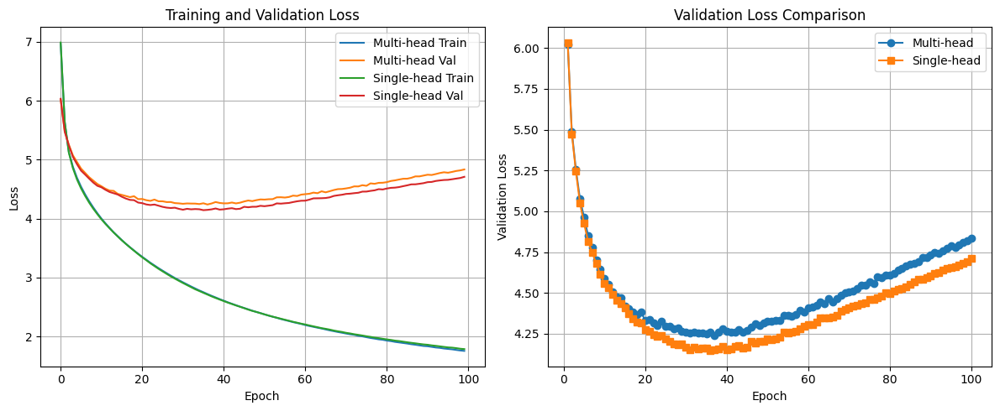

In [ ]:
plt.figure(figsize=(12, 5))

# Loss curves
plt.subplot(1, 2, 1)
plt.plot(train_losses_multi, label='Multi-head Train')
plt.plot(val_losses_multi, label='Multi-head Val')
plt.plot(train_losses_single, label='Single-head Train')
plt.plot(val_losses_single, label='Single-head Val')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)

# Validation loss comparison
plt.subplot(1, 2, 2)
epochs = range(1, N_EPOCHS + 1)
plt.plot(epochs, val_losses_multi, 'o-', label='Multi-head')
plt.plot(epochs, val_losses_single, 's-', label='Single-head')
plt.xlabel('Epoch')
plt.ylabel('Validation Loss')
plt.title('Validation Loss Comparison')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


# Explanation
### Part 1(D) — Multi-head vs Single-head Results

From the loss curves we see that both models are able to train, but their behaviour differs:

- The **single-head model** fits the training data faster and its training loss goes down more sharply.  
- The **multi-head model** learns more slowly, but the gap in validation loss between them is small. Around epoch 30–40, both models reach their best validation point, after which overfitting starts.  
- This suggests that, in our dataset setting, a single head with larger dimension can perform slightly better in terms of validation loss.  

However, multi-head attention is still useful because it can capture diverse attention patterns. When we look at the attention visualizations, the multi-head model shows multiple complementary focus patterns across heads, while the single-head model tends to concentrate on a narrower alignment.



EVALUATION ON TEST SENTENCES

Translation Examples:

1. Source: Ein Mann läuft auf der Straße.
   Multi-head: <sos> A man has been made in the transport of dangerous goods . <eos>
   Single-head: <sos> A man on the roads . <eos>

2. Source: Die Katze sitzt auf dem Tisch.
   Multi-head: <sos> The <unk> has been held on the table . <eos>
   Single-head: <sos> The <unk> was held on the table . <eos>

3. Source: Ich liebe dich.
   Multi-head: <sos> I am <unk> . <eos>
   Single-head: <sos> I am <unk> to be <unk> . <eos>

4. Source: Das Wetter ist heute schön.
   Multi-head: <sos> That is a very good thing . <eos>
   Single-head: <sos> This is a lot of this . <eos>

5. Source: Können Sie mir helfen?
   Multi-head: <sos> Can you help me help ? <eos>
   Single-head: <sos> Can you help me to help you ? <eos>

ATTENTION VISUALIZATION

Visualizing attention for: 'Die Katze sitzt auf dem Tisch.'

### MULTI-HEAD MODEL ###
--- Encoder Self-Attention ---


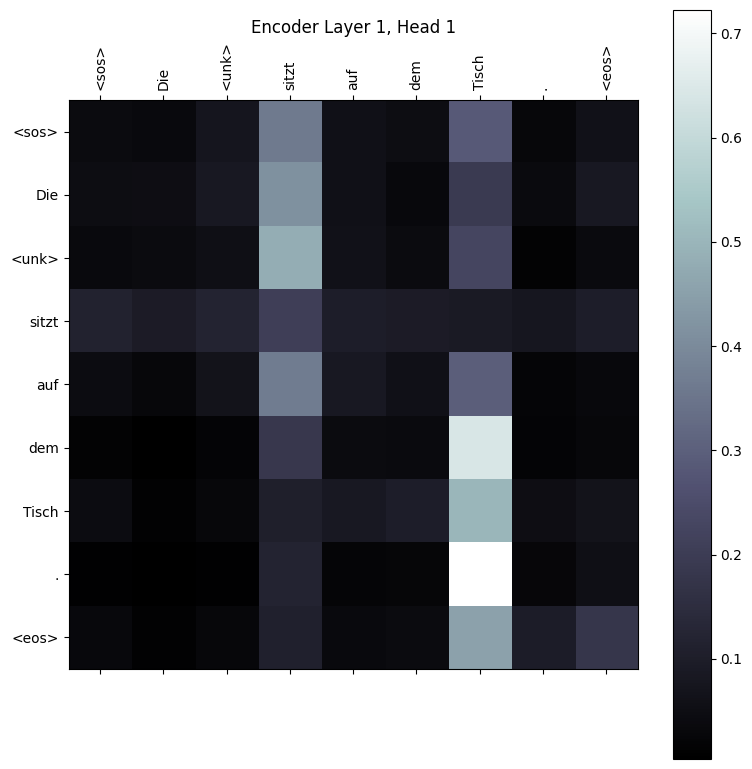

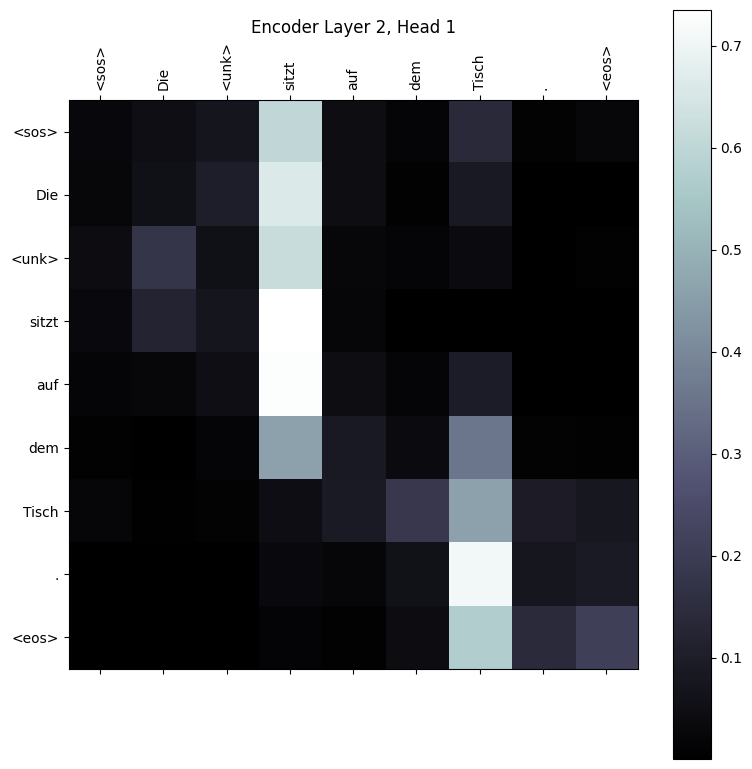

--- Decoder Self-Attention ---


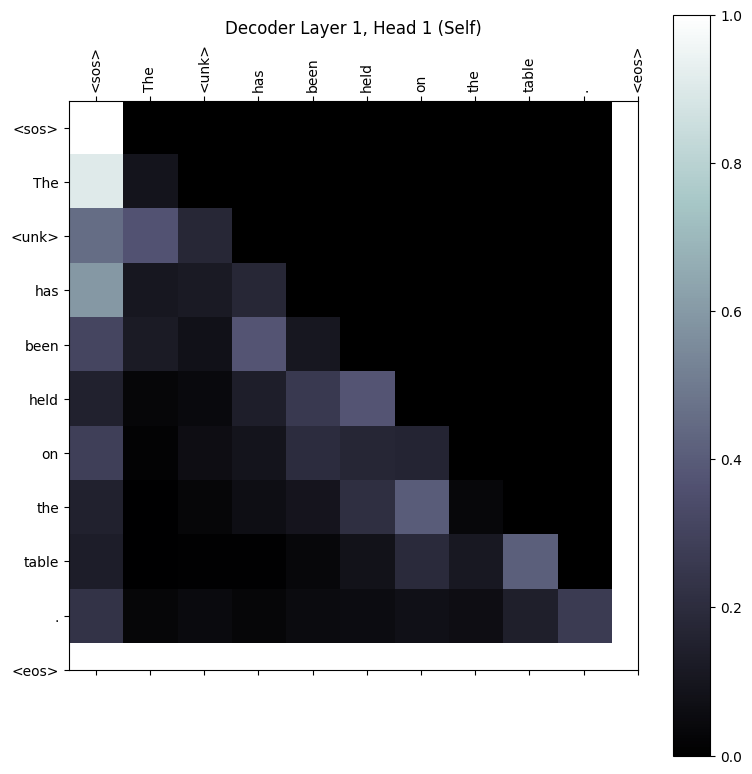

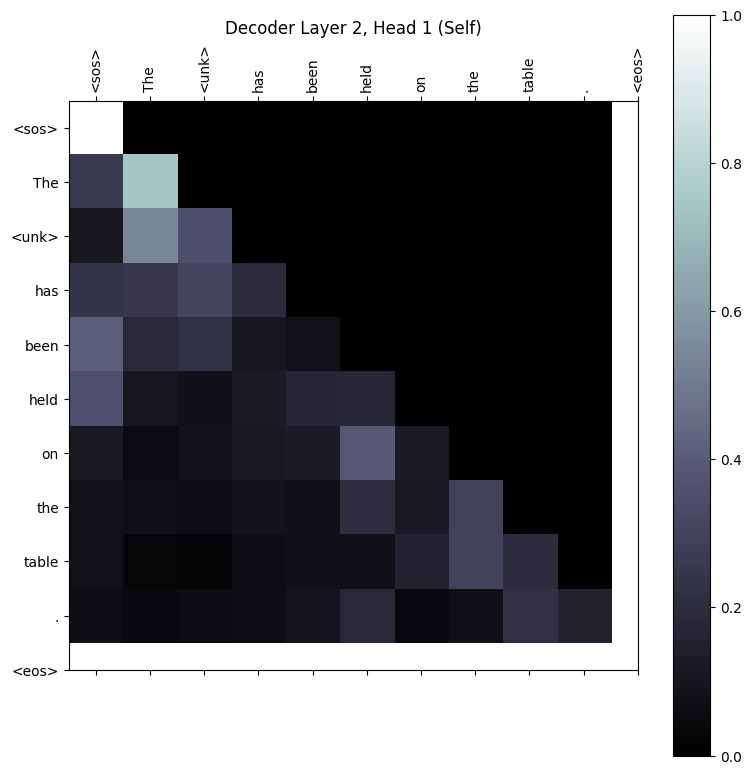

--- Decoder Cross-Attention ---


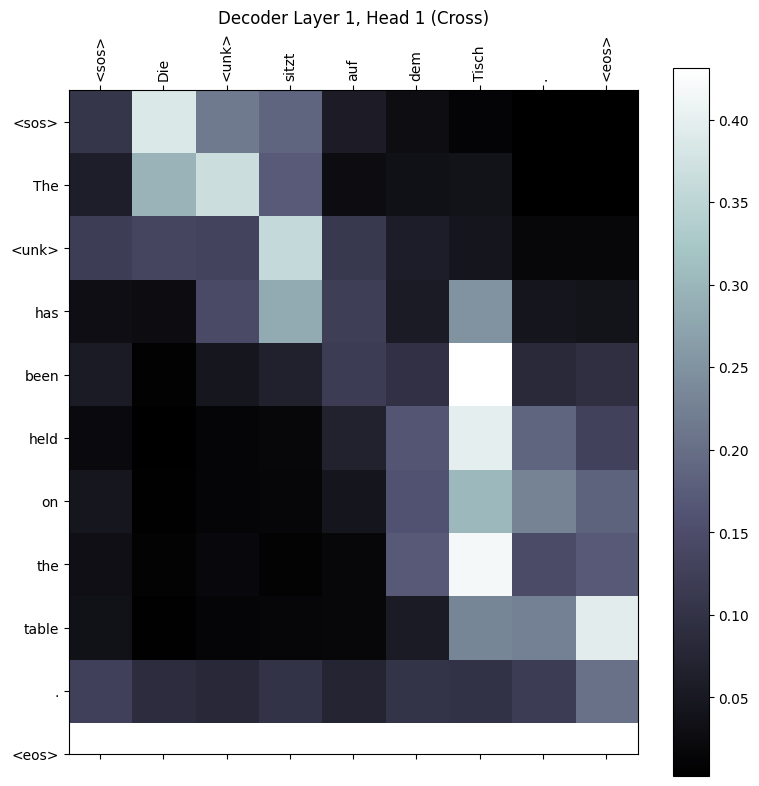

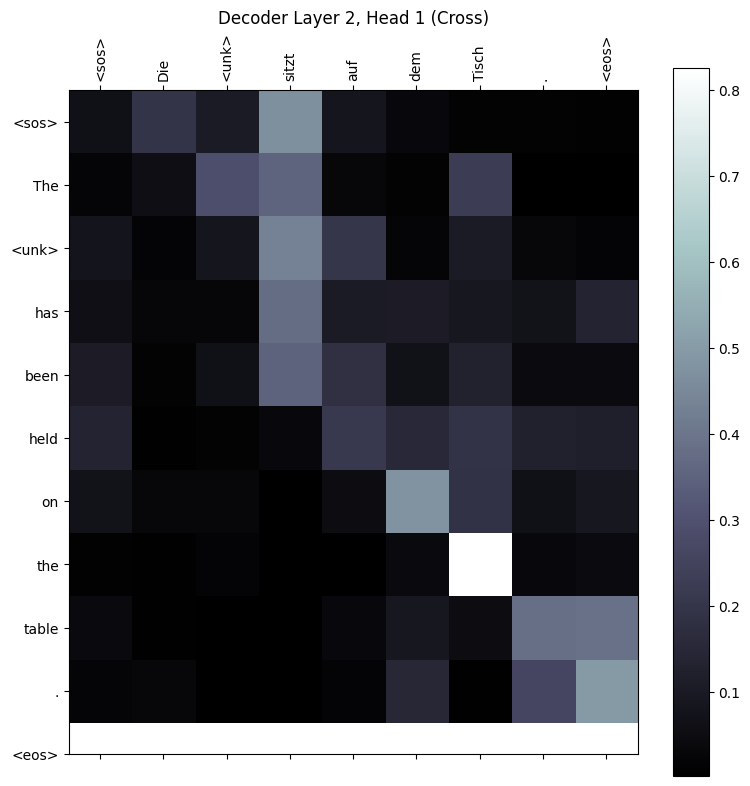


### SINGLE-HEAD MODEL ###
--- Encoder Self-Attention ---


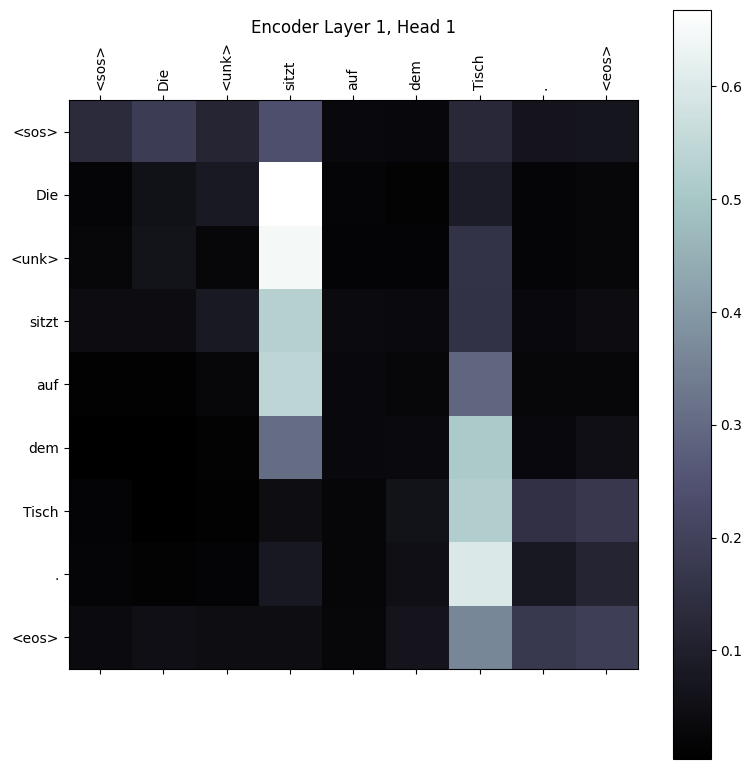

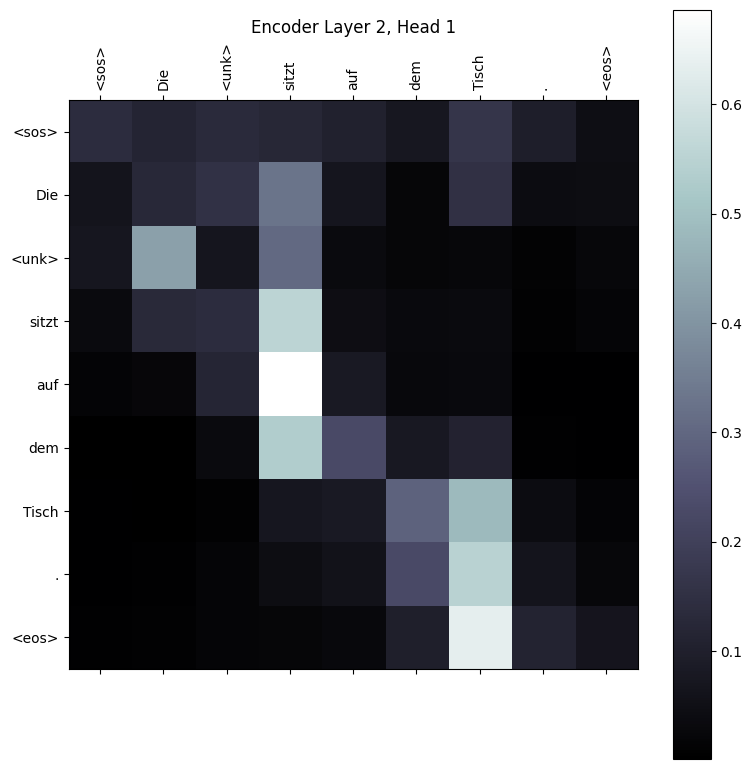

--- Decoder Self-Attention ---


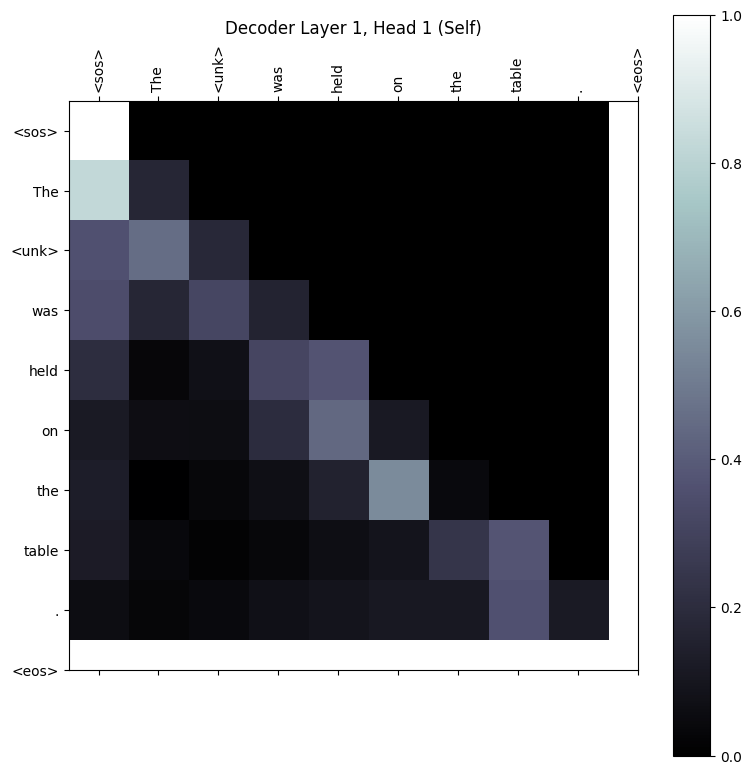

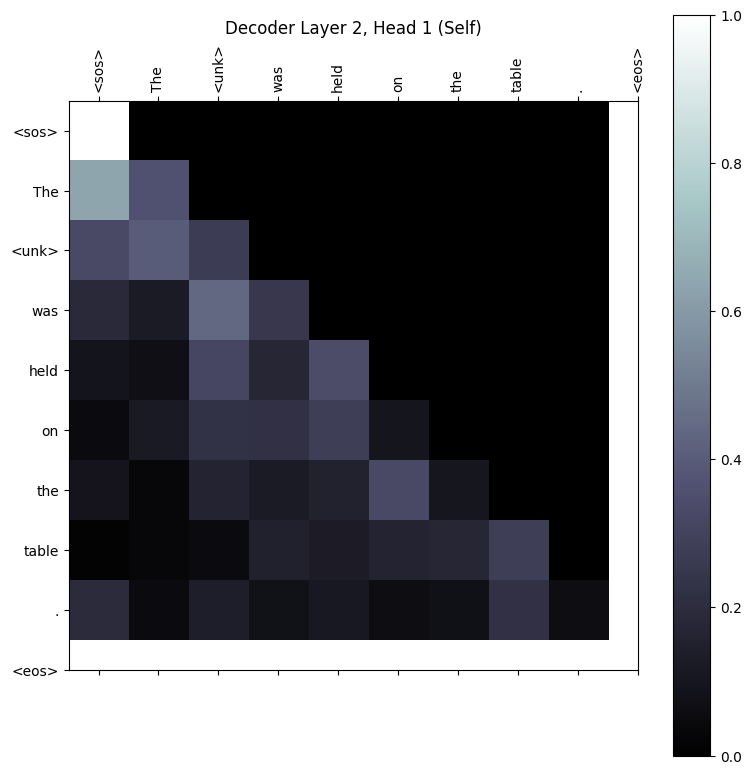

--- Decoder Cross-Attention ---


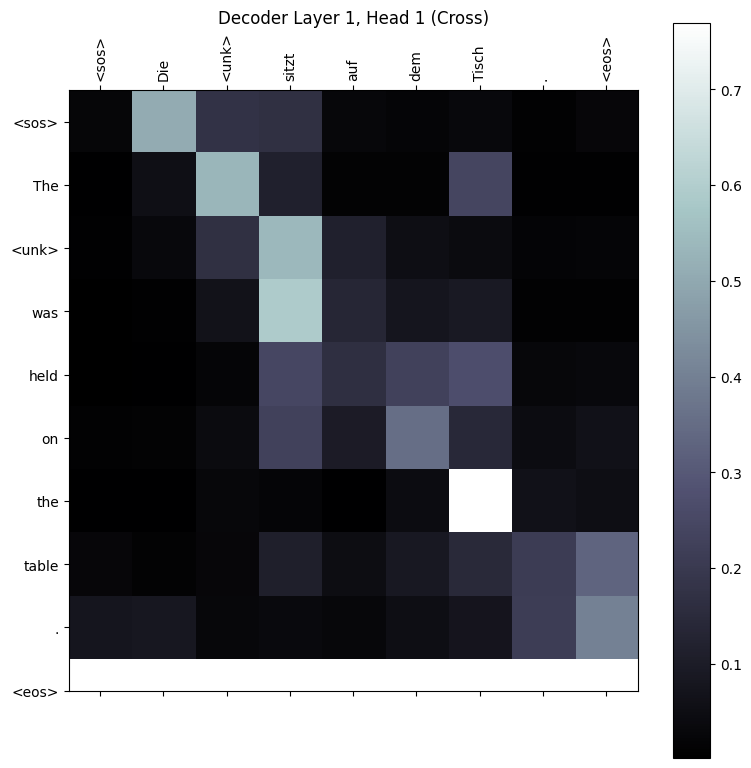

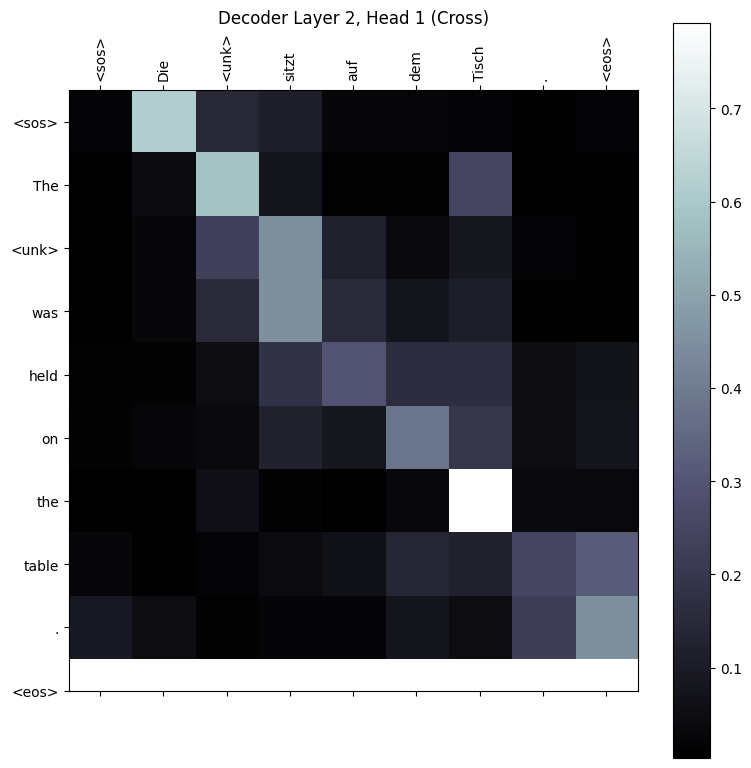


=== COMPARING MULTI-HEAD vs SINGLE-HEAD ATTENTION ===


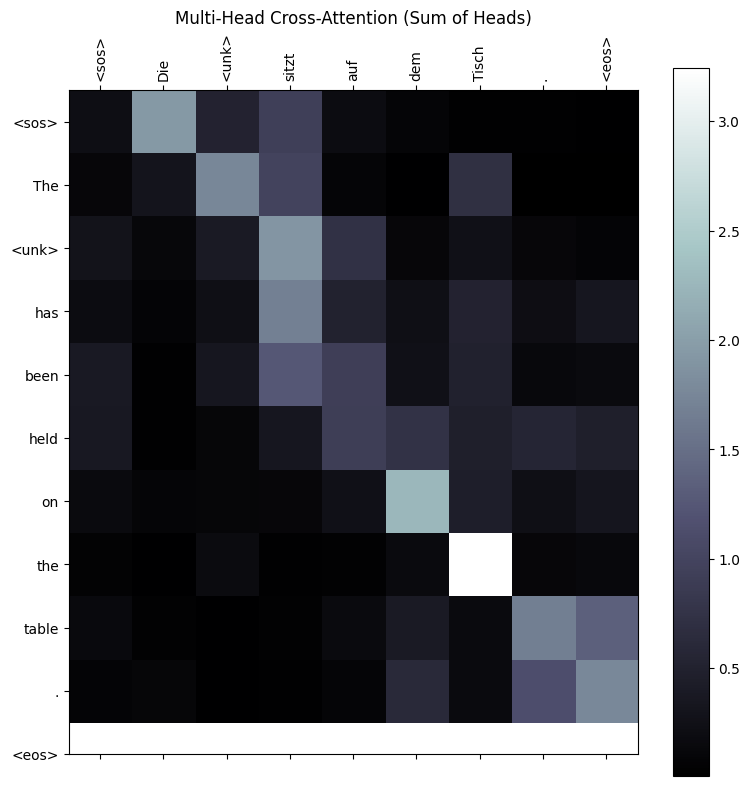

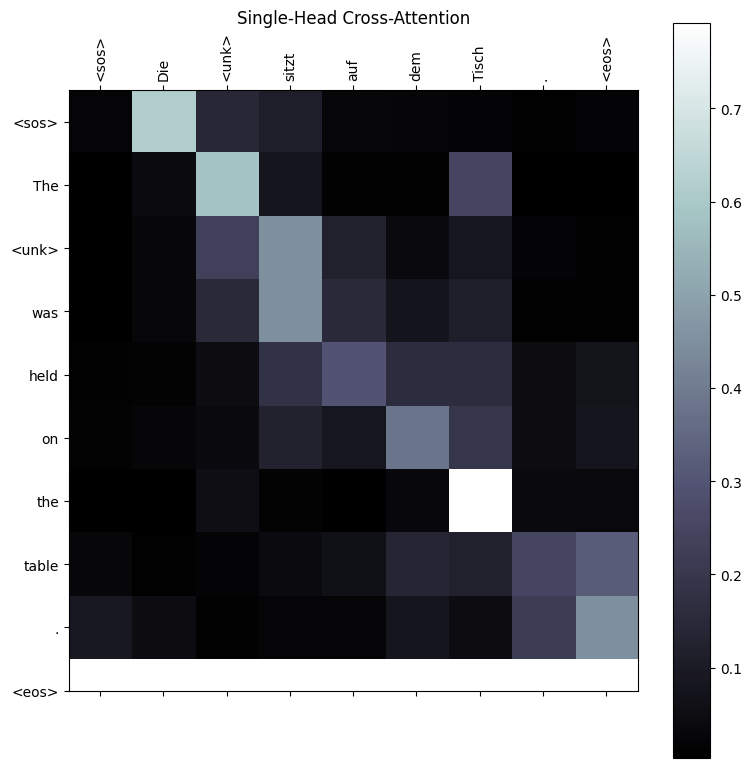

In [ ]:
print("\n" + "="*50)
print("EVALUATION ON TEST SENTENCES")
print("="*50)

# Test sentences
test_sentences = [
    "Ein Mann läuft auf der Straße.",  # A man walks on the street
    "Die Katze sitzt auf dem Tisch.",   # The cat sits on the table
    "Ich liebe dich.",                  # I love you
    "Das Wetter ist heute schön.",      # The weather is nice today
    "Können Sie mir helfen?"            # Can you help me?
]

# Translate with both models
print("\nTranslation Examples:")
for i, src in enumerate(test_sentences):
    print(f"\n{i+1}. Source: {src}")

    trans_multi, _ = translate_sentence(model_multi, src)
    print(f"   Multi-head: {trans_multi}")

    trans_single, _ = translate_sentence(model_single, src)
    print(f"   Single-head: {trans_single}")

# ============================================
# ATTENTION VISUALIZATION FOR TEST SENTENCE
# ============================================

print("\n" + "="*50)
print("ATTENTION VISUALIZATION")
print("="*50)

# Choose a test sentence for detailed visualization
test_sentence = "Die Katze sitzt auf dem Tisch."
print(f"\nVisualizing attention for: '{test_sentence}'")

# Visualize multi-head model attention
print("\n### MULTI-HEAD MODEL ###")
visualize_attention(model_multi, test_sentence)

# Visualize single-head model attention
print("\n### SINGLE-HEAD MODEL ###")
visualize_attention(model_single, test_sentence)

# Compare attention patterns
compare_attention_patterns(model_multi, model_single, test_sentence)


# PART: 2 - Architecture Ablation Study


## PART 2(A)

**Study the Role of Residual Connections**

## Solution 2(A)

In [7]:
src_vocab_size = de_tokenizer.get_vocab_size()
tgt_vocab_size = en_tokenizer.get_vocab_size()

--- Training Model with No Residual Connections ---


Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 28.99it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid

Epoch 01 | Train Loss: 7.038 | Val Loss: 6.239



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 30.52it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 02 | Train Loss: 6.265 | Val Loss: 6.159



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 29.42it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 03 | Train Loss: 6.156 | Val Loss: 6.097



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 30.43it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 04 | Train Loss: 6.021 | Val Loss: 6.062



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 29.15it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 05 | Train Loss: 5.910 | Val Loss: 6.034



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 31.15it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 06 | Train Loss: 5.834 | Val Loss: 6.032



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 30.87it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 07 | Train Loss: 5.787 | Val Loss: 6.020



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 28.12it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 08 | Train Loss: 5.751 | Val Loss: 6.031



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 30.26it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 09 | Train Loss: 5.718 | Val Loss: 5.988



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 28.95it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 10 | Train Loss: 5.691 | Val Loss: 6.005



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 30.58it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 11 | Train Loss: 5.664 | Val Loss: 6.018



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 31.07it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 12 | Train Loss: 5.642 | Val Loss: 6.010



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 31.35it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 13 | Train Loss: 5.621 | Val Loss: 5.992



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 30.45it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 14 | Train Loss: 5.601 | Val Loss: 6.017



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 29.67it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 15 | Train Loss: 5.582 | Val Loss: 5.987



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 30.84it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 16 | Train Loss: 5.564 | Val Loss: 5.980



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 30.39it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 17 | Train Loss: 5.546 | Val Loss: 5.992



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 30.12it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 18 | Train Loss: 5.508 | Val Loss: 5.963



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 30.85it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 19 | Train Loss: 5.472 | Val Loss: 5.980



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 30.85it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 20 | Train Loss: 5.444 | Val Loss: 6.010



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 29.98it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 21 | Train Loss: 5.397 | Val Loss: 6.030



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 29.73it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 22 | Train Loss: 5.291 | Val Loss: 6.150



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 28.99it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 23 | Train Loss: 5.142 | Val Loss: 6.232



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 31.63it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 24 | Train Loss: 5.053 | Val Loss: 6.247



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 30.01it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 25 | Train Loss: 4.988 | Val Loss: 6.286



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 30.88it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 26 | Train Loss: 4.934 | Val Loss: 6.303



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 30.98it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 27 | Train Loss: 4.888 | Val Loss: 6.285



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 30.70it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 28 | Train Loss: 4.841 | Val Loss: 6.309



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 29.14it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 29 | Train Loss: 4.792 | Val Loss: 6.303



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 30.30it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 30 | Train Loss: 4.747 | Val Loss: 6.347



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 28.61it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 31 | Train Loss: 4.708 | Val Loss: 6.320



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 29.62it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 32 | Train Loss: 4.674 | Val Loss: 6.383



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 28.12it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 33 | Train Loss: 4.641 | Val Loss: 6.358



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 30.67it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 34 | Train Loss: 4.612 | Val Loss: 6.378



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 31.06it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 35 | Train Loss: 4.581 | Val Loss: 6.400



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 31.24it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 36 | Train Loss: 4.550 | Val Loss: 6.408



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 30.60it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 37 | Train Loss: 4.520 | Val Loss: 6.442



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 31.04it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 38 | Train Loss: 4.495 | Val Loss: 6.452



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 32.65it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 39 | Train Loss: 4.467 | Val Loss: 6.470



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 28.03it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 40 | Train Loss: 4.441 | Val Loss: 6.454



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 30.26it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 41 | Train Loss: 4.415 | Val Loss: 6.499



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 29.46it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 42 | Train Loss: 4.391 | Val Loss: 6.427



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 30.02it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 43 | Train Loss: 4.368 | Val Loss: 6.480



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 30.37it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 44 | Train Loss: 4.347 | Val Loss: 6.520



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 30.21it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 45 | Train Loss: 4.328 | Val Loss: 6.494



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 29.89it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 46 | Train Loss: 4.308 | Val Loss: 6.547



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 30.00it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 47 | Train Loss: 4.291 | Val Loss: 6.529



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 31.81it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 48 | Train Loss: 4.272 | Val Loss: 6.529



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 30.81it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 49 | Train Loss: 4.255 | Val Loss: 6.563



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 30.96it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 50 | Train Loss: 4.236 | Val Loss: 6.575



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 30.37it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 51 | Train Loss: 4.219 | Val Loss: 6.572



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 28.96it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 52 | Train Loss: 4.203 | Val Loss: 6.570



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 29.29it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 53 | Train Loss: 4.188 | Val Loss: 6.586



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 29.11it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 54 | Train Loss: 4.172 | Val Loss: 6.575



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 29.44it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 55 | Train Loss: 4.158 | Val Loss: 6.606



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 30.21it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 56 | Train Loss: 4.143 | Val Loss: 6.602



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 29.92it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 57 | Train Loss: 4.129 | Val Loss: 6.616



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 30.83it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 58 | Train Loss: 4.116 | Val Loss: 6.627



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 29.96it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 59 | Train Loss: 4.101 | Val Loss: 6.640



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 30.75it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 60 | Train Loss: 4.086 | Val Loss: 6.688



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 29.89it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 61 | Train Loss: 4.073 | Val Loss: 6.632



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 29.77it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 62 | Train Loss: 4.060 | Val Loss: 6.618



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 30.43it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 63 | Train Loss: 4.048 | Val Loss: 6.691



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 30.53it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 64 | Train Loss: 4.034 | Val Loss: 6.683



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 29.24it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 65 | Train Loss: 4.022 | Val Loss: 6.665



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 31.59it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 66 | Train Loss: 4.010 | Val Loss: 6.676



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 30.33it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 67 | Train Loss: 4.000 | Val Loss: 6.676



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 30.43it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 68 | Train Loss: 3.986 | Val Loss: 6.733



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 29.40it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 69 | Train Loss: 3.975 | Val Loss: 6.732



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 31.08it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 70 | Train Loss: 3.965 | Val Loss: 6.725



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 30.40it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 71 | Train Loss: 3.953 | Val Loss: 6.778



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 29.58it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 72 | Train Loss: 3.943 | Val Loss: 6.734



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 30.77it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 73 | Train Loss: 3.933 | Val Loss: 6.752



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 28.32it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 74 | Train Loss: 3.922 | Val Loss: 6.784



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 31.35it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 75 | Train Loss: 3.913 | Val Loss: 6.782



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 29.49it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 76 | Train Loss: 3.903 | Val Loss: 6.787



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 29.94it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 77 | Train Loss: 3.893 | Val Loss: 6.822



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 29.66it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 78 | Train Loss: 3.882 | Val Loss: 6.860



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 29.60it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 79 | Train Loss: 3.875 | Val Loss: 6.834



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 32.13it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 80 | Train Loss: 3.864 | Val Loss: 6.831



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 29.04it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 81 | Train Loss: 3.855 | Val Loss: 6.814



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 29.81it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 82 | Train Loss: 3.845 | Val Loss: 6.890



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 29.65it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 83 | Train Loss: 3.838 | Val Loss: 6.846



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 30.52it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 84 | Train Loss: 3.828 | Val Loss: 6.866



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 30.63it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 85 | Train Loss: 3.820 | Val Loss: 6.910



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 28.08it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 86 | Train Loss: 3.811 | Val Loss: 6.884



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 30.95it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 87 | Train Loss: 3.804 | Val Loss: 6.903



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 29.98it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 88 | Train Loss: 3.796 | Val Loss: 6.915



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 28.49it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 89 | Train Loss: 3.787 | Val Loss: 6.945



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 29.17it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 90 | Train Loss: 3.778 | Val Loss: 6.952



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 29.18it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 91 | Train Loss: 3.772 | Val Loss: 6.956



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 29.37it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 92 | Train Loss: 3.764 | Val Loss: 6.934



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 29.61it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 93 | Train Loss: 3.756 | Val Loss: 6.948



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 31.42it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 94 | Train Loss: 3.749 | Val Loss: 6.958



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 30.45it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 95 | Train Loss: 3.740 | Val Loss: 6.935



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:15<00:00, 30.23it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 96 | Train Loss: 3.733 | Val Loss: 6.982



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 30.55it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 97 | Train Loss: 3.727 | Val Loss: 7.023



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 29.53it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 98 | Train Loss: 3.718 | Val Loss: 7.020



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 29.42it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 99 | Train Loss: 3.714 | Val Loss: 7.007



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 30.91it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 100 | Train Loss: 3.705 | Val Loss: 7.026


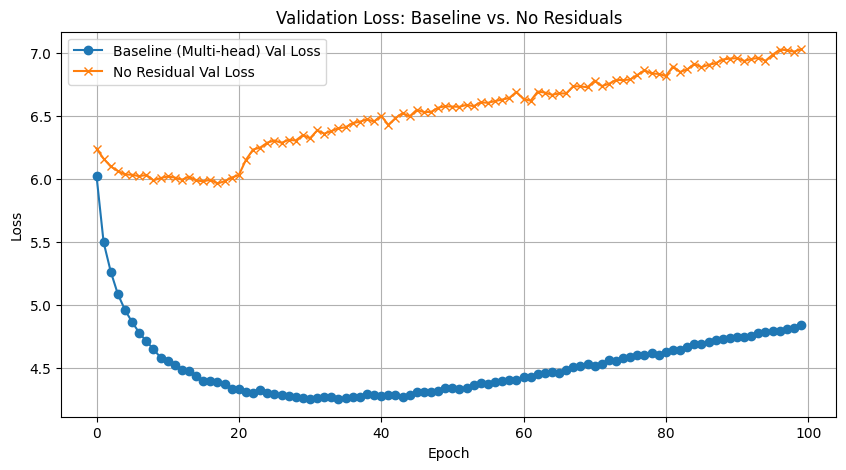

In [ ]:
# =========================================================================================================================
# TODO: ARCHITECTURAL ABLATION STUDIES [YOU MAY CHOOSE DIFFERENT IMPLEMENTATION STRATEGY AS LONG AS YOU IMPLEMENT AS ASKED]
# =========================================================================================================================

# --- Experiment 1: Removing Residual Connections ---

class EncoderLayerNoResidual(EncoderLayer):
    def forward(self, x: torch.Tensor, mask: Optional[torch.Tensor] = None) -> torch.Tensor:

        _x = self.self_attn(x, x, x, mask)
        # 2. Then, pass _x to the normalization layer
        x = self.norm1(self.dropout(_x))

        # 3. Do the same for the feed-forward layer
        _x = self.ff(x)
        x = self.norm2(self.dropout(_x))
        return x

class DecoderLayerNoResidual(DecoderLayer):
    def forward(self, x: torch.Tensor, encoder_output: torch.Tensor, src_mask: Optional[torch.Tensor] = None, tgt_mask: Optional[torch.Tensor] = None) -> torch.Tensor:
        _x = self.self_attn(x, x, x, tgt_mask)
        x = self.norm1(self.dropout(_x))

        # Cross-attention without residual connection
        _x = self.cross_attn(x, encoder_output, encoder_output, src_mask)
        x = self.norm2(self.dropout(_x))

        # Feed-forward without residual connection
        _x = self.ff(x)
        x = self.norm3(self.dropout(_x))
        return x

class EncoderNoResidual(Encoder):
    def __init__(self, n_layers: int, d_model: int, n_heads: int, d_ff: int, dropout: float = 0.1):
        super().__init__(n_layers, d_model, n_heads, d_ff, dropout)
        self.layers = nn.ModuleList([EncoderLayerNoResidual(d_model, n_heads, d_ff, dropout) for _ in range(n_layers)])
        self.norm = nn.LayerNorm(d_model)

class DecoderNoResidual(Decoder):
     def __init__(self, n_layers: int, d_model: int, n_heads: int, d_ff: int, dropout: float = 0.1):
        super().__init__(n_layers, d_model, n_heads, d_ff, dropout)
        self.layers = nn.ModuleList([DecoderLayerNoResidual(d_model, n_heads, d_ff, dropout) for _ in range(n_layers)])
        self.norm = nn.LayerNorm(d_model)

class TransformerNoResidual(TinyTransformer):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        # Replace encoder and decoder with the no-residual versions
        self.encoder = EncoderNoResidual(kwargs['n_layers'], kwargs['d_model'], kwargs['n_heads'], kwargs['d_ff'], kwargs['dropout'])
        self.decoder = DecoderNoResidual(kwargs['n_layers'], kwargs['d_model'], kwargs['n_heads'], kwargs['d_ff'], kwargs['dropout'])
        self._init_parameters()

model_no_residual = TransformerNoResidual(src_vocab_size, tgt_vocab_size, **MODEL_CONFIGS['multi_head']).to(device)
optimizer_no_res = optim.Adam(model_no_residual.parameters(), lr=LEARNING_RATE)
val_losses_no_residual = []

print("--- Training Model with No Residual Connections ---")
for epoch in trange(N_EPOCHS, desc="No Residual Epochs"):
    train_loss = train_epoch(model_no_residual, train_loader, optimizer_no_res, criterion)
    val_loss = evaluate(model_no_residual, val_loader, criterion)
    val_losses_no_residual.append(val_loss)
    print(f"Epoch {epoch+1:02} | Train Loss: {train_loss:.3f} | Val Loss: {val_loss:.3f}")

# Plotting the comparison
plt.figure(figsize=(10, 5))
plt.plot(val_losses_multi, label='Baseline (Multi-head) Val Loss', marker='o')
plt.plot(val_losses_no_residual, label='No Residual Val Loss', marker='x')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Validation Loss: Baseline vs. No Residuals')
plt.legend()
plt.grid(True)
plt.show()

# TODO -- RUN TRAINING

# Explanation
### Part 2(A) — Impact of Removing Residual Connections

The plot compares the validation loss of the baseline Transformer (with residuals) against the version without residuals.

- **Baseline model:** Validation loss decreases steadily and reaches a low value before slightly rising, showing effective training.  
- **No residual model:** Validation loss stays high and even increases over epochs, showing the model is unable to optimize well.  

**Answer:** The model without residual connections does **not** train effectively. Residuals are essential in Transformers to stabilize optimization and allow gradients to flow through deep layers.


## IMPLEMNT **Learnable skip weights** AND TRAIN AGAIN TO OBSERVE THE CHANGES.


--- Training Model with Learnable Skip Connections ---


Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 29.68it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid

Epoch 01 | Val Loss: 6.005 | L1_w1: 0.999 | L1_w2: 0.997



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:16<00:00, 30.02it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 02 | Val Loss: 5.471 | L1_w1: 1.007 | L1_w2: 1.004



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:16<00:00, 30.88it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 03 | Val Loss: 5.263 | L1_w1: 1.015 | L1_w2: 1.012



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:16<00:00, 30.60it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 04 | Val Loss: 5.086 | L1_w1: 1.024 | L1_w2: 1.021



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:16<00:00, 30.47it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 05 | Val Loss: 4.942 | L1_w1: 1.035 | L1_w2: 1.034



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:16<00:00, 30.50it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 06 | Val Loss: 4.859 | L1_w1: 1.047 | L1_w2: 1.050



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:16<00:00, 30.33it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 07 | Val Loss: 4.771 | L1_w1: 1.061 | L1_w2: 1.067



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:15<00:00, 28.36it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 08 | Val Loss: 4.707 | L1_w1: 1.078 | L1_w2: 1.089



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:16<00:00, 30.27it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 09 | Val Loss: 4.642 | L1_w1: 1.095 | L1_w2: 1.110



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 28.76it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 10 | Val Loss: 4.597 | L1_w1: 1.115 | L1_w2: 1.131



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 30.69it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 11 | Val Loss: 4.555 | L1_w1: 1.135 | L1_w2: 1.153



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 28.58it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 12 | Val Loss: 4.520 | L1_w1: 1.155 | L1_w2: 1.175



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:16<00:00, 29.29it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 13 | Val Loss: 4.482 | L1_w1: 1.175 | L1_w2: 1.194



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:16<00:00, 29.75it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 14 | Val Loss: 4.453 | L1_w1: 1.195 | L1_w2: 1.212



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 28.19it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 15 | Val Loss: 4.426 | L1_w1: 1.215 | L1_w2: 1.232



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 28.71it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 16 | Val Loss: 4.410 | L1_w1: 1.233 | L1_w2: 1.253



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 29.95it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 17 | Val Loss: 4.384 | L1_w1: 1.251 | L1_w2: 1.271



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 29.34it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 18 | Val Loss: 4.379 | L1_w1: 1.269 | L1_w2: 1.290



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 28.52it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 19 | Val Loss: 4.357 | L1_w1: 1.289 | L1_w2: 1.310



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:16<00:00, 28.77it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 20 | Val Loss: 4.354 | L1_w1: 1.307 | L1_w2: 1.328



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:16<00:00, 29.15it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 21 | Val Loss: 4.344 | L1_w1: 1.324 | L1_w2: 1.346



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 29.32it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 22 | Val Loss: 4.316 | L1_w1: 1.342 | L1_w2: 1.363



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 28.66it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 23 | Val Loss: 4.310 | L1_w1: 1.358 | L1_w2: 1.381



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:16<00:00, 28.33it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 24 | Val Loss: 4.311 | L1_w1: 1.376 | L1_w2: 1.398



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:16<00:00, 28.78it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 25 | Val Loss: 4.301 | L1_w1: 1.392 | L1_w2: 1.416



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:16<00:00, 29.93it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 26 | Val Loss: 4.279 | L1_w1: 1.408 | L1_w2: 1.433



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:16<00:00, 28.47it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 27 | Val Loss: 4.268 | L1_w1: 1.423 | L1_w2: 1.448



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:16<00:00, 30.65it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 28 | Val Loss: 4.275 | L1_w1: 1.438 | L1_w2: 1.464



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:16<00:00, 29.00it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 29 | Val Loss: 4.279 | L1_w1: 1.455 | L1_w2: 1.479



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:16<00:00, 30.31it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 30 | Val Loss: 4.262 | L1_w1: 1.469 | L1_w2: 1.494



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 30.86it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 31 | Val Loss: 4.250 | L1_w1: 1.485 | L1_w2: 1.510



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:16<00:00, 30.60it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 32 | Val Loss: 4.258 | L1_w1: 1.496 | L1_w2: 1.526



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:16<00:00, 28.21it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 33 | Val Loss: 4.257 | L1_w1: 1.510 | L1_w2: 1.540



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 29.84it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 34 | Val Loss: 4.254 | L1_w1: 1.524 | L1_w2: 1.553



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 29.42it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 35 | Val Loss: 4.258 | L1_w1: 1.536 | L1_w2: 1.568



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:16<00:00, 28.85it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 36 | Val Loss: 4.248 | L1_w1: 1.549 | L1_w2: 1.581



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:16<00:00, 29.60it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 37 | Val Loss: 4.268 | L1_w1: 1.560 | L1_w2: 1.594



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:16<00:00, 29.80it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 38 | Val Loss: 4.250 | L1_w1: 1.572 | L1_w2: 1.607



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 28.78it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 39 | Val Loss: 4.260 | L1_w1: 1.584 | L1_w2: 1.619



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:16<00:00, 29.13it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 40 | Val Loss: 4.275 | L1_w1: 1.595 | L1_w2: 1.630



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:16<00:00, 28.71it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 41 | Val Loss: 4.264 | L1_w1: 1.606 | L1_w2: 1.642



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:16<00:00, 30.39it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 42 | Val Loss: 4.274 | L1_w1: 1.616 | L1_w2: 1.652



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:16<00:00, 27.94it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 43 | Val Loss: 4.271 | L1_w1: 1.624 | L1_w2: 1.664



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 28.20it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 44 | Val Loss: 4.267 | L1_w1: 1.635 | L1_w2: 1.673



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:16<00:00, 30.22it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 45 | Val Loss: 4.277 | L1_w1: 1.644 | L1_w2: 1.684



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 29.62it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 46 | Val Loss: 4.290 | L1_w1: 1.652 | L1_w2: 1.692



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:16<00:00, 30.80it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 47 | Val Loss: 4.294 | L1_w1: 1.662 | L1_w2: 1.700



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:16<00:00, 30.29it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 48 | Val Loss: 4.296 | L1_w1: 1.673 | L1_w2: 1.711



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 29.28it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 49 | Val Loss: 4.331 | L1_w1: 1.680 | L1_w2: 1.717



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 30.12it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 50 | Val Loss: 4.313 | L1_w1: 1.688 | L1_w2: 1.725



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:16<00:00, 27.59it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 51 | Val Loss: 4.313 | L1_w1: 1.697 | L1_w2: 1.734



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:16<00:00, 30.93it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 52 | Val Loss: 4.344 | L1_w1: 1.705 | L1_w2: 1.740



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:16<00:00, 27.72it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 53 | Val Loss: 4.343 | L1_w1: 1.713 | L1_w2: 1.746



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:16<00:00, 31.12it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 54 | Val Loss: 4.349 | L1_w1: 1.720 | L1_w2: 1.750



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 29.16it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 55 | Val Loss: 4.365 | L1_w1: 1.727 | L1_w2: 1.758



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 28.91it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 56 | Val Loss: 4.370 | L1_w1: 1.734 | L1_w2: 1.764



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:16<00:00, 31.23it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 57 | Val Loss: 4.377 | L1_w1: 1.740 | L1_w2: 1.770



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:16<00:00, 27.87it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 58 | Val Loss: 4.395 | L1_w1: 1.746 | L1_w2: 1.775



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 28.93it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 59 | Val Loss: 4.389 | L1_w1: 1.752 | L1_w2: 1.780



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:16<00:00, 29.69it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 60 | Val Loss: 4.405 | L1_w1: 1.760 | L1_w2: 1.784



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:16<00:00, 28.35it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 61 | Val Loss: 4.426 | L1_w1: 1.764 | L1_w2: 1.789



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 29.51it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 62 | Val Loss: 4.416 | L1_w1: 1.770 | L1_w2: 1.793



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:15<00:00, 30.11it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 63 | Val Loss: 4.437 | L1_w1: 1.777 | L1_w2: 1.794



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 29.79it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 64 | Val Loss: 4.461 | L1_w1: 1.783 | L1_w2: 1.800



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:16<00:00, 30.43it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 65 | Val Loss: 4.444 | L1_w1: 1.789 | L1_w2: 1.806



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 29.61it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 66 | Val Loss: 4.457 | L1_w1: 1.794 | L1_w2: 1.808



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:16<00:00, 29.17it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 67 | Val Loss: 4.471 | L1_w1: 1.800 | L1_w2: 1.811



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:16<00:00, 30.26it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 68 | Val Loss: 4.482 | L1_w1: 1.804 | L1_w2: 1.816



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 29.71it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 69 | Val Loss: 4.504 | L1_w1: 1.810 | L1_w2: 1.820



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:16<00:00, 29.46it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 70 | Val Loss: 4.494 | L1_w1: 1.815 | L1_w2: 1.822



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 30.38it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 71 | Val Loss: 4.523 | L1_w1: 1.821 | L1_w2: 1.825



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:16<00:00, 29.70it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 72 | Val Loss: 4.525 | L1_w1: 1.825 | L1_w2: 1.828



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:16<00:00, 28.77it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 73 | Val Loss: 4.535 | L1_w1: 1.830 | L1_w2: 1.831



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:16<00:00, 28.17it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 74 | Val Loss: 4.546 | L1_w1: 1.836 | L1_w2: 1.833



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 28.73it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 75 | Val Loss: 4.556 | L1_w1: 1.841 | L1_w2: 1.835



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:16<00:00, 29.66it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 76 | Val Loss: 4.585 | L1_w1: 1.847 | L1_w2: 1.835



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:16<00:00, 28.05it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 77 | Val Loss: 4.588 | L1_w1: 1.851 | L1_w2: 1.838



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 28.23it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 78 | Val Loss: 4.580 | L1_w1: 1.855 | L1_w2: 1.842



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:16<00:00, 28.32it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 79 | Val Loss: 4.607 | L1_w1: 1.859 | L1_w2: 1.844



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:16<00:00, 29.14it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 80 | Val Loss: 4.603 | L1_w1: 1.864 | L1_w2: 1.848



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:15<00:00, 29.40it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 81 | Val Loss: 4.633 | L1_w1: 1.869 | L1_w2: 1.848



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:16<00:00, 29.18it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 82 | Val Loss: 4.639 | L1_w1: 1.873 | L1_w2: 1.849



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 29.79it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 83 | Val Loss: 4.648 | L1_w1: 1.877 | L1_w2: 1.853



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 28.70it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 84 | Val Loss: 4.666 | L1_w1: 1.882 | L1_w2: 1.852



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:16<00:00, 28.93it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 85 | Val Loss: 4.679 | L1_w1: 1.887 | L1_w2: 1.853



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 30.34it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 86 | Val Loss: 4.673 | L1_w1: 1.891 | L1_w2: 1.853



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:16<00:00, 30.66it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 87 | Val Loss: 4.692 | L1_w1: 1.893 | L1_w2: 1.855



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:16<00:00, 30.62it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 88 | Val Loss: 4.691 | L1_w1: 1.896 | L1_w2: 1.855



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:16<00:00, 28.54it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 89 | Val Loss: 4.710 | L1_w1: 1.900 | L1_w2: 1.853



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:16<00:00, 29.33it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 90 | Val Loss: 4.722 | L1_w1: 1.904 | L1_w2: 1.855



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 29.73it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 91 | Val Loss: 4.747 | L1_w1: 1.909 | L1_w2: 1.855



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 468/469 [00:16<00:00, 28.50it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 92 | Val Loss: 4.741 | L1_w1: 1.913 | L1_w2: 1.856



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:16<00:00, 30.24it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 93 | Val Loss: 4.759 | L1_w1: 1.917 | L1_w2: 1.857



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:16<00:00, 30.59it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 94 | Val Loss: 4.766 | L1_w1: 1.920 | L1_w2: 1.856



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:16<00:00, 28.49it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 95 | Val Loss: 4.766 | L1_w1: 1.925 | L1_w2: 1.858



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:16<00:00, 28.63it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 96 | Val Loss: 4.792 | L1_w1: 1.927 | L1_w2: 1.859



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|██████████| 469/469 [00:16<00:00, 31.69it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 97 | Val Loss: 4.819 | L1_w1: 1.931 | L1_w2: 1.858



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training:  99%|█████████▉| 466/469 [00:16<00:00, 27.93it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 98 | Val Loss: 4.805 | L1_w1: 1.933 | L1_w2: 1.858



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:16<00:00, 29.82it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 99 | Val Loss: 4.828 | L1_w1: 1.937 | L1_w2: 1.858



Training:   0%|          | 0/469 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)

Training: 100%|█████████▉| 467/469 [00:16<00:00, 29.15it/s]
                                                           
Evaluating:   0%|          | 0/47 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoi

Epoch 100 | Val Loss: 4.830 | L1_w1: 1.941 | L1_w2: 1.857


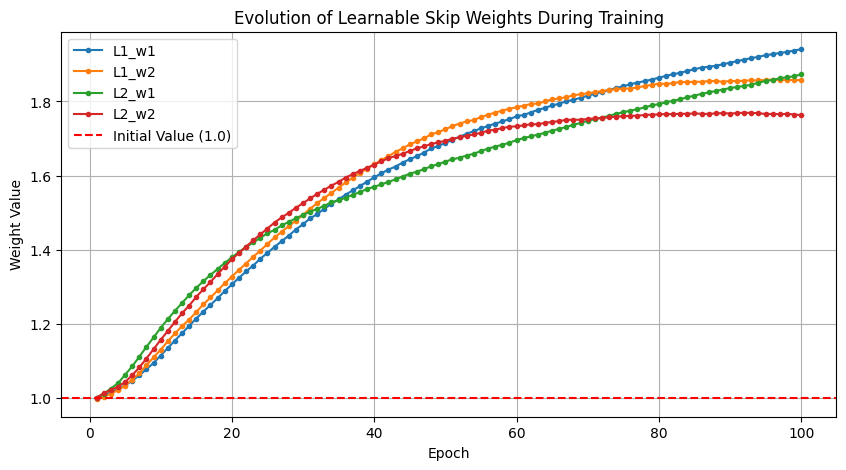

In [ ]:
# --- Experiment 2: IMPLEMENT LEARNABLE SKIP WEIGHTS ---


# TODO: WRITE THE CODE SIMILIARLY

class EncoderLayerLearnableSkip(EncoderLayer):
    def __init__(self, d_model: int, n_heads: int, d_ff: int, dropout: float = 0.1):
        super().__init__(d_model, n_heads, d_ff, dropout)
        # Learnable parameters for each skip connection
        self.w1 = nn.Parameter(torch.tensor(1.0))
        self.w2 = nn.Parameter(torch.tensor(1.0))

    def forward(self, x: torch.Tensor, mask: Optional[torch.Tensor] = None) -> torch.Tensor:
        _x = self.self_attn(x, x, x, mask)
        x = self.norm1(self.w1 * x + self.dropout(_x)) # Apply learnable weight
        _x = self.ff(x)
        x = self.norm2(self.w2 * x + self.dropout(_x)) # Apply learnable weight
        return x

class EncoderLearnableSkip(Encoder):
    def __init__(self, n_layers: int, d_model: int, n_heads: int, d_ff: int, dropout: float = 0.1):
        super(Encoder, self).__init__()
        self.layers = nn.ModuleList([EncoderLayerLearnableSkip(d_model, n_heads, d_ff, dropout) for _ in range(n_layers)])
        self.norm = nn.LayerNorm(d_model)

class TransformerLearnableSkip(TinyTransformer):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        # For simplicity, only modifying the encoder as requested by the pattern
        self.encoder = EncoderLearnableSkip(kwargs['n_layers'], kwargs['d_model'], kwargs['n_heads'], kwargs['d_ff'], kwargs['dropout'])
        self._init_parameters()

# INITIALIZE AND TRAIN THE MODEL
model_learnable_skip = TransformerLearnableSkip(src_vocab_size, tgt_vocab_size, **MODEL_CONFIGS['multi_head']).to(device)
optimizer_ls = optim.Adam(model_learnable_skip.parameters(), lr=LEARNING_RATE)
val_losses_ls = []
# Dictionary to store the history of weights
weight_history = {f'L{i+1}_w{j+1}': [] for i in range(MODEL_CONFIGS['multi_head']['n_layers']) for j in range(2)}

print("\n--- Training Model with Learnable Skip Connections ---")
for epoch in trange(N_EPOCHS, desc="Learnable Skip Epochs"):
    _ = train_epoch(model_learnable_skip, train_loader, optimizer_ls, criterion)
    val_loss = evaluate(model_learnable_skip, val_loader, criterion)
    val_losses_ls.append(val_loss)

    # Record weights at the end of each epoch
    for i, layer in enumerate(model_learnable_skip.encoder.layers):
        weight_history[f'L{i+1}_w1'].append(layer.w1.item())
        weight_history[f'L{i+1}_w2'].append(layer.w2.item())
    print(f"Epoch {epoch+1:02} | Val Loss: {val_loss:.3f} | L1_w1: {weight_history['L1_w1'][-1]:.3f} | L1_w2: {weight_history['L1_w2'][-1]:.3f}")

# Plotting the evolution of the weights
plt.figure(figsize=(10, 5))
for name, values in weight_history.items():
    plt.plot(range(1, N_EPOCHS + 1), values, label=name, marker='.')
plt.xlabel('Epoch')
plt.ylabel('Weight Value')
plt.title('Evolution of Learnable Skip Weights During Training')
plt.axhline(y=1.0, color='r', linestyle='--', label='Initial Value (1.0)')
plt.legend()
plt.grid(True)
plt.show()


# Explanation
### Part 2(A) — Learnable Skip Weights

In this experiment, each residual connection was modified to have a learnable scalar weight `w`, initialized at 1.0.  
The plot shows how these weights evolved during training:

- All weights **increased above 1.0** as training progressed, stabilizing between ~1.7 and ~1.9.  
- This means the model actually **strengthened the skip (identity) path** rather than down-weighting it.  
- No layer showed a consistent reduction of the residual weight below 1.0.  

**Answer:** The model did **not** down-weight the residual path. Instead, it relied heavily on residual connections by increasing their weight, confirming their importance in stabilizing and improving learning.


## IMPLEMNT **Long-Range Skip Connections** AND TRAIN AGAIN TO OBSERVE THE CHANGES.


--- Training Model with Long-Range Skip Connections ---


Training: 100%|██████████| 469/469 [00:23<00:00, 21.45it/s]
                                                           
Long-Range Skip Epochs:   1%|          | 1/100 [00:24<40:42, 24.67s/it]

Epoch 01 | Train Loss: 6.973 | Val Loss: 5.987



Training: 100%|██████████| 469/469 [00:22<00:00, 22.21it/s]
                                                           
Long-Range Skip Epochs:   2%|▏         | 2/100 [00:48<39:47, 24.36s/it]

Epoch 02 | Train Loss: 5.612 | Val Loss: 5.476



Training: 100%|██████████| 469/469 [00:22<00:00, 20.30it/s]
                                                           
Long-Range Skip Epochs:   3%|▎         | 3/100 [01:12<39:08, 24.21s/it]

Epoch 03 | Train Loss: 5.114 | Val Loss: 5.255



Training: 100%|█████████▉| 468/469 [00:23<00:00, 18.14it/s]
                                                           
Long-Range Skip Epochs:   4%|▍         | 4/100 [01:37<39:03, 24.41s/it]

Epoch 04 | Train Loss: 4.865 | Val Loss: 5.074



Training: 100%|█████████▉| 467/469 [00:22<00:00, 18.37it/s]
                                                           
Long-Range Skip Epochs:   5%|▌         | 5/100 [02:02<38:50, 24.53s/it]

Epoch 05 | Train Loss: 4.682 | Val Loss: 4.928



Training: 100%|██████████| 469/469 [00:22<00:00, 20.57it/s]
                                                           
Long-Range Skip Epochs:   6%|▌         | 6/100 [02:26<38:25, 24.53s/it]

Epoch 06 | Train Loss: 4.533 | Val Loss: 4.836



Training: 100%|█████████▉| 467/469 [00:23<00:00, 22.25it/s]
                                                           
Long-Range Skip Epochs:   7%|▋         | 7/100 [02:51<38:02, 24.54s/it]

Epoch 07 | Train Loss: 4.406 | Val Loss: 4.765



Training: 100%|█████████▉| 467/469 [00:23<00:00, 21.61it/s]
                                                           
Long-Range Skip Epochs:   8%|▊         | 8/100 [03:15<37:35, 24.51s/it]

Epoch 08 | Train Loss: 4.292 | Val Loss: 4.706



Training: 100%|█████████▉| 468/469 [00:23<00:00, 20.84it/s]
                                                           
Long-Range Skip Epochs:   9%|▉         | 9/100 [03:40<37:17, 24.59s/it]

Epoch 09 | Train Loss: 4.189 | Val Loss: 4.641



Training: 100%|██████████| 469/469 [00:23<00:00, 21.65it/s]
                                                           
Long-Range Skip Epochs:  10%|█         | 10/100 [04:05<36:56, 24.63s/it]

Epoch 10 | Train Loss: 4.094 | Val Loss: 4.603



Training: 100%|██████████| 469/469 [00:23<00:00, 21.53it/s]
                                                           
Long-Range Skip Epochs:  11%|█         | 11/100 [04:30<36:37, 24.69s/it]

Epoch 11 | Train Loss: 4.006 | Val Loss: 4.563



Training: 100%|█████████▉| 468/469 [00:23<00:00, 21.20it/s]
                                                           
Long-Range Skip Epochs:  12%|█▏        | 12/100 [04:54<36:15, 24.72s/it]

Epoch 12 | Train Loss: 3.925 | Val Loss: 4.503



Training: 100%|█████████▉| 468/469 [00:23<00:00, 20.69it/s]
                                                           
Long-Range Skip Epochs:  13%|█▎        | 13/100 [05:19<35:50, 24.71s/it]

Epoch 13 | Train Loss: 3.847 | Val Loss: 4.495



Training: 100%|█████████▉| 467/469 [00:23<00:00, 20.11it/s]
                                                           
Long-Range Skip Epochs:  14%|█▍        | 14/100 [05:44<35:31, 24.78s/it]

Epoch 14 | Train Loss: 3.776 | Val Loss: 4.460



Training: 100%|██████████| 469/469 [00:23<00:00, 22.15it/s]
                                                           
Long-Range Skip Epochs:  15%|█▌        | 15/100 [06:09<35:13, 24.87s/it]

Epoch 15 | Train Loss: 3.709 | Val Loss: 4.441



Training: 100%|█████████▉| 468/469 [00:23<00:00, 19.33it/s]
                                                           
Long-Range Skip Epochs:  16%|█▌        | 16/100 [06:34<34:54, 24.94s/it]

Epoch 16 | Train Loss: 3.645 | Val Loss: 4.424



Training: 100%|█████████▉| 468/469 [00:23<00:00, 17.17it/s]
                                                           
Long-Range Skip Epochs:  17%|█▋        | 17/100 [06:59<34:29, 24.93s/it]

Epoch 17 | Train Loss: 3.584 | Val Loss: 4.409



Training: 100%|█████████▉| 467/469 [00:23<00:00, 17.78it/s]
                                                           
Long-Range Skip Epochs:  18%|█▊        | 18/100 [07:24<34:13, 25.04s/it]

Epoch 18 | Train Loss: 3.526 | Val Loss: 4.377



Training: 100%|██████████| 469/469 [00:23<00:00, 19.43it/s]
                                                           
Long-Range Skip Epochs:  19%|█▉        | 19/100 [07:50<33:53, 25.11s/it]

Epoch 19 | Train Loss: 3.471 | Val Loss: 4.351



Training: 100%|██████████| 469/469 [00:23<00:00, 21.24it/s]
                                                           
Long-Range Skip Epochs:  20%|██        | 20/100 [08:15<33:29, 25.12s/it]

Epoch 20 | Train Loss: 3.416 | Val Loss: 4.344



Training: 100%|█████████▉| 467/469 [00:23<00:00, 21.38it/s]
                                                           
Long-Range Skip Epochs:  21%|██        | 21/100 [08:40<33:03, 25.10s/it]

Epoch 21 | Train Loss: 3.363 | Val Loss: 4.331



Training: 100%|█████████▉| 467/469 [00:23<00:00, 21.39it/s]
                                                           
Long-Range Skip Epochs:  22%|██▏       | 22/100 [09:05<32:40, 25.14s/it]

Epoch 22 | Train Loss: 3.314 | Val Loss: 4.314



Training: 100%|██████████| 469/469 [00:23<00:00, 21.29it/s]
                                                           
Long-Range Skip Epochs:  23%|██▎       | 23/100 [09:30<32:16, 25.15s/it]

Epoch 23 | Train Loss: 3.265 | Val Loss: 4.304



Training: 100%|██████████| 469/469 [00:24<00:00, 21.83it/s]
                                                           
Long-Range Skip Epochs:  24%|██▍       | 24/100 [09:56<31:57, 25.23s/it]

Epoch 24 | Train Loss: 3.219 | Val Loss: 4.302



Training: 100%|██████████| 469/469 [00:24<00:00, 21.29it/s]
                                                           
Long-Range Skip Epochs:  25%|██▌       | 25/100 [10:21<31:36, 25.29s/it]

Epoch 25 | Train Loss: 3.174 | Val Loss: 4.286



Training: 100%|█████████▉| 468/469 [00:24<00:00, 21.05it/s]
                                                           
Long-Range Skip Epochs:  26%|██▌       | 26/100 [10:47<31:17, 25.37s/it]

Epoch 26 | Train Loss: 3.132 | Val Loss: 4.277



Training: 100%|█████████▉| 468/469 [00:24<00:00, 21.51it/s]
                                                           
Long-Range Skip Epochs:  27%|██▋       | 27/100 [11:12<30:55, 25.41s/it]

Epoch 27 | Train Loss: 3.089 | Val Loss: 4.279



Training: 100%|██████████| 469/469 [00:24<00:00, 21.82it/s]
                                                           
Long-Range Skip Epochs:  28%|██▊       | 28/100 [11:38<30:30, 25.43s/it]

Epoch 28 | Train Loss: 3.050 | Val Loss: 4.262



Training: 100%|██████████| 469/469 [00:24<00:00, 21.21it/s]
                                                           
Long-Range Skip Epochs:  29%|██▉       | 29/100 [12:03<30:09, 25.48s/it]

Epoch 29 | Train Loss: 3.008 | Val Loss: 4.261



Training: 100%|█████████▉| 468/469 [00:24<00:00, 21.03it/s]
                                                           
Long-Range Skip Epochs:  30%|███       | 30/100 [12:29<29:46, 25.53s/it]

Epoch 30 | Train Loss: 2.972 | Val Loss: 4.266



Training: 100%|█████████▉| 467/469 [00:24<00:00, 19.72it/s]
                                                           
Long-Range Skip Epochs:  31%|███       | 31/100 [12:55<29:25, 25.58s/it]

Epoch 31 | Train Loss: 2.935 | Val Loss: 4.264



Training: 100%|█████████▉| 467/469 [00:24<00:00, 20.82it/s]
                                                           
Long-Range Skip Epochs:  32%|███▏      | 32/100 [13:20<29:01, 25.60s/it]

Epoch 32 | Train Loss: 2.901 | Val Loss: 4.253



Training: 100%|█████████▉| 468/469 [00:24<00:00, 19.72it/s]
                                                           
Long-Range Skip Epochs:  33%|███▎      | 33/100 [13:46<28:37, 25.64s/it]

Epoch 33 | Train Loss: 2.864 | Val Loss: 4.247



Training: 100%|█████████▉| 468/469 [00:24<00:00, 17.66it/s]
                                                           
Long-Range Skip Epochs:  34%|███▍      | 34/100 [14:12<28:17, 25.71s/it]

Epoch 34 | Train Loss: 2.831 | Val Loss: 4.269



Training: 100%|█████████▉| 468/469 [00:23<00:00, 17.43it/s]
                                                           
Long-Range Skip Epochs:  35%|███▌      | 35/100 [14:38<27:53, 25.74s/it]

Epoch 35 | Train Loss: 2.799 | Val Loss: 4.257



Training: 100%|█████████▉| 468/469 [00:23<00:00, 18.72it/s]
                                                           
Long-Range Skip Epochs:  36%|███▌      | 36/100 [15:04<27:28, 25.76s/it]

Epoch 36 | Train Loss: 2.767 | Val Loss: 4.254



Training: 100%|█████████▉| 467/469 [00:24<00:00, 18.68it/s]
                                                           
Long-Range Skip Epochs:  37%|███▋      | 37/100 [15:30<27:09, 25.86s/it]

Epoch 37 | Train Loss: 2.737 | Val Loss: 4.252



Training: 100%|█████████▉| 467/469 [00:24<00:00, 19.86it/s]
                                                           
Long-Range Skip Epochs:  38%|███▊      | 38/100 [15:56<26:44, 25.88s/it]

Epoch 38 | Train Loss: 2.707 | Val Loss: 4.261



Training: 100%|█████████▉| 467/469 [00:24<00:00, 21.36it/s]
                                                           
Long-Range Skip Epochs:  39%|███▉      | 39/100 [16:21<26:19, 25.89s/it]

Epoch 39 | Train Loss: 2.678 | Val Loss: 4.270



Training: 100%|██████████| 469/469 [00:24<00:00, 21.24it/s]
                                                           
Long-Range Skip Epochs:  40%|████      | 40/100 [16:47<25:54, 25.90s/it]

Epoch 40 | Train Loss: 2.652 | Val Loss: 4.268



Training: 100%|██████████| 469/469 [00:24<00:00, 22.13it/s]
                                                           
Long-Range Skip Epochs:  41%|████      | 41/100 [17:14<25:31, 25.97s/it]

Epoch 41 | Train Loss: 2.625 | Val Loss: 4.265



Training: 100%|█████████▉| 467/469 [00:24<00:00, 21.37it/s]
                                                           
Long-Range Skip Epochs:  42%|████▏     | 42/100 [17:40<25:07, 25.99s/it]

Epoch 42 | Train Loss: 2.598 | Val Loss: 4.271



Training: 100%|█████████▉| 467/469 [00:24<00:00, 19.69it/s]
                                                           
Long-Range Skip Epochs:  43%|████▎     | 43/100 [18:06<24:45, 26.07s/it]

Epoch 43 | Train Loss: 2.573 | Val Loss: 4.272



Training: 100%|██████████| 469/469 [00:24<00:00, 20.91it/s]
                                                           
Long-Range Skip Epochs:  44%|████▍     | 44/100 [18:32<24:22, 26.11s/it]

Epoch 44 | Train Loss: 2.548 | Val Loss: 4.274



Training: 100%|█████████▉| 468/469 [00:24<00:00, 19.58it/s]
                                                           
Long-Range Skip Epochs:  45%|████▌     | 45/100 [18:58<24:00, 26.20s/it]

Epoch 45 | Train Loss: 2.525 | Val Loss: 4.286



Training: 100%|█████████▉| 467/469 [00:24<00:00, 19.62it/s]
                                                           
Long-Range Skip Epochs:  46%|████▌     | 46/100 [19:25<23:37, 26.25s/it]

Epoch 46 | Train Loss: 2.500 | Val Loss: 4.288



Training: 100%|█████████▉| 468/469 [00:25<00:00, 21.14it/s]
                                                           
Long-Range Skip Epochs:  47%|████▋     | 47/100 [19:51<23:14, 26.32s/it]

Epoch 47 | Train Loss: 2.478 | Val Loss: 4.304



Training: 100%|█████████▉| 468/469 [00:24<00:00, 20.66it/s]
                                                           
Long-Range Skip Epochs:  48%|████▊     | 48/100 [20:18<22:49, 26.33s/it]

Epoch 48 | Train Loss: 2.454 | Val Loss: 4.293



Training: 100%|██████████| 469/469 [00:25<00:00, 20.67it/s]
                                                           
Long-Range Skip Epochs:  49%|████▉     | 49/100 [20:44<22:28, 26.44s/it]

Epoch 49 | Train Loss: 2.434 | Val Loss: 4.307



Training: 100%|█████████▉| 468/469 [00:25<00:00, 20.29it/s]
                                                           
Long-Range Skip Epochs:  50%|█████     | 50/100 [21:11<22:04, 26.49s/it]

Epoch 50 | Train Loss: 2.414 | Val Loss: 4.318



Training: 100%|█████████▉| 467/469 [00:25<00:00, 19.74it/s]
                                                           
Long-Range Skip Epochs:  51%|█████     | 51/100 [21:38<21:44, 26.63s/it]

Epoch 51 | Train Loss: 2.391 | Val Loss: 4.312



Training: 100%|█████████▉| 467/469 [00:25<00:00, 15.72it/s]
                                                           
Long-Range Skip Epochs:  52%|█████▏    | 52/100 [22:05<21:19, 26.65s/it]

Epoch 52 | Train Loss: 2.372 | Val Loss: 4.332



Training: 100%|█████████▉| 468/469 [00:25<00:00, 18.04it/s]
                                                           
Long-Range Skip Epochs:  53%|█████▎    | 53/100 [22:32<20:56, 26.74s/it]

Epoch 53 | Train Loss: 2.352 | Val Loss: 4.334



Training: 100%|█████████▉| 467/469 [00:25<00:00, 17.00it/s]
                                                           
Long-Range Skip Epochs:  54%|█████▍    | 54/100 [22:59<20:37, 26.89s/it]

Epoch 54 | Train Loss: 2.334 | Val Loss: 4.354



Training: 100%|█████████▉| 467/469 [00:25<00:00, 15.64it/s]
                                                           
Long-Range Skip Epochs:  55%|█████▌    | 55/100 [23:26<20:16, 27.02s/it]

Epoch 55 | Train Loss: 2.313 | Val Loss: 4.350



Training: 100%|█████████▉| 468/469 [00:24<00:00, 16.75it/s]
                                                           
Long-Range Skip Epochs:  56%|█████▌    | 56/100 [23:53<19:48, 27.00s/it]

Epoch 56 | Train Loss: 2.296 | Val Loss: 4.374



Training: 100%|█████████▉| 468/469 [00:25<00:00, 19.37it/s]
                                                           
Long-Range Skip Epochs:  57%|█████▋    | 57/100 [24:20<19:25, 27.10s/it]

Epoch 57 | Train Loss: 2.278 | Val Loss: 4.381



Training: 100%|██████████| 469/469 [00:24<00:00, 20.75it/s]
                                                           
Long-Range Skip Epochs:  58%|█████▊    | 58/100 [24:47<18:56, 27.05s/it]

Epoch 58 | Train Loss: 2.259 | Val Loss: 4.375



Training:  99%|█████████▉| 466/469 [00:25<00:00, 18.42it/s]
                                                           
Long-Range Skip Epochs:  59%|█████▉    | 59/100 [25:14<18:29, 27.05s/it]

Epoch 59 | Train Loss: 2.244 | Val Loss: 4.389



Training: 100%|██████████| 469/469 [00:25<00:00, 20.02it/s]
                                                           
Long-Range Skip Epochs:  60%|██████    | 60/100 [25:42<18:03, 27.09s/it]

Epoch 60 | Train Loss: 2.226 | Val Loss: 4.387



Training: 100%|█████████▉| 468/469 [00:25<00:00, 20.59it/s]
                                                           
Long-Range Skip Epochs:  61%|██████    | 61/100 [26:09<17:39, 27.16s/it]

Epoch 61 | Train Loss: 2.208 | Val Loss: 4.405



Training: 100%|██████████| 469/469 [00:25<00:00, 21.02it/s]
                                                           
Long-Range Skip Epochs:  62%|██████▏   | 62/100 [26:36<17:15, 27.26s/it]

Epoch 62 | Train Loss: 2.194 | Val Loss: 4.423



Training: 100%|█████████▉| 468/469 [00:26<00:00, 20.42it/s]
                                                           
Long-Range Skip Epochs:  63%|██████▎   | 63/100 [27:04<16:51, 27.35s/it]

Epoch 63 | Train Loss: 2.178 | Val Loss: 4.432



Training: 100%|█████████▉| 468/469 [00:25<00:00, 20.01it/s]
                                                           
Long-Range Skip Epochs:  64%|██████▍   | 64/100 [27:31<16:23, 27.31s/it]

Epoch 64 | Train Loss: 2.164 | Val Loss: 4.427



Training: 100%|██████████| 469/469 [00:25<00:00, 21.12it/s]
                                                           
Long-Range Skip Epochs:  65%|██████▌   | 65/100 [27:59<15:58, 27.39s/it]

Epoch 65 | Train Loss: 2.148 | Val Loss: 4.443



Training: 100%|██████████| 469/469 [00:25<00:00, 21.12it/s]
                                                           
Long-Range Skip Epochs:  66%|██████▌   | 66/100 [28:26<15:31, 27.40s/it]

Epoch 66 | Train Loss: 2.132 | Val Loss: 4.455



Training: 100%|██████████| 469/469 [00:26<00:00, 20.96it/s]
                                                           
Long-Range Skip Epochs:  67%|██████▋   | 67/100 [28:54<15:09, 27.56s/it]

Epoch 67 | Train Loss: 2.118 | Val Loss: 4.459



Training: 100%|█████████▉| 468/469 [00:26<00:00, 19.53it/s]
                                                           
Long-Range Skip Epochs:  68%|██████▊   | 68/100 [29:22<14:45, 27.69s/it]

Epoch 68 | Train Loss: 2.106 | Val Loss: 4.490



Training: 100%|█████████▉| 468/469 [00:26<00:00, 20.05it/s]
                                                           
Long-Range Skip Epochs:  69%|██████▉   | 69/100 [29:50<14:22, 27.81s/it]

Epoch 69 | Train Loss: 2.092 | Val Loss: 4.489



Training: 100%|█████████▉| 468/469 [00:26<00:00, 19.67it/s]
                                                           
Long-Range Skip Epochs:  70%|███████   | 70/100 [30:18<13:53, 27.79s/it]

Epoch 70 | Train Loss: 2.078 | Val Loss: 4.491



Training: 100%|█████████▉| 468/469 [00:26<00:00, 18.97it/s]
                                                           
Long-Range Skip Epochs:  71%|███████   | 71/100 [30:46<13:24, 27.75s/it]

Epoch 71 | Train Loss: 2.063 | Val Loss: 4.504



Training: 100%|██████████| 469/469 [00:26<00:00, 20.77it/s]
                                                           
Long-Range Skip Epochs:  72%|███████▏  | 72/100 [31:14<13:01, 27.90s/it]

Epoch 72 | Train Loss: 2.050 | Val Loss: 4.509



Training: 100%|█████████▉| 468/469 [00:26<00:00, 18.89it/s]
                                                           
Long-Range Skip Epochs:  73%|███████▎  | 73/100 [31:42<12:37, 28.06s/it]

Epoch 73 | Train Loss: 2.039 | Val Loss: 4.531



Training: 100%|█████████▉| 467/469 [00:26<00:00, 16.39it/s]
                                                           
Long-Range Skip Epochs:  74%|███████▍  | 74/100 [32:10<12:10, 28.11s/it]

Epoch 74 | Train Loss: 2.026 | Val Loss: 4.538



Training: 100%|█████████▉| 468/469 [00:26<00:00, 18.62it/s]
                                                           
Long-Range Skip Epochs:  75%|███████▌  | 75/100 [32:39<11:44, 28.16s/it]

Epoch 75 | Train Loss: 2.014 | Val Loss: 4.559



Training: 100%|█████████▉| 468/469 [00:26<00:00, 18.17it/s]
                                                           
Long-Range Skip Epochs:  76%|███████▌  | 76/100 [33:07<11:15, 28.16s/it]

Epoch 76 | Train Loss: 2.000 | Val Loss: 4.550



Training: 100%|█████████▉| 468/469 [00:26<00:00, 16.55it/s]
                                                           
Long-Range Skip Epochs:  77%|███████▋  | 77/100 [33:35<10:48, 28.19s/it]

Epoch 77 | Train Loss: 1.990 | Val Loss: 4.571



Training: 100%|█████████▉| 468/469 [00:26<00:00, 17.05it/s]
                                                           
Long-Range Skip Epochs:  78%|███████▊  | 78/100 [34:04<10:21, 28.24s/it]

Epoch 78 | Train Loss: 1.978 | Val Loss: 4.576



Training: 100%|██████████| 469/469 [00:26<00:00, 18.76it/s]
                                                           
Long-Range Skip Epochs:  79%|███████▉  | 79/100 [34:32<09:55, 28.38s/it]

Epoch 79 | Train Loss: 1.968 | Val Loss: 4.600



Training: 100%|█████████▉| 468/469 [00:26<00:00, 17.11it/s]
                                                           
Long-Range Skip Epochs:  80%|████████  | 80/100 [35:01<09:28, 28.42s/it]

Epoch 80 | Train Loss: 1.955 | Val Loss: 4.596



Training: 100%|██████████| 469/469 [00:26<00:00, 17.95it/s]
                                                           
Long-Range Skip Epochs:  81%|████████  | 81/100 [35:30<09:02, 28.53s/it]

Epoch 81 | Train Loss: 1.945 | Val Loss: 4.616



Training: 100%|█████████▉| 468/469 [00:27<00:00, 17.39it/s]
                                                           
Long-Range Skip Epochs:  82%|████████▏ | 82/100 [35:58<08:35, 28.65s/it]

Epoch 82 | Train Loss: 1.934 | Val Loss: 4.627



Training: 100%|█████████▉| 468/469 [00:27<00:00, 18.03it/s]
                                                           
Long-Range Skip Epochs:  83%|████████▎ | 83/100 [36:27<08:07, 28.70s/it]

Epoch 83 | Train Loss: 1.921 | Val Loss: 4.632



Training: 100%|█████████▉| 468/469 [00:27<00:00, 19.97it/s]
                                                           
Long-Range Skip Epochs:  84%|████████▍ | 84/100 [36:56<07:40, 28.79s/it]

Epoch 84 | Train Loss: 1.912 | Val Loss: 4.631



Training: 100%|█████████▉| 467/469 [00:27<00:00, 17.22it/s]
                                                           
Long-Range Skip Epochs:  85%|████████▌ | 85/100 [37:25<07:12, 28.81s/it]

Epoch 85 | Train Loss: 1.901 | Val Loss: 4.655



Training: 100%|█████████▉| 468/469 [00:26<00:00, 18.34it/s]
                                                           
Long-Range Skip Epochs:  86%|████████▌ | 86/100 [37:54<06:42, 28.75s/it]

Epoch 86 | Train Loss: 1.890 | Val Loss: 4.670



Training: 100%|█████████▉| 468/469 [00:27<00:00, 18.60it/s]
                                                           
Long-Range Skip Epochs:  87%|████████▋ | 87/100 [38:23<06:16, 28.96s/it]

Epoch 87 | Train Loss: 1.882 | Val Loss: 4.688



Training: 100%|█████████▉| 468/469 [00:27<00:00, 19.54it/s]
                                                           
Long-Range Skip Epochs:  88%|████████▊ | 88/100 [38:52<05:47, 28.94s/it]

Epoch 88 | Train Loss: 1.870 | Val Loss: 4.680



Training: 100%|██████████| 469/469 [00:27<00:00, 20.77it/s]
                                                           
Long-Range Skip Epochs:  89%|████████▉ | 89/100 [39:21<05:18, 28.94s/it]

Epoch 89 | Train Loss: 1.862 | Val Loss: 4.691



Training: 100%|██████████| 469/469 [00:27<00:00, 19.48it/s]
                                                           
Long-Range Skip Epochs:  90%|█████████ | 90/100 [39:50<04:50, 29.08s/it]

Epoch 90 | Train Loss: 1.855 | Val Loss: 4.713



Training: 100%|██████████| 469/469 [00:27<00:00, 20.94it/s]
                                                           
Long-Range Skip Epochs:  91%|█████████ | 91/100 [40:20<04:22, 29.19s/it]

Epoch 91 | Train Loss: 1.844 | Val Loss: 4.736



Training: 100%|█████████▉| 468/469 [00:27<00:00, 19.34it/s]
                                                           
Long-Range Skip Epochs:  92%|█████████▏| 92/100 [40:50<03:54, 29.36s/it]

Epoch 92 | Train Loss: 1.834 | Val Loss: 4.731



Training: 100%|█████████▉| 468/469 [00:28<00:00, 18.93it/s]
                                                           
Long-Range Skip Epochs:  93%|█████████▎| 93/100 [41:20<03:26, 29.53s/it]

Epoch 93 | Train Loss: 1.825 | Val Loss: 4.741



Training: 100%|█████████▉| 468/469 [00:27<00:00, 19.25it/s]
                                                           
Long-Range Skip Epochs:  94%|█████████▍| 94/100 [41:49<02:57, 29.65s/it]

Epoch 94 | Train Loss: 1.818 | Val Loss: 4.765



Training: 100%|█████████▉| 468/469 [00:27<00:00, 18.61it/s]
                                                           
Long-Range Skip Epochs:  95%|█████████▌| 95/100 [42:19<02:28, 29.63s/it]

Epoch 95 | Train Loss: 1.807 | Val Loss: 4.769



Training: 100%|█████████▉| 468/469 [00:27<00:00, 17.95it/s]
                                                           
Long-Range Skip Epochs:  96%|█████████▌| 96/100 [42:49<01:58, 29.61s/it]

Epoch 96 | Train Loss: 1.800 | Val Loss: 4.763



Training: 100%|█████████▉| 468/469 [00:28<00:00, 16.19it/s]
                                                           
Long-Range Skip Epochs:  97%|█████████▋| 97/100 [43:19<01:29, 29.82s/it]

Epoch 97 | Train Loss: 1.791 | Val Loss: 4.804



Training: 100%|█████████▉| 467/469 [00:27<00:00, 18.28it/s]
                                                           
Long-Range Skip Epochs:  98%|█████████▊| 98/100 [43:49<00:59, 29.86s/it]

Epoch 98 | Train Loss: 1.784 | Val Loss: 4.793



Training: 100%|█████████▉| 468/469 [00:27<00:00, 18.25it/s]
                                                           
Long-Range Skip Epochs:  99%|█████████▉| 99/100 [44:19<00:29, 29.86s/it]

Epoch 99 | Train Loss: 1.773 | Val Loss: 4.820



Training: 100%|█████████▉| 467/469 [00:28<00:00, 18.16it/s]
                                                           
Long-Range Skip Epochs: 100%|██████████| 100/100 [44:49<00:00, 26.90s/it]


Epoch 100 | Train Loss: 1.767 | Val Loss: 4.825


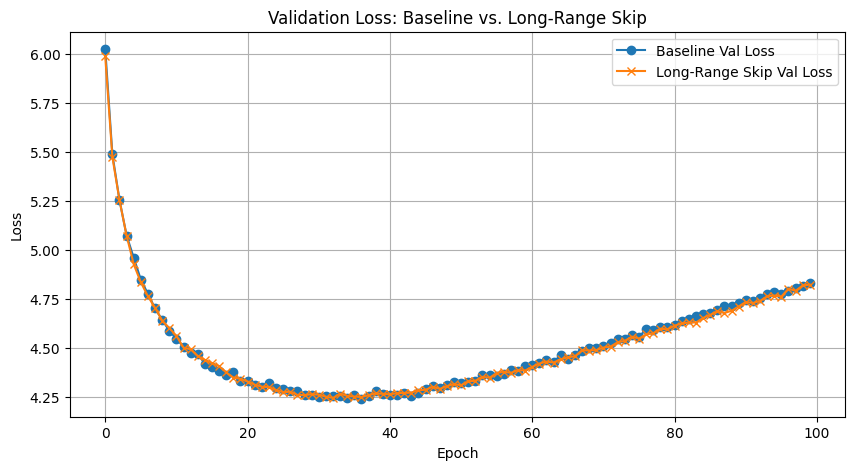

In [ ]:
# --- Experiment 3: IMPLEMENT LONG RANGE SKIP CONNECTION ---


# TODO: WRITE THE CODE SIMILIARLY

class EncoderLongRangeSkip(Encoder):
    def forward(self, x: torch.Tensor, mask: Optional[torch.Tensor] = None) -> torch.Tensor:
        outputs = []
        current_input = x

        for i, layer in enumerate(self.layers):
            layer_output = layer(current_input, mask)
            outputs.append(layer_output)

            # The input to the next layer is the sum of the last two outputs
            if i > 0:
                current_input = outputs[i] + outputs[i-1]
            else:
                current_input = outputs[i]

        # The final output is the output of the last layer
        return self.norm(outputs[-1])

class TransformerLongRangeSkip(TinyTransformer):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        # Only modifying the encoder for this experiment
        self.encoder = EncoderLongRangeSkip(kwargs['n_layers'], kwargs['d_model'], kwargs['n_heads'], kwargs['d_ff'], kwargs['dropout'])
        self._init_parameters()

# INITIALIZE AND TRAIN THE MODEL
model_long_range = TransformerLongRangeSkip(src_vocab_size, tgt_vocab_size, **MODEL_CONFIGS['multi_head']).to(device)
optimizer_lr = optim.Adam(model_long_range.parameters(), lr=LEARNING_RATE)
val_losses_lr = []

print("\n--- Training Model with Long-Range Skip Connections ---")
for epoch in trange(N_EPOCHS, desc="Long-Range Skip Epochs"):
    train_loss = train_epoch(model_long_range, train_loader, optimizer_lr, criterion)
    val_loss = evaluate(model_long_range, val_loader, criterion)
    val_losses_lr.append(val_loss)
    print(f"Epoch {epoch+1:02} | Train Loss: {train_loss:.3f} | Val Loss: {val_loss:.3f}")

# Plotting the comparison
plt.figure(figsize=(10, 5))
plt.plot(val_losses_multi, label='Baseline Val Loss', marker='o')
plt.plot(val_losses_lr, label='Long-Range Skip Val Loss', marker='x')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Validation Loss: Baseline vs. Long-Range Skip')
plt.legend()
plt.grid(True)
plt.show()


# Explanation - 2A - 3
The model still learns effectively. And there is no such significant difference in losses at each epoch, as shown in the graph.

## PART 2(B)

**Study the Role of Feed-Forward Layers**

- Answer the questions as asked in the Assignemnt.

## Solution 2(B)

1. Parameter Reduction after removing FFNs: 0.00%

--- Training Model with No Feed-Forward Networks ---


Training: 100%|██████████| 469/469 [00:18<00:00, 23.96it/s]
                                                           
No FFN Epochs:   1%|          | 1/100 [00:20<34:08, 20.69s/it]

Epoch 01 | Val Loss: 6.081



Training: 100%|██████████| 469/469 [00:19<00:00, 26.41it/s]
                                                           
No FFN Epochs:   2%|▏         | 2/100 [00:40<33:17, 20.38s/it]

Epoch 02 | Val Loss: 5.518



Training: 100%|█████████▉| 467/469 [00:19<00:00, 26.60it/s]
                                                           
No FFN Epochs:   3%|▎         | 3/100 [01:01<33:24, 20.66s/it]

Epoch 03 | Val Loss: 5.274



Training: 100%|█████████▉| 467/469 [00:19<00:00, 25.45it/s]
                                                           
No FFN Epochs:   4%|▍         | 4/100 [01:22<33:02, 20.65s/it]

Epoch 04 | Val Loss: 5.098



Training: 100%|██████████| 469/469 [00:19<00:00, 26.60it/s]
                                                           
No FFN Epochs:   5%|▌         | 5/100 [01:43<32:52, 20.76s/it]

Epoch 05 | Val Loss: 4.951



Training: 100%|█████████▉| 468/469 [00:19<00:00, 25.73it/s]
                                                           
No FFN Epochs:   6%|▌         | 6/100 [02:04<32:45, 20.91s/it]

Epoch 06 | Val Loss: 4.834



Training: 100%|█████████▉| 467/469 [00:19<00:00, 25.30it/s]
                                                           
No FFN Epochs:   7%|▋         | 7/100 [02:25<32:27, 20.94s/it]

Epoch 07 | Val Loss: 4.756



Training: 100%|█████████▉| 467/469 [00:19<00:00, 24.59it/s]
                                                           
No FFN Epochs:   8%|▊         | 8/100 [02:46<32:14, 21.03s/it]

Epoch 08 | Val Loss: 4.685



Training: 100%|██████████| 469/469 [00:20<00:00, 24.89it/s]
                                                           
No FFN Epochs:   9%|▉         | 9/100 [03:08<32:01, 21.12s/it]

Epoch 09 | Val Loss: 4.624



Training: 100%|█████████▉| 467/469 [00:19<00:00, 24.95it/s]
                                                           
No FFN Epochs:  10%|█         | 10/100 [03:28<31:26, 20.96s/it]

Epoch 10 | Val Loss: 4.576



Training: 100%|██████████| 469/469 [00:20<00:00, 26.98it/s]
                                                           
No FFN Epochs:  11%|█         | 11/100 [03:50<31:21, 21.14s/it]

Epoch 11 | Val Loss: 4.533



Training: 100%|█████████▉| 467/469 [00:20<00:00, 20.30it/s]
                                                           
No FFN Epochs:  12%|█▏        | 12/100 [04:11<31:10, 21.26s/it]

Epoch 12 | Val Loss: 4.510



Training: 100%|█████████▉| 468/469 [00:19<00:00, 24.62it/s]
                                                           
No FFN Epochs:  13%|█▎        | 13/100 [04:32<30:43, 21.19s/it]

Epoch 13 | Val Loss: 4.486



Training: 100%|█████████▉| 467/469 [00:20<00:00, 23.92it/s]
                                                           
No FFN Epochs:  14%|█▍        | 14/100 [04:54<30:35, 21.34s/it]

Epoch 14 | Val Loss: 4.474



Training: 100%|█████████▉| 468/469 [00:20<00:00, 19.79it/s]
                                                           
No FFN Epochs:  15%|█▌        | 15/100 [05:16<30:23, 21.45s/it]

Epoch 15 | Val Loss: 4.445



Training: 100%|██████████| 469/469 [00:19<00:00, 25.45it/s]
                                                           
No FFN Epochs:  16%|█▌        | 16/100 [05:37<29:50, 21.32s/it]

Epoch 16 | Val Loss: 4.429



Training: 100%|██████████| 469/469 [00:20<00:00, 26.24it/s]
                                                           
No FFN Epochs:  17%|█▋        | 17/100 [05:59<29:40, 21.45s/it]

Epoch 17 | Val Loss: 4.411



Training: 100%|██████████| 469/469 [00:20<00:00, 21.62it/s]
                                                           
No FFN Epochs:  18%|█▊        | 18/100 [06:20<29:26, 21.55s/it]

Epoch 18 | Val Loss: 4.401



Training: 100%|█████████▉| 467/469 [00:19<00:00, 24.02it/s]
                                                           
No FFN Epochs:  19%|█▉        | 19/100 [06:42<28:56, 21.44s/it]

Epoch 19 | Val Loss: 4.387



Training: 100%|██████████| 469/469 [00:20<00:00, 25.67it/s]
                                                           
No FFN Epochs:  20%|██        | 20/100 [07:03<28:46, 21.59s/it]

Epoch 20 | Val Loss: 4.380



Training: 100%|█████████▉| 468/469 [00:20<00:00, 20.09it/s]
                                                           
No FFN Epochs:  21%|██        | 21/100 [07:25<28:32, 21.67s/it]

Epoch 21 | Val Loss: 4.376



Training: 100%|█████████▉| 467/469 [00:20<00:00, 25.49it/s]
                                                           
No FFN Epochs:  22%|██▏       | 22/100 [07:47<28:05, 21.60s/it]

Epoch 22 | Val Loss: 4.353



Training: 100%|██████████| 469/469 [00:20<00:00, 25.18it/s]
                                                           
No FFN Epochs:  23%|██▎       | 23/100 [08:09<27:57, 21.79s/it]

Epoch 23 | Val Loss: 4.366



Training: 100%|██████████| 469/469 [00:20<00:00, 20.74it/s]
                                                           
No FFN Epochs:  24%|██▍       | 24/100 [08:31<27:43, 21.88s/it]

Epoch 24 | Val Loss: 4.367



Training: 100%|██████████| 469/469 [00:20<00:00, 24.25it/s]
                                                           
No FFN Epochs:  25%|██▌       | 25/100 [08:52<27:07, 21.70s/it]

Epoch 25 | Val Loss: 4.346



Training: 100%|█████████▉| 468/469 [00:20<00:00, 25.83it/s]
                                                           
No FFN Epochs:  26%|██▌       | 26/100 [09:14<26:53, 21.81s/it]

Epoch 26 | Val Loss: 4.351



Training: 100%|█████████▉| 467/469 [00:20<00:00, 19.76it/s]
                                                           
No FFN Epochs:  27%|██▋       | 27/100 [09:37<26:45, 21.99s/it]

Epoch 27 | Val Loss: 4.336



Training:  99%|█████████▉| 466/469 [00:20<00:00, 24.15it/s]
                                                           
No FFN Epochs:  28%|██▊       | 28/100 [09:58<26:11, 21.83s/it]

Epoch 28 | Val Loss: 4.334



Training: 100%|██████████| 469/469 [00:21<00:00, 25.24it/s]
                                                           
No FFN Epochs:  29%|██▉       | 29/100 [10:21<25:59, 21.96s/it]

Epoch 29 | Val Loss: 4.344



Training: 100%|█████████▉| 468/469 [00:20<00:00, 20.79it/s]
                                                           
No FFN Epochs:  30%|███       | 30/100 [10:43<25:44, 22.06s/it]

Epoch 30 | Val Loss: 4.347



Training: 100%|██████████| 469/469 [00:20<00:00, 26.28it/s]
                                                           
No FFN Epochs:  31%|███       | 31/100 [11:04<25:09, 21.88s/it]

Epoch 31 | Val Loss: 4.340



Training:  99%|█████████▉| 466/469 [00:20<00:00, 25.71it/s]
                                                           
No FFN Epochs:  32%|███▏      | 32/100 [11:27<24:56, 22.01s/it]

Epoch 32 | Val Loss: 4.351



Training: 100%|█████████▉| 468/469 [00:20<00:00, 20.48it/s]
                                                           
No FFN Epochs:  33%|███▎      | 33/100 [11:49<24:46, 22.19s/it]

Epoch 33 | Val Loss: 4.347



Training: 100%|█████████▉| 468/469 [00:20<00:00, 25.25it/s]
                                                           
No FFN Epochs:  34%|███▍      | 34/100 [12:11<24:15, 22.06s/it]

Epoch 34 | Val Loss: 4.359



Training: 100%|██████████| 469/469 [00:21<00:00, 24.01it/s]
                                                           
No FFN Epochs:  35%|███▌      | 35/100 [12:33<24:01, 22.17s/it]

Epoch 35 | Val Loss: 4.365



Training: 100%|█████████▉| 468/469 [00:21<00:00, 20.26it/s]
                                                           
No FFN Epochs:  36%|███▌      | 36/100 [12:56<23:46, 22.29s/it]

Epoch 36 | Val Loss: 4.363



Training: 100%|██████████| 469/469 [00:20<00:00, 24.94it/s]
                                                           
No FFN Epochs:  37%|███▋      | 37/100 [13:18<23:11, 22.09s/it]

Epoch 37 | Val Loss: 4.368



Training: 100%|█████████▉| 467/469 [00:21<00:00, 23.56it/s]
                                                           
No FFN Epochs:  38%|███▊      | 38/100 [13:40<22:59, 22.24s/it]

Epoch 38 | Val Loss: 4.378



Training: 100%|██████████| 469/469 [00:21<00:00, 20.14it/s]
                                                           
No FFN Epochs:  39%|███▉      | 39/100 [14:03<22:43, 22.36s/it]

Epoch 39 | Val Loss: 4.380



Training: 100%|█████████▉| 467/469 [00:20<00:00, 23.86it/s]
                                                           
No FFN Epochs:  40%|████      | 40/100 [14:25<22:16, 22.27s/it]

Epoch 40 | Val Loss: 4.388



Training: 100%|█████████▉| 467/469 [00:21<00:00, 23.83it/s]
                                                           
No FFN Epochs:  41%|████      | 41/100 [14:48<22:03, 22.43s/it]

Epoch 41 | Val Loss: 4.393



Training: 100%|█████████▉| 468/469 [00:21<00:00, 20.26it/s]
                                                           
No FFN Epochs:  42%|████▏     | 42/100 [15:10<21:43, 22.47s/it]

Epoch 42 | Val Loss: 4.395



Training: 100%|█████████▉| 467/469 [00:20<00:00, 22.86it/s]
                                                           
No FFN Epochs:  43%|████▎     | 43/100 [15:32<21:11, 22.30s/it]

Epoch 43 | Val Loss: 4.414



Training: 100%|█████████▉| 468/469 [00:21<00:00, 23.74it/s]
                                                           
No FFN Epochs:  44%|████▍     | 44/100 [15:55<20:57, 22.46s/it]

Epoch 44 | Val Loss: 4.400



Training: 100%|█████████▉| 467/469 [00:21<00:00, 19.31it/s]
                                                           
No FFN Epochs:  45%|████▌     | 45/100 [16:18<20:44, 22.62s/it]

Epoch 45 | Val Loss: 4.426



Training: 100%|██████████| 469/469 [00:20<00:00, 25.06it/s]
                                                           
No FFN Epochs:  46%|████▌     | 46/100 [16:40<20:12, 22.46s/it]

Epoch 46 | Val Loss: 4.436



Training: 100%|██████████| 469/469 [00:21<00:00, 25.24it/s]
                                                           
No FFN Epochs:  47%|████▋     | 47/100 [17:03<19:56, 22.58s/it]

Epoch 47 | Val Loss: 4.447



Training: 100%|█████████▉| 467/469 [00:21<00:00, 18.90it/s]
                                                           
No FFN Epochs:  48%|████▊     | 48/100 [17:26<19:40, 22.70s/it]

Epoch 48 | Val Loss: 4.450



Training:  99%|█████████▉| 466/469 [00:20<00:00, 22.36it/s]
                                                           
No FFN Epochs:  49%|████▉     | 49/100 [17:48<19:09, 22.54s/it]

Epoch 49 | Val Loss: 4.464



Training: 100%|██████████| 469/469 [00:21<00:00, 25.84it/s]
                                                           
No FFN Epochs:  50%|█████     | 50/100 [18:11<18:53, 22.68s/it]

Epoch 50 | Val Loss: 4.466



Training: 100%|█████████▉| 467/469 [00:21<00:00, 21.14it/s]
                                                           
No FFN Epochs:  51%|█████     | 51/100 [18:34<18:37, 22.81s/it]

Epoch 51 | Val Loss: 4.478



Training: 100%|█████████▉| 467/469 [00:21<00:00, 23.20it/s]
                                                           
No FFN Epochs:  52%|█████▏    | 52/100 [18:57<18:12, 22.77s/it]

Epoch 52 | Val Loss: 4.487



Training: 100%|█████████▉| 467/469 [00:21<00:00, 23.75it/s]
                                                           
No FFN Epochs:  53%|█████▎    | 53/100 [19:20<17:55, 22.87s/it]

Epoch 53 | Val Loss: 4.508



Training: 100%|█████████▉| 467/469 [00:21<00:00, 23.96it/s]
                                                           
No FFN Epochs:  54%|█████▍    | 54/100 [19:43<17:35, 22.95s/it]

Epoch 54 | Val Loss: 4.498



Training: 100%|█████████▉| 468/469 [00:21<00:00, 24.11it/s]
                                                           
No FFN Epochs:  55%|█████▌    | 55/100 [20:06<17:11, 22.91s/it]

Epoch 55 | Val Loss: 4.530



Training: 100%|█████████▉| 467/469 [00:21<00:00, 23.91it/s]
                                                           
No FFN Epochs:  56%|█████▌    | 56/100 [20:29<16:51, 22.98s/it]

Epoch 56 | Val Loss: 4.530



Training: 100%|██████████| 469/469 [00:22<00:00, 25.53it/s]
                                                           
No FFN Epochs:  57%|█████▋    | 57/100 [20:53<16:36, 23.17s/it]

Epoch 57 | Val Loss: 4.542



Training: 100%|█████████▉| 468/469 [00:21<00:00, 23.42it/s]
                                                           
No FFN Epochs:  58%|█████▊    | 58/100 [21:16<16:11, 23.13s/it]

Epoch 58 | Val Loss: 4.561



Training: 100%|█████████▉| 468/469 [00:21<00:00, 23.79it/s]
                                                           
No FFN Epochs:  59%|█████▉    | 59/100 [21:39<15:48, 23.14s/it]

Epoch 59 | Val Loss: 4.559



Training: 100%|██████████| 469/469 [00:22<00:00, 24.35it/s]
                                                           
No FFN Epochs:  60%|██████    | 60/100 [22:03<15:31, 23.28s/it]

Epoch 60 | Val Loss: 4.572



Training: 100%|█████████▉| 467/469 [00:21<00:00, 19.07it/s]
                                                           
No FFN Epochs:  61%|██████    | 61/100 [22:26<15:09, 23.32s/it]

Epoch 61 | Val Loss: 4.591



Training: 100%|██████████| 469/469 [00:21<00:00, 23.68it/s]
                                                           
No FFN Epochs:  62%|██████▏   | 62/100 [22:49<14:43, 23.25s/it]

Epoch 62 | Val Loss: 4.588



Training: 100%|█████████▉| 467/469 [00:22<00:00, 22.99it/s]
                                                           
No FFN Epochs:  63%|██████▎   | 63/100 [23:13<14:24, 23.37s/it]

Epoch 63 | Val Loss: 4.603



Training: 100%|██████████| 469/469 [00:21<00:00, 20.76it/s]
                                                           
No FFN Epochs:  64%|██████▍   | 64/100 [23:36<14:04, 23.46s/it]

Epoch 64 | Val Loss: 4.618



Training:  99%|█████████▉| 466/469 [00:21<00:00, 22.68it/s]
                                                           
No FFN Epochs:  65%|██████▌   | 65/100 [24:00<13:39, 23.41s/it]

Epoch 65 | Val Loss: 4.610



Training: 100%|█████████▉| 467/469 [00:22<00:00, 21.55it/s]
                                                           
No FFN Epochs:  66%|██████▌   | 66/100 [24:24<13:21, 23.58s/it]

Epoch 66 | Val Loss: 4.629



Training: 100%|█████████▉| 468/469 [00:21<00:00, 20.89it/s]
                                                           
No FFN Epochs:  67%|██████▋   | 67/100 [24:47<13:00, 23.66s/it]

Epoch 67 | Val Loss: 4.649



Training: 100%|█████████▉| 467/469 [00:21<00:00, 24.20it/s]
                                                           
No FFN Epochs:  68%|██████▊   | 68/100 [25:10<12:31, 23.48s/it]

Epoch 68 | Val Loss: 4.667



Training: 100%|█████████▉| 467/469 [00:22<00:00, 24.64it/s]
                                                           
No FFN Epochs:  69%|██████▉   | 69/100 [25:35<12:13, 23.66s/it]

Epoch 69 | Val Loss: 4.680



Training: 100%|██████████| 469/469 [00:22<00:00, 19.43it/s]
                                                           
No FFN Epochs:  70%|███████   | 70/100 [25:59<11:55, 23.84s/it]

Epoch 70 | Val Loss: 4.673



Training:  99%|█████████▉| 466/469 [00:21<00:00, 23.38it/s]
                                                           
No FFN Epochs:  71%|███████   | 71/100 [26:22<11:25, 23.63s/it]

Epoch 71 | Val Loss: 4.697



Training: 100%|█████████▉| 468/469 [00:22<00:00, 23.67it/s]
                                                           
No FFN Epochs:  72%|███████▏  | 72/100 [26:46<11:05, 23.78s/it]

Epoch 72 | Val Loss: 4.711



Training: 100%|█████████▉| 468/469 [00:22<00:00, 20.08it/s]
                                                           
No FFN Epochs:  73%|███████▎  | 73/100 [27:10<10:45, 23.90s/it]

Epoch 73 | Val Loss: 4.708



Training: 100%|██████████| 469/469 [00:21<00:00, 24.12it/s]
                                                           
No FFN Epochs:  74%|███████▍  | 74/100 [27:34<10:16, 23.69s/it]

Epoch 74 | Val Loss: 4.722



Training: 100%|██████████| 469/469 [00:22<00:00, 22.47it/s]
                                                           
No FFN Epochs:  75%|███████▌  | 75/100 [27:58<09:58, 23.93s/it]

Epoch 75 | Val Loss: 4.733



Training: 100%|██████████| 469/469 [00:22<00:00, 23.33it/s]
                                                           
No FFN Epochs:  76%|███████▌  | 76/100 [28:22<09:37, 24.06s/it]

Epoch 76 | Val Loss: 4.763



Training:  99%|█████████▉| 466/469 [00:22<00:00, 17.81it/s]
                                                           
No FFN Epochs:  77%|███████▋  | 77/100 [28:47<09:15, 24.16s/it]

Epoch 77 | Val Loss: 4.774



Training: 100%|█████████▉| 467/469 [00:22<00:00, 23.05it/s]
                                                           
No FFN Epochs:  78%|███████▊  | 78/100 [29:11<08:51, 24.17s/it]

Epoch 78 | Val Loss: 4.770



Training: 100%|█████████▉| 468/469 [00:23<00:00, 23.10it/s]
                                                           
No FFN Epochs:  79%|███████▉  | 79/100 [29:36<08:31, 24.37s/it]

Epoch 79 | Val Loss: 4.800



Training: 100%|██████████| 469/469 [00:23<00:00, 20.03it/s]
                                                           
No FFN Epochs:  80%|████████  | 80/100 [30:01<08:12, 24.60s/it]

Epoch 80 | Val Loss: 4.781



Training: 100%|█████████▉| 467/469 [00:22<00:00, 20.66it/s]
                                                           
No FFN Epochs:  81%|████████  | 81/100 [30:25<07:47, 24.58s/it]

Epoch 81 | Val Loss: 4.803



Training: 100%|██████████| 469/469 [00:22<00:00, 24.27it/s]
                                                           
No FFN Epochs:  82%|████████▏ | 82/100 [30:50<07:21, 24.55s/it]

Epoch 82 | Val Loss: 4.822



Training: 100%|█████████▉| 468/469 [00:23<00:00, 23.06it/s]
                                                           
No FFN Epochs:  83%|████████▎ | 83/100 [31:15<06:59, 24.69s/it]

Epoch 83 | Val Loss: 4.818



Training: 100%|█████████▉| 468/469 [00:23<00:00, 20.81it/s]
                                                           
No FFN Epochs:  84%|████████▍ | 84/100 [31:40<06:37, 24.82s/it]

Epoch 84 | Val Loss: 4.841



Training: 100%|█████████▉| 468/469 [00:23<00:00, 17.92it/s]
                                                           
No FFN Epochs:  85%|████████▌ | 85/100 [32:05<06:13, 24.92s/it]

Epoch 85 | Val Loss: 4.849



Training: 100%|█████████▉| 467/469 [00:22<00:00, 22.91it/s]
                                                           
No FFN Epochs:  86%|████████▌ | 86/100 [32:30<05:46, 24.76s/it]

Epoch 86 | Val Loss: 4.856



Training: 100%|█████████▉| 468/469 [00:23<00:00, 23.31it/s]
                                                           
No FFN Epochs:  87%|████████▋ | 87/100 [32:55<05:24, 24.94s/it]

Epoch 87 | Val Loss: 4.873



Training: 100%|█████████▉| 468/469 [00:24<00:00, 21.70it/s]
                                                           
No FFN Epochs:  88%|████████▊ | 88/100 [33:21<05:01, 25.16s/it]

Epoch 88 | Val Loss: 4.883



Training: 100%|█████████▉| 468/469 [00:23<00:00, 16.90it/s]
                                                           
No FFN Epochs:  89%|████████▉ | 89/100 [33:46<04:37, 25.26s/it]

Epoch 89 | Val Loss: 4.890



Training:  99%|█████████▉| 466/469 [00:22<00:00, 21.76it/s]
                                                           
No FFN Epochs:  90%|█████████ | 90/100 [34:11<04:11, 25.17s/it]

Epoch 90 | Val Loss: 4.904



Training: 100%|█████████▉| 468/469 [00:23<00:00, 22.84it/s]
                                                           
No FFN Epochs:  91%|█████████ | 91/100 [34:36<03:47, 25.23s/it]

Epoch 91 | Val Loss: 4.915



Training: 100%|██████████| 469/469 [00:24<00:00, 22.61it/s]
                                                           
No FFN Epochs:  92%|█████████▏| 92/100 [35:03<03:23, 25.47s/it]

Epoch 92 | Val Loss: 4.927



Training: 100%|██████████| 469/469 [00:25<00:00, 21.39it/s]
                                                           
No FFN Epochs:  93%|█████████▎| 93/100 [35:29<03:01, 25.87s/it]

Epoch 93 | Val Loss: 4.933



Training: 100%|█████████▉| 468/469 [00:24<00:00, 20.72it/s]
                                                           
No FFN Epochs:  94%|█████████▍| 94/100 [35:55<02:35, 25.96s/it]

Epoch 94 | Val Loss: 4.932



Training: 100%|█████████▉| 467/469 [00:24<00:00, 18.27it/s]
                                                           
No FFN Epochs:  95%|█████████▌| 95/100 [36:22<02:10, 26.14s/it]

Epoch 95 | Val Loss: 4.943



Training: 100%|█████████▉| 468/469 [00:24<00:00, 22.42it/s]
                                                           
No FFN Epochs:  96%|█████████▌| 96/100 [36:48<01:44, 26.14s/it]

Epoch 96 | Val Loss: 4.967



Training:  99%|█████████▉| 466/469 [00:24<00:00, 21.57it/s]
                                                           
No FFN Epochs:  97%|█████████▋| 97/100 [37:15<01:18, 26.27s/it]

Epoch 97 | Val Loss: 4.979



Training: 100%|█████████▉| 467/469 [00:25<00:00, 19.59it/s]
                                                           
No FFN Epochs:  98%|█████████▊| 98/100 [37:42<00:52, 26.42s/it]

Epoch 98 | Val Loss: 4.981



Training: 100%|██████████| 469/469 [00:24<00:00, 20.51it/s]
                                                           
No FFN Epochs:  99%|█████████▉| 99/100 [38:08<00:26, 26.51s/it]

Epoch 99 | Val Loss: 4.995



Training: 100%|██████████| 469/469 [00:25<00:00, 20.65it/s]
                                                           
No FFN Epochs: 100%|██████████| 100/100 [38:35<00:00, 23.16s/it]


Epoch 100 | Val Loss: 5.003

2. Plotting Validation Loss Curve:


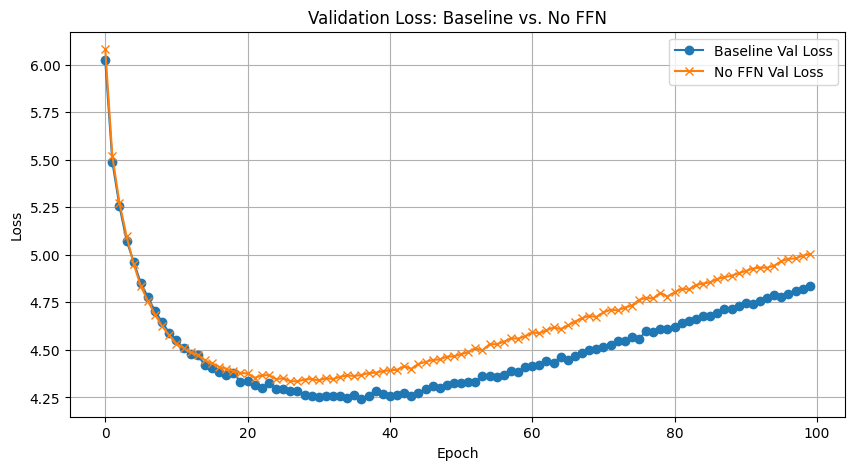

In [ ]:
# --- Experiment 1: Removing Feed-Forward Layers ---

class EncoderLayerNoFFN(EncoderLayer):
    def forward(self, x: torch.Tensor, mask: Optional[torch.Tensor] = None) -> torch.Tensor:
        _x = self.self_attn(x, x, x, mask)
        x = self.norm1(x + self.dropout(_x))
        # The FFN block is skipped entirely
        return x
        # TODO # Skip FFN

class DecoderLayerNoFFN(DecoderLayer):
    def forward(self, x: torch.Tensor, encoder_output: torch.Tensor, src_mask: Optional[torch.Tensor] = None, tgt_mask: Optional[torch.Tensor] = None) -> torch.Tensor:
        # Masked self-attention block
        _x = self.self_attn(x, x, x, tgt_mask)
        x = self.norm1(x + self.dropout(_x))
        # Cross-attention block
        _x = self.cross_attn(x, encoder_output, encoder_output, src_mask)
        x = self.norm2(x + self.dropout(_x))
        # The FFN block is skipped entirely
        return x

class EncoderNoFFN(Encoder):
    def __init__(self, n_layers: int, d_model: int, n_heads: int, d_ff: int, dropout: float = 0.1):
        super().__init__(n_layers, d_model, n_heads, d_ff, dropout)
        # Use the layer type that has no FFN
        self.layers = nn.ModuleList([EncoderLayerNoFFN(d_model, n_heads, d_ff, dropout) for _ in range(n_layers)])
        self.norm = nn.LayerNorm(d_model)

class DecoderNoFFN(Decoder):
     def __init__(self, n_layers: int, d_model: int, n_heads: int, d_ff: int, dropout: float = 0.1):
        super().__init__(n_layers, d_model, n_heads, d_ff, dropout)
        self.layers = nn.ModuleList([DecoderLayerNoFFN(d_model, n_heads, d_ff, dropout) for _ in range(n_layers)])
        self.norm = nn.LayerNorm(d_model)

class TransformerNoFFN(TinyTransformer):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.encoder = EncoderNoFFN(kwargs['n_layers'], kwargs['d_model'], kwargs['n_heads'], kwargs['d_ff'], kwargs['dropout'])
        self.decoder = DecoderNoFFN(kwargs['n_layers'], kwargs['d_model'], kwargs['n_heads'], kwargs['d_ff'], kwargs['dropout'])
        self._init_parameters()

# TODO
model_no_ffn = TransformerNoFFN(src_vocab_size, tgt_vocab_size, **MODEL_CONFIGS['multi_head']).to(device)
params_baseline = count_parameters(model_multi)
params_no_ffn = count_parameters(model_no_ffn)
reduction = 100 * (1 - params_no_ffn / params_baseline)
print(f"1. Parameter Reduction after removing FFNs: {reduction:.2f}%")


# 2. Train this model and plot its validation loss
optimizer_no_ffn = optim.Adam(model_no_ffn.parameters(), lr=LEARNING_RATE)
val_losses_no_ffn = []
print("\n--- Training Model with No Feed-Forward Networks ---")
for epoch in trange(N_EPOCHS, desc="No FFN Epochs"):
    _ = train_epoch(model_no_ffn, train_loader, optimizer_no_ffn, criterion)
    val_loss = evaluate(model_no_ffn, val_loader, criterion)
    val_losses_no_ffn.append(val_loss)
    print(f"Epoch {epoch+1:02} | Val Loss: {val_loss:.3f}")

print("\n2. Plotting Validation Loss Curve:")
plt.figure(figsize=(10, 5))
plt.plot(val_losses_multi, label='Baseline Val Loss', marker='o')
plt.plot(val_losses_no_ffn, label='No FFN Val Loss', marker='x')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Validation Loss: Baseline vs. No FFN')
plt.legend()
plt.grid(True)
plt.show()
# Answer the questions by training the model

# Explanation 2B
The plot clearly shows that the model without the FFN sub-layer (the orange line with 'x' markers) performs significantly worse than the baseline model (the blue line with 'o' markers). The baseline model reaches a lower minimum validation loss and maintains a better performance throughout the training process. The model without the FFN sub-layer struggles to bring its loss down and has a final validation loss that is substantially higher.

# FFNs are crucial because:

FFNs use a non-linear activation function (like ReLU) between two linear layers. This allows the model to learn complex patterns that a purely linear model couldn't. It's like needing curves to draw a circle, not just straight lines.

While the attention mechanism considers all words, the FFN processes each word's representation individually. This allows the model to deeply transform the context-aware information from the attention layer, enabling it to better capture the nuances of the data.

# PART:3 (Attention Modulation)

 - Implement Token Distance as an Attention Bias (as asked in assignemnt)

## Soultion 3(A)

In [8]:
# ==============================================================================
# TOOD: ATTENTION MODULATION (Token Distance Bias)
# ==============================================================================

class DistanceAwareMultiHeadAttention(MultiHeadAttention):
    def __init__(self, d_model: int, n_heads: int, dropout: float = 0.1, max_seq_len: int = 128):
        super().__init__(d_model, n_heads, dropout)
        # Create a distance bias matrix that is not a model parameter
        # TOOD

        # We can use a learnable parameter to scale the distance penalty
        # TOOD) # Negative to penalize distance

        # Create a bias tensor. We use the absolute distance.
        # Think how could you make penalty less harsh for closer tokens.
        # Learnable scalar to scale the distance penalty. Initialized to be negative.
        self.distance_scale = nn.Parameter(torch.tensor(-0.1))

        # Create a non-learnable distance matrix based on absolute position difference
        pos = torch.arange(max_seq_len, dtype=torch.float, device=device).unsqueeze(0)
        dist_matrix = torch.abs(pos - pos.T)
        self.register_buffer('distance_bias', dist_matrix)

    def scaled_dot_product_attention(self, Q, K, V, mask=None):
        scores = torch.matmul(Q, K.transpose(-2, -1)) / math.sqrt(self.d_k)

        # Add the distance bias before the mask and softmax
        seq_len = Q.size(-2)
        # The bias is broadcast across the batch and head dimensions
        bias = self.distance_scale * self.distance_bias[:seq_len, :seq_len]
        scores = scores + bias

        if mask is not None:
            scores = scores.masked_fill(mask == 0, -1e9)

        attention_weights = F.softmax(scores, dim=-1)
        output = torch.matmul(self.dropout(attention_weights), V)
        return output, attention_weights

class EncoderLayerDistanceAware(EncoderLayer):
    def __init__(self, d_model: int, n_heads: int, d_ff: int, dropout: float = 0.1, max_seq_len: int = 128):
        super().__init__(d_model, n_heads, d_ff, dropout)
        self.self_attn = DistanceAwareMultiHeadAttention(d_model, n_heads, dropout, max_seq_len)
        self.ff = FeedForward(d_model, d_ff, dropout)
        self.norm1 = nn.LayerNorm(d_model)
        self.norm2 = nn.LayerNorm(d_model)
        self.dropout = nn.Dropout(dropout)

class EncoderDistanceAware(Encoder):
    def __init__(self, n_layers: int, d_model: int, n_heads: int, d_ff: int, dropout: float = 0.1, max_seq_len: int = 128):
        super().__init__(n_layers, d_model, n_heads, d_ff, dropout)
        self.layers = nn.ModuleList([EncoderLayerDistanceAware(d_model, n_heads, d_ff, dropout, max_seq_len) for _ in range(n_layers)])
        self.norm = nn.LayerNorm(d_model)

class TransformerDistanceAware(TinyTransformer):
     def __init__(self, *args, **kwargs):
        max_seq_len = kwargs.get('max_seq_len', 128)
        super().__init__(*args, **kwargs)

        # Only modify the encoder for this experiment for simplicity (You may choose)
        self.encoder = EncoderDistanceAware(kwargs['n_layers'], kwargs['d_model'], kwargs['n_heads'], kwargs['d_ff'], kwargs['dropout'], max_seq_len)
        self._init_parameters()


---
### Distance-Based Biasing in Attention

The technique used here is **distance-based biasing**, where a penalty term is added to the pre-softmax attention scores.  
This penalty is proportional to the absolute distance between tokens.

---

#### Standard Attention:
$$
\text{Attention}(Q, K, V) = \text{softmax}\left(\frac{QK^T}{\sqrt{d_k}}\right)V
$$

#### Modified Attention with Distance Bias:
$$
\text{Attention}(Q, K, V) = \text{softmax}\left(\frac{QK^T}{\sqrt{d_k}} + B\right)V
$$

Where \(B\) is the **distance bias matrix**, defined as:
$$
B_{ij} = \alpha \cdot |i - j|
$$

- \(i, j\) → positional indices of query and key tokens  
- \(|i - j|\) → absolute relative distance between tokens  
- \(\alpha\) → learnable scalar parameter (`self.distance_scale`), initialized negative (e.g., `-0.1`) so that the bias acts as a **penalty**  

---

**Effect**:  
This modification penalizes attention scores for tokens that are farther apart, encouraging the model to focus more on **nearby tokens**.


## Solution 3(B)


--- Training Model with Distance-Aware Attention ---


Training: 100%|█████████▉| 468/469 [00:23<00:00, 22.80it/s]
                                                           
Distance-Aware Epochs:   1%|          | 1/100 [00:24<40:38, 24.63s/it]

Epoch 01 | Val Loss: 6.010 | Dist Scale: -0.1086



Training: 100%|█████████▉| 468/469 [00:22<00:00, 24.15it/s]
                                                           
Distance-Aware Epochs:   2%|▏         | 2/100 [00:48<39:37, 24.26s/it]

Epoch 02 | Val Loss: 5.464 | Dist Scale: -0.1533



Training: 100%|██████████| 469/469 [00:23<00:00, 22.84it/s]
                                                           
Distance-Aware Epochs:   3%|▎         | 3/100 [01:12<39:15, 24.28s/it]

Epoch 03 | Val Loss: 5.210 | Dist Scale: -0.1852



Training: 100%|██████████| 469/469 [00:22<00:00, 21.29it/s]
                                                           
Distance-Aware Epochs:   4%|▍         | 4/100 [01:37<38:44, 24.21s/it]

Epoch 04 | Val Loss: 5.045 | Dist Scale: -0.2191



Training: 100%|█████████▉| 467/469 [00:23<00:00, 17.10it/s]
                                                           
Distance-Aware Epochs:   5%|▌         | 5/100 [02:01<38:26, 24.28s/it]

Epoch 05 | Val Loss: 4.930 | Dist Scale: -0.2439



Training: 100%|█████████▉| 467/469 [00:23<00:00, 17.95it/s]
                                                           
Distance-Aware Epochs:   6%|▌         | 6/100 [02:26<38:22, 24.49s/it]

Epoch 06 | Val Loss: 4.844 | Dist Scale: -0.2645



Training: 100%|█████████▉| 467/469 [00:22<00:00, 20.11it/s]
                                                           
Distance-Aware Epochs:   7%|▋         | 7/100 [02:51<38:04, 24.57s/it]

Epoch 07 | Val Loss: 4.753 | Dist Scale: -0.2806



Training: 100%|██████████| 469/469 [00:22<00:00, 22.53it/s]
                                                           
Distance-Aware Epochs:   8%|▊         | 8/100 [03:15<37:38, 24.54s/it]

Epoch 08 | Val Loss: 4.684 | Dist Scale: -0.2942



Training: 100%|██████████| 469/469 [00:23<00:00, 21.04it/s]
                                                           
Distance-Aware Epochs:   9%|▉         | 9/100 [03:40<37:14, 24.55s/it]

Epoch 09 | Val Loss: 4.644 | Dist Scale: -0.3032



Training: 100%|█████████▉| 467/469 [00:23<00:00, 22.18it/s]
                                                           
Distance-Aware Epochs:  10%|█         | 10/100 [04:04<36:54, 24.61s/it]

Epoch 10 | Val Loss: 4.587 | Dist Scale: -0.3111



Training: 100%|██████████| 469/469 [00:23<00:00, 21.66it/s]
                                                           
Distance-Aware Epochs:  11%|█         | 11/100 [04:29<36:36, 24.68s/it]

Epoch 11 | Val Loss: 4.550 | Dist Scale: -0.3175



Training: 100%|█████████▉| 468/469 [00:23<00:00, 21.84it/s]
                                                           
Distance-Aware Epochs:  12%|█▏        | 12/100 [04:54<36:15, 24.72s/it]

Epoch 12 | Val Loss: 4.513 | Dist Scale: -0.3240



Training: 100%|██████████| 469/469 [00:23<00:00, 22.27it/s]
                                                           
Distance-Aware Epochs:  13%|█▎        | 13/100 [05:19<35:55, 24.77s/it]

Epoch 13 | Val Loss: 4.478 | Dist Scale: -0.3281



Training: 100%|██████████| 469/469 [00:23<00:00, 22.24it/s]
                                                           
Distance-Aware Epochs:  14%|█▍        | 14/100 [05:44<35:38, 24.86s/it]

Epoch 14 | Val Loss: 4.452 | Dist Scale: -0.3322



Training: 100%|█████████▉| 467/469 [00:23<00:00, 21.64it/s]
                                                           
Distance-Aware Epochs:  15%|█▌        | 15/100 [06:09<35:14, 24.88s/it]

Epoch 15 | Val Loss: 4.431 | Dist Scale: -0.3373



Training: 100%|██████████| 469/469 [00:23<00:00, 21.78it/s]
                                                           
Distance-Aware Epochs:  16%|█▌        | 16/100 [06:34<34:57, 24.98s/it]

Epoch 16 | Val Loss: 4.389 | Dist Scale: -0.3382



Training: 100%|█████████▉| 467/469 [00:24<00:00, 21.56it/s]
                                                           
Distance-Aware Epochs:  17%|█▋        | 17/100 [06:59<34:43, 25.10s/it]

Epoch 17 | Val Loss: 4.372 | Dist Scale: -0.3419



Training: 100%|██████████| 469/469 [00:23<00:00, 21.38it/s]
                                                           
Distance-Aware Epochs:  18%|█▊        | 18/100 [07:25<34:18, 25.11s/it]

Epoch 18 | Val Loss: 4.329 | Dist Scale: -0.3447



Training: 100%|██████████| 469/469 [00:23<00:00, 21.45it/s]
                                                           
Distance-Aware Epochs:  19%|█▉        | 19/100 [07:50<33:54, 25.12s/it]

Epoch 19 | Val Loss: 4.314 | Dist Scale: -0.3445



Training: 100%|█████████▉| 467/469 [00:24<00:00, 21.13it/s]
                                                           
Distance-Aware Epochs:  20%|██        | 20/100 [08:15<33:35, 25.20s/it]

Epoch 20 | Val Loss: 4.310 | Dist Scale: -0.3462



Training: 100%|█████████▉| 468/469 [00:23<00:00, 21.73it/s]
                                                           
Distance-Aware Epochs:  21%|██        | 21/100 [08:40<33:12, 25.23s/it]

Epoch 21 | Val Loss: 4.291 | Dist Scale: -0.3462



Training: 100%|██████████| 469/469 [00:24<00:00, 21.39it/s]
                                                           
Distance-Aware Epochs:  22%|██▏       | 22/100 [09:06<32:51, 25.28s/it]

Epoch 22 | Val Loss: 4.280 | Dist Scale: -0.3450



Training: 100%|██████████| 469/469 [00:24<00:00, 18.26it/s]
                                                           
Distance-Aware Epochs:  23%|██▎       | 23/100 [09:31<32:28, 25.30s/it]

Epoch 23 | Val Loss: 4.267 | Dist Scale: -0.3437



Training: 100%|█████████▉| 467/469 [00:23<00:00, 16.76it/s]
                                                           
Distance-Aware Epochs:  24%|██▍       | 24/100 [09:57<32:03, 25.32s/it]

Epoch 24 | Val Loss: 4.244 | Dist Scale: -0.3418



Training: 100%|██████████| 469/469 [00:23<00:00, 19.87it/s]
                                                           
Distance-Aware Epochs:  25%|██▌       | 25/100 [10:22<31:44, 25.40s/it]

Epoch 25 | Val Loss: 4.240 | Dist Scale: -0.3387



Training: 100%|█████████▉| 468/469 [00:23<00:00, 18.39it/s]
                                                           
Distance-Aware Epochs:  26%|██▌       | 26/100 [10:48<31:24, 25.47s/it]

Epoch 26 | Val Loss: 4.220 | Dist Scale: -0.3346



Training: 100%|██████████| 469/469 [00:23<00:00, 20.07it/s]
                                                           
Distance-Aware Epochs:  27%|██▋       | 27/100 [11:13<31:04, 25.54s/it]

Epoch 27 | Val Loss: 4.216 | Dist Scale: -0.3311



Training: 100%|██████████| 469/469 [00:23<00:00, 20.43it/s]
                                                           
Distance-Aware Epochs:  28%|██▊       | 28/100 [11:39<30:44, 25.62s/it]

Epoch 28 | Val Loss: 4.228 | Dist Scale: -0.3287



Training: 100%|██████████| 469/469 [00:23<00:00, 21.64it/s]
                                                           
Distance-Aware Epochs:  29%|██▉       | 29/100 [12:05<30:21, 25.65s/it]

Epoch 29 | Val Loss: 4.201 | Dist Scale: -0.3243



Training: 100%|█████████▉| 467/469 [00:24<00:00, 20.56it/s]
                                                           
Distance-Aware Epochs:  30%|███       | 30/100 [12:31<30:00, 25.72s/it]

Epoch 30 | Val Loss: 4.185 | Dist Scale: -0.3223



Training: 100%|██████████| 469/469 [00:24<00:00, 21.41it/s]
                                                           
Distance-Aware Epochs:  31%|███       | 31/100 [12:57<29:38, 25.77s/it]

Epoch 31 | Val Loss: 4.203 | Dist Scale: -0.3159



Training: 100%|█████████▉| 468/469 [00:24<00:00, 21.04it/s]
                                                           
Distance-Aware Epochs:  32%|███▏      | 32/100 [13:22<29:08, 25.71s/it]

Epoch 32 | Val Loss: 4.186 | Dist Scale: -0.3125



Training: 100%|██████████| 469/469 [00:24<00:00, 21.34it/s]
                                                           
Distance-Aware Epochs:  33%|███▎      | 33/100 [13:48<28:44, 25.74s/it]

Epoch 33 | Val Loss: 4.196 | Dist Scale: -0.3104



Training: 100%|██████████| 469/469 [00:24<00:00, 21.83it/s]
                                                           
Distance-Aware Epochs:  34%|███▍      | 34/100 [14:14<28:22, 25.80s/it]

Epoch 34 | Val Loss: 4.177 | Dist Scale: -0.3054



Training: 100%|█████████▉| 467/469 [00:24<00:00, 21.45it/s]
                                                           
Distance-Aware Epochs:  35%|███▌      | 35/100 [14:40<27:59, 25.83s/it]

Epoch 35 | Val Loss: 4.183 | Dist Scale: -0.3027



Training: 100%|█████████▉| 468/469 [00:24<00:00, 20.12it/s]
                                                           
Distance-Aware Epochs:  36%|███▌      | 36/100 [15:06<27:36, 25.88s/it]

Epoch 36 | Val Loss: 4.175 | Dist Scale: -0.3011



Training: 100%|██████████| 469/469 [00:24<00:00, 21.99it/s]
                                                           
Distance-Aware Epochs:  37%|███▋      | 37/100 [15:32<27:13, 25.93s/it]

Epoch 37 | Val Loss: 4.179 | Dist Scale: -0.2971



Training: 100%|█████████▉| 468/469 [00:25<00:00, 20.54it/s]
                                                           
Distance-Aware Epochs:  38%|███▊      | 38/100 [15:59<26:57, 26.09s/it]

Epoch 38 | Val Loss: 4.182 | Dist Scale: -0.2951



Training: 100%|█████████▉| 468/469 [00:24<00:00, 20.96it/s]
                                                           
Distance-Aware Epochs:  39%|███▉      | 39/100 [16:25<26:35, 26.15s/it]

Epoch 39 | Val Loss: 4.182 | Dist Scale: -0.2924



Training: 100%|██████████| 469/469 [00:25<00:00, 22.30it/s]
                                                           
Distance-Aware Epochs:  40%|████      | 40/100 [16:51<26:13, 26.23s/it]

Epoch 40 | Val Loss: 4.178 | Dist Scale: -0.2904



Training: 100%|█████████▉| 468/469 [00:24<00:00, 20.51it/s]
                                                           
Distance-Aware Epochs:  41%|████      | 41/100 [17:18<25:52, 26.31s/it]

Epoch 41 | Val Loss: 4.189 | Dist Scale: -0.2872



Training: 100%|██████████| 469/469 [00:25<00:00, 20.56it/s]
                                                           
Distance-Aware Epochs:  42%|████▏     | 42/100 [17:44<25:30, 26.39s/it]

Epoch 42 | Val Loss: 4.201 | Dist Scale: -0.2826



Training: 100%|█████████▉| 468/469 [00:25<00:00, 19.50it/s]
                                                           
Distance-Aware Epochs:  43%|████▎     | 43/100 [18:11<25:08, 26.47s/it]

Epoch 43 | Val Loss: 4.214 | Dist Scale: -0.2823



Training: 100%|█████████▉| 467/469 [00:24<00:00, 20.26it/s]
                                                           
Distance-Aware Epochs:  44%|████▍     | 44/100 [18:37<24:40, 26.45s/it]

Epoch 44 | Val Loss: 4.196 | Dist Scale: -0.2813



Training: 100%|██████████| 469/469 [00:25<00:00, 21.10it/s]
                                                           
Distance-Aware Epochs:  45%|████▌     | 45/100 [19:04<24:17, 26.50s/it]

Epoch 45 | Val Loss: 4.200 | Dist Scale: -0.2787



Training: 100%|█████████▉| 468/469 [00:25<00:00, 20.28it/s]
                                                           
Distance-Aware Epochs:  46%|████▌     | 46/100 [19:30<23:51, 26.51s/it]

Epoch 46 | Val Loss: 4.201 | Dist Scale: -0.2741



Training: 100%|█████████▉| 467/469 [00:25<00:00, 20.94it/s]
                                                           
Distance-Aware Epochs:  47%|████▋     | 47/100 [19:57<23:28, 26.57s/it]

Epoch 47 | Val Loss: 4.215 | Dist Scale: -0.2734



Training: 100%|█████████▉| 467/469 [00:25<00:00, 20.82it/s]
                                                           
Distance-Aware Epochs:  48%|████▊     | 48/100 [20:24<23:05, 26.64s/it]

Epoch 48 | Val Loss: 4.208 | Dist Scale: -0.2711



Training: 100%|█████████▉| 468/469 [00:25<00:00, 19.68it/s]
                                                           
Distance-Aware Epochs:  49%|████▉     | 49/100 [20:51<22:39, 26.65s/it]

Epoch 49 | Val Loss: 4.210 | Dist Scale: -0.2695



Training: 100%|██████████| 469/469 [00:25<00:00, 21.08it/s]
                                                           
Distance-Aware Epochs:  50%|█████     | 50/100 [21:18<22:18, 26.77s/it]

Epoch 50 | Val Loss: 4.233 | Dist Scale: -0.2679



Training: 100%|█████████▉| 467/469 [00:25<00:00, 21.49it/s]
                                                           
Distance-Aware Epochs:  51%|█████     | 51/100 [21:45<21:52, 26.80s/it]

Epoch 51 | Val Loss: 4.249 | Dist Scale: -0.2673



Training: 100%|██████████| 469/469 [00:25<00:00, 20.57it/s]
                                                           
Distance-Aware Epochs:  52%|█████▏    | 52/100 [22:12<21:30, 26.88s/it]

Epoch 52 | Val Loss: 4.261 | Dist Scale: -0.2652



Training: 100%|██████████| 469/469 [00:25<00:00, 19.26it/s]
                                                           
Distance-Aware Epochs:  53%|█████▎    | 53/100 [22:39<21:04, 26.90s/it]

Epoch 53 | Val Loss: 4.255 | Dist Scale: -0.2637



Training: 100%|██████████| 469/469 [00:25<00:00, 20.42it/s]
                                                           
Distance-Aware Epochs:  54%|█████▍    | 54/100 [23:06<20:38, 26.92s/it]

Epoch 54 | Val Loss: 4.276 | Dist Scale: -0.2633



Training: 100%|█████████▉| 467/469 [00:25<00:00, 20.16it/s]
                                                           
Distance-Aware Epochs:  55%|█████▌    | 55/100 [23:33<20:14, 26.99s/it]

Epoch 55 | Val Loss: 4.276 | Dist Scale: -0.2629



Training: 100%|█████████▉| 467/469 [00:25<00:00, 20.29it/s]
                                                           
Distance-Aware Epochs:  56%|█████▌    | 56/100 [24:00<19:55, 27.16s/it]

Epoch 56 | Val Loss: 4.288 | Dist Scale: -0.2599



Training: 100%|█████████▉| 468/469 [00:25<00:00, 17.48it/s]
                                                           
Distance-Aware Epochs:  57%|█████▋    | 57/100 [24:28<19:31, 27.24s/it]

Epoch 57 | Val Loss: 4.296 | Dist Scale: -0.2593



Training: 100%|█████████▉| 468/469 [00:26<00:00, 18.71it/s]
                                                           
Distance-Aware Epochs:  58%|█████▊    | 58/100 [24:55<19:07, 27.33s/it]

Epoch 58 | Val Loss: 4.297 | Dist Scale: -0.2589



Training: 100%|█████████▉| 468/469 [00:25<00:00, 19.02it/s]
                                                           
Distance-Aware Epochs:  59%|█████▉    | 59/100 [25:23<18:41, 27.36s/it]

Epoch 59 | Val Loss: 4.321 | Dist Scale: -0.2564



Training: 100%|█████████▉| 468/469 [00:26<00:00, 18.97it/s]
                                                           
Distance-Aware Epochs:  60%|██████    | 60/100 [25:50<18:16, 27.42s/it]

Epoch 60 | Val Loss: 4.306 | Dist Scale: -0.2570



Training: 100%|█████████▉| 468/469 [00:25<00:00, 18.95it/s]
                                                           
Distance-Aware Epochs:  61%|██████    | 61/100 [26:18<17:48, 27.40s/it]

Epoch 61 | Val Loss: 4.339 | Dist Scale: -0.2547



Training: 100%|█████████▉| 468/469 [00:25<00:00, 20.68it/s]
                                                           
Distance-Aware Epochs:  62%|██████▏   | 62/100 [26:45<17:21, 27.42s/it]

Epoch 62 | Val Loss: 4.337 | Dist Scale: -0.2526



Training: 100%|█████████▉| 468/469 [00:26<00:00, 16.63it/s]
                                                           
Distance-Aware Epochs:  63%|██████▎   | 63/100 [27:13<16:56, 27.48s/it]

Epoch 63 | Val Loss: 4.345 | Dist Scale: -0.2525



Training: 100%|█████████▉| 468/469 [00:26<00:00, 16.03it/s]
                                                           
Distance-Aware Epochs:  64%|██████▍   | 64/100 [27:40<16:31, 27.55s/it]

Epoch 64 | Val Loss: 4.349 | Dist Scale: -0.2515



Training: 100%|█████████▉| 467/469 [00:26<00:00, 15.73it/s]
                                                           
Distance-Aware Epochs:  65%|██████▌   | 65/100 [28:08<16:08, 27.67s/it]

Epoch 65 | Val Loss: 4.356 | Dist Scale: -0.2496



Training: 100%|█████████▉| 468/469 [00:26<00:00, 17.66it/s]
                                                           
Distance-Aware Epochs:  66%|██████▌   | 66/100 [28:36<15:42, 27.71s/it]

Epoch 66 | Val Loss: 4.379 | Dist Scale: -0.2492



Training: 100%|██████████| 469/469 [00:26<00:00, 17.67it/s]
                                                           
Distance-Aware Epochs:  67%|██████▋   | 67/100 [29:04<15:16, 27.78s/it]

Epoch 67 | Val Loss: 4.383 | Dist Scale: -0.2468



Training: 100%|█████████▉| 468/469 [00:26<00:00, 16.26it/s]
                                                           
Distance-Aware Epochs:  68%|██████▊   | 68/100 [29:32<14:50, 27.82s/it]

Epoch 68 | Val Loss: 4.386 | Dist Scale: -0.2457



Training: 100%|█████████▉| 468/469 [00:26<00:00, 16.07it/s]
                                                           
Distance-Aware Epochs:  69%|██████▉   | 69/100 [30:00<14:24, 27.90s/it]

Epoch 69 | Val Loss: 4.402 | Dist Scale: -0.2453



Training: 100%|██████████| 469/469 [00:26<00:00, 18.34it/s]
                                                           
Distance-Aware Epochs:  70%|███████   | 70/100 [30:28<14:00, 28.02s/it]

Epoch 70 | Val Loss: 4.409 | Dist Scale: -0.2472



Training: 100%|█████████▉| 468/469 [00:26<00:00, 17.19it/s]
                                                           
Distance-Aware Epochs:  71%|███████   | 71/100 [30:57<13:33, 28.07s/it]

Epoch 71 | Val Loss: 4.424 | Dist Scale: -0.2456



Training: 100%|█████████▉| 468/469 [00:26<00:00, 19.33it/s]
                                                           
Distance-Aware Epochs:  72%|███████▏  | 72/100 [31:25<13:09, 28.19s/it]

Epoch 72 | Val Loss: 4.444 | Dist Scale: -0.2457



Training: 100%|█████████▉| 467/469 [00:26<00:00, 19.16it/s]
                                                           
Distance-Aware Epochs:  73%|███████▎  | 73/100 [31:53<12:42, 28.22s/it]

Epoch 73 | Val Loss: 4.446 | Dist Scale: -0.2434



Training: 100%|██████████| 469/469 [00:26<00:00, 19.03it/s]
                                                           
Distance-Aware Epochs:  74%|███████▍  | 74/100 [32:22<12:13, 28.22s/it]

Epoch 74 | Val Loss: 4.468 | Dist Scale: -0.2426



Training: 100%|█████████▉| 468/469 [00:27<00:00, 18.04it/s]
                                                           
Distance-Aware Epochs:  75%|███████▌  | 75/100 [32:50<11:49, 28.36s/it]

Epoch 75 | Val Loss: 4.474 | Dist Scale: -0.2406



Training: 100%|█████████▉| 468/469 [00:27<00:00, 20.47it/s]
                                                           
Distance-Aware Epochs:  76%|███████▌  | 76/100 [33:19<11:23, 28.48s/it]

Epoch 76 | Val Loss: 4.485 | Dist Scale: -0.2404



Training: 100%|█████████▉| 467/469 [00:26<00:00, 21.00it/s]
                                                           
Distance-Aware Epochs:  77%|███████▋  | 77/100 [33:48<10:55, 28.51s/it]

Epoch 77 | Val Loss: 4.479 | Dist Scale: -0.2408



Training: 100%|█████████▉| 467/469 [00:27<00:00, 19.22it/s]
                                                           
Distance-Aware Epochs:  78%|███████▊  | 78/100 [34:17<10:30, 28.67s/it]

Epoch 78 | Val Loss: 4.495 | Dist Scale: -0.2383



Training: 100%|█████████▉| 467/469 [00:27<00:00, 17.93it/s]
                                                           
Distance-Aware Epochs:  79%|███████▉  | 79/100 [34:46<10:05, 28.82s/it]

Epoch 79 | Val Loss: 4.501 | Dist Scale: -0.2401



Training: 100%|█████████▉| 467/469 [00:27<00:00, 19.45it/s]
                                                           
Distance-Aware Epochs:  80%|████████  | 80/100 [35:15<09:38, 28.93s/it]

Epoch 80 | Val Loss: 4.511 | Dist Scale: -0.2376



Training: 100%|█████████▉| 467/469 [00:27<00:00, 19.03it/s]
                                                           
Distance-Aware Epochs:  81%|████████  | 81/100 [35:44<09:11, 29.01s/it]

Epoch 81 | Val Loss: 4.525 | Dist Scale: -0.2378



Training: 100%|█████████▉| 468/469 [00:27<00:00, 20.14it/s]
                                                           
Distance-Aware Epochs:  82%|████████▏ | 82/100 [36:13<08:43, 29.09s/it]

Epoch 82 | Val Loss: 4.527 | Dist Scale: -0.2384



Training: 100%|█████████▉| 468/469 [00:27<00:00, 19.71it/s]
                                                           
Distance-Aware Epochs:  83%|████████▎ | 83/100 [36:43<08:14, 29.08s/it]

Epoch 83 | Val Loss: 4.553 | Dist Scale: -0.2374



Training: 100%|█████████▉| 468/469 [00:27<00:00, 20.36it/s]
                                                           
Distance-Aware Epochs:  84%|████████▍ | 84/100 [37:12<07:45, 29.07s/it]

Epoch 84 | Val Loss: 4.551 | Dist Scale: -0.2372



Training: 100%|█████████▉| 468/469 [00:27<00:00, 19.56it/s]
                                                           
Distance-Aware Epochs:  85%|████████▌ | 85/100 [37:41<07:17, 29.18s/it]

Epoch 85 | Val Loss: 4.574 | Dist Scale: -0.2355



Training: 100%|█████████▉| 467/469 [00:27<00:00, 16.93it/s]
                                                           
Distance-Aware Epochs:  86%|████████▌ | 86/100 [38:11<06:51, 29.36s/it]

Epoch 86 | Val Loss: 4.579 | Dist Scale: -0.2355



Training: 100%|█████████▉| 468/469 [00:27<00:00, 18.19it/s]
                                                           
Distance-Aware Epochs:  87%|████████▋ | 87/100 [38:40<06:21, 29.33s/it]

Epoch 87 | Val Loss: 4.590 | Dist Scale: -0.2349



Training: 100%|█████████▉| 467/469 [00:27<00:00, 17.27it/s]
                                                           
Distance-Aware Epochs:  88%|████████▊ | 88/100 [39:10<05:54, 29.50s/it]

Epoch 88 | Val Loss: 4.625 | Dist Scale: -0.2342



Training: 100%|██████████| 469/469 [00:27<00:00, 18.48it/s]
                                                           
Distance-Aware Epochs:  89%|████████▉ | 89/100 [39:39<05:24, 29.51s/it]

Epoch 89 | Val Loss: 4.621 | Dist Scale: -0.2348



Training: 100%|█████████▉| 468/469 [00:27<00:00, 16.09it/s]
                                                           
Distance-Aware Epochs:  90%|█████████ | 90/100 [40:09<04:55, 29.60s/it]

Epoch 90 | Val Loss: 4.624 | Dist Scale: -0.2336



Training: 100%|█████████▉| 468/469 [00:28<00:00, 18.25it/s]
                                                           
Distance-Aware Epochs:  91%|█████████ | 91/100 [40:39<04:27, 29.76s/it]

Epoch 91 | Val Loss: 4.633 | Dist Scale: -0.2330



Training: 100%|██████████| 469/469 [00:28<00:00, 18.48it/s]
                                                           
Distance-Aware Epochs:  92%|█████████▏| 92/100 [41:10<03:59, 29.93s/it]

Epoch 92 | Val Loss: 4.634 | Dist Scale: -0.2325



Training: 100%|█████████▉| 468/469 [00:27<00:00, 19.23it/s]
                                                           
Distance-Aware Epochs:  93%|█████████▎| 93/100 [41:40<03:29, 29.89s/it]

Epoch 93 | Val Loss: 4.654 | Dist Scale: -0.2331



Training: 100%|██████████| 469/469 [00:28<00:00, 19.46it/s]
                                                           
Distance-Aware Epochs:  94%|█████████▍| 94/100 [42:10<03:00, 30.06s/it]

Epoch 94 | Val Loss: 4.683 | Dist Scale: -0.2308



Training: 100%|██████████| 469/469 [00:28<00:00, 18.57it/s]
                                                           
Distance-Aware Epochs:  95%|█████████▌| 95/100 [42:41<02:31, 30.20s/it]

Epoch 95 | Val Loss: 4.684 | Dist Scale: -0.2318



Training: 100%|█████████▉| 468/469 [00:29<00:00, 16.01it/s]
                                                           
Distance-Aware Epochs:  96%|█████████▌| 96/100 [43:12<02:01, 30.49s/it]

Epoch 96 | Val Loss: 4.692 | Dist Scale: -0.2311



Training: 100%|██████████| 469/469 [00:28<00:00, 18.52it/s]
                                                           
Distance-Aware Epochs:  97%|█████████▋| 97/100 [43:42<01:31, 30.44s/it]

Epoch 97 | Val Loss: 4.704 | Dist Scale: -0.2323



Training: 100%|█████████▉| 467/469 [00:28<00:00, 16.55it/s]
                                                           
Distance-Aware Epochs:  98%|█████████▊| 98/100 [44:13<01:01, 30.51s/it]

Epoch 98 | Val Loss: 4.705 | Dist Scale: -0.2314



Training: 100%|█████████▉| 468/469 [00:28<00:00, 18.00it/s]
                                                           
Distance-Aware Epochs:  99%|█████████▉| 99/100 [44:43<00:30, 30.56s/it]

Epoch 99 | Val Loss: 4.732 | Dist Scale: -0.2309



Training: 100%|██████████| 469/469 [00:29<00:00, 19.84it/s]
                                                           
Distance-Aware Epochs: 100%|██████████| 100/100 [45:14<00:00, 27.15s/it]


Epoch 100 | Val Loss: 4.724 | Dist Scale: -0.2311

--- Final Performance Comparison ---


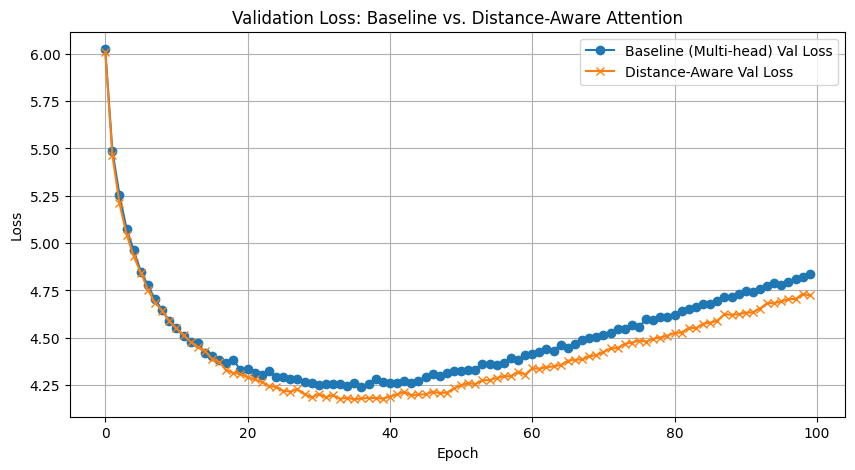


--- Visualizing Distance-Aware Encoder Self-Attention ---
Visualizing for sentence: 'Die Katze sitzt auf dem Tisch.'


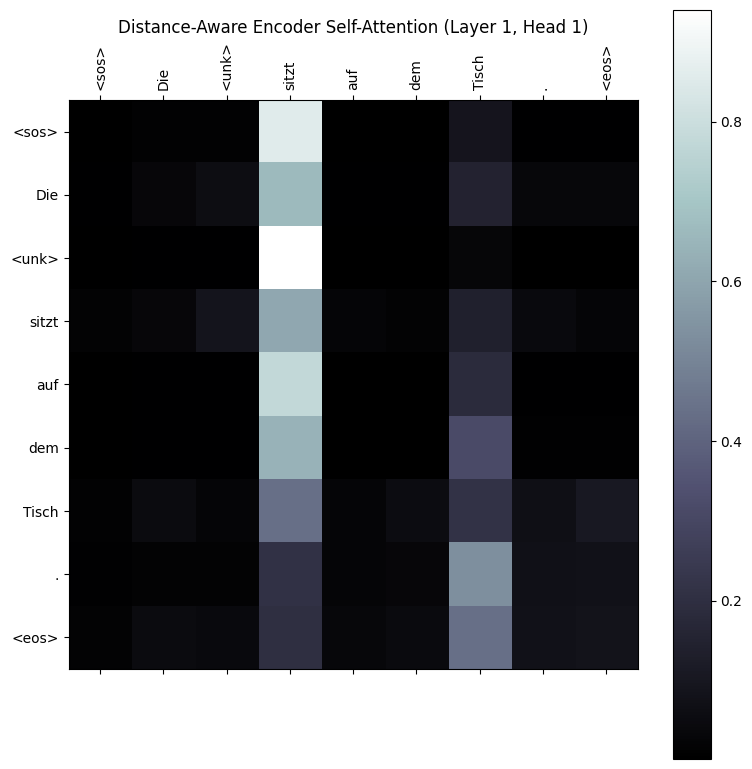


Assignment complete.


In [9]:

# TODO

# Train the Model

# --- Plot Final Comparison between validation loss 'Baseline (Multi-head)' and 'Distance-Aware Attention' ---
model_dist_aware = TransformerDistanceAware(src_vocab_size, tgt_vocab_size, **MODEL_CONFIGS['multi_head']).to(device)
optimizer_da = optim.Adam(model_dist_aware.parameters(), lr=LEARNING_RATE)
val_losses_da = []

print("\n--- Training Model with Distance-Aware Attention ---")
for epoch in trange(N_EPOCHS, desc="Distance-Aware Epochs"):
    _ = train_epoch(model_dist_aware, train_loader, optimizer_da, criterion)
    val_loss = evaluate(model_dist_aware, val_loader, criterion)
    val_losses_da.append(val_loss)
    # Print the learned scale parameter to see how it changes
    print(f"Epoch {epoch+1:02} | Val Loss: {val_loss:.3f} | Dist Scale: {model_dist_aware.encoder.layers[0].self_attn.distance_scale.item():.4f}")


# Plot a final comparison of validation losses
print("\n--- Final Performance Comparison ---")
plt.figure(figsize=(10, 5))
plt.plot(val_losses_multi, label='Baseline (Multi-head) Val Loss', marker='o')
plt.plot(val_losses_da, label='Distance-Aware Val Loss', marker='x')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Validation Loss: Baseline vs. Distance-Aware Attention')
plt.legend()
plt.grid(True)
plt.show()


# Visualize the attention patterns from this new model
print("\n--- Visualizing Distance-Aware Encoder Self-Attention ---")
test_sentence = "Die Katze sitzt auf dem Tisch."
print(f"Visualizing for sentence: '{test_sentence}'")
# Get the attention weights from the trained model
translation, tgt_indices = translate_sentence(model_dist_aware, test_sentence)
src_tokens = [SOS_IDX] + de_tokenizer.encode(test_sentence).ids + [EOS_IDX]
src_tokens_str = [de_tokenizer.id_to_token(i) for i in src_tokens]
# Get weights from the first layer, first batch item, first head
attn = model_dist_aware.get_attention_weights()['encoder_self_attention'][0][0,0]
plot_attention_matrix(attn, src_tokens_str, src_tokens_str, "Distance-Aware Encoder Self-Attention (Layer 1, Head 1)")



print("\nAssignment complete.")

# Expl 3B
---
### Performance Evaluation

The validation loss plots show that the **distance-aware attention model** performs better than the baseline.  
The orange line (distance-aware) remains below the blue line (baseline), indicating improved learning and lower final loss.  
This suggests the distance bias helps the model generalize more effectively.

---

### Attention Pattern Analysis

The attention heatmap from the distance-aware encoder shows a **strong diagonal pattern**:  
- Tokens mostly attend to themselves and nearby tokens.  
- Attention to distant tokens is penalized, leading to a rapid drop-off away from the diagonal.  

In contrast, standard attention may focus strongly on distant but related tokens.  
By prioritizing local context, distance-aware attention introduces an **inductive bias** that is especially useful in tasks where local dependencies matter (e.g., translation, language modeling).
